# ST-GAN Furniture Placement Pipeline — Clean Dataset Edition

This notebook implements the full modular furniture placement pipeline (PlacementNet + ST-GAN + Harmonization)
using **clean paired data** from **Structured3D** (primary) with **RoomBench++** as fallback.

**Key improvement over V2:** Instead of noisy LaMa-inpainted rooms and Mask2Former-extracted crops,
this notebook uses renderer-produced paired images with pixel-perfect instance masks. This eliminates
the dataset quality bottleneck identified in V2.

### Pipeline Architecture
```
Stage A: Room Understanding (segmentation + depth from GT annotations or Mask2Former)
Stage B: PlacementNet (room + furniture features -> bbox prediction)
Stage C: ST-GAN Warp Refinement (deterministic multi-step, real alpha masks)
Stage D: Harmonization (seam-only blend + contact shadow)
Stage E: Evaluation (per-subtask + fair p_init=0 ablation)
```


---
## Part 1: Environment Setup


In [1]:
!pip install -q numpy scipy imageio matplotlib pandas pillow tqdm opencv-python-headless lpips

import tensorflow as tf
print(f'TensorFlow version: {tf.__version__}')

tf1 = tf.compat.v1
tf1.disable_eager_execution()
print('TF1 compat mode enabled (eager execution disabled).')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 4.9 MB/s eta 0:00:00
TensorFlow version: 2.20.0
TF1 compat mode enabled (eager execution disabled).


In [2]:
import os, sys, time, shutil, warnings
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFilter
from tqdm.auto import tqdm
import pandas as pd
import cv2
import scipy.linalg
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'PyTorch device: {DEVICE}')

# Clone ST-GAN repository
STGAN_DIR = '/content/spatial-transformer-GAN'
if not os.path.isdir(STGAN_DIR):
    !git clone https://github.com/chenhsuanlin/spatial-transformer-GAN.git {STGAN_DIR}
    print('ST-GAN repo cloned.')
else:
    print(f'ST-GAN repo already at {STGAN_DIR}')

INDOOR_DIR = os.path.join(STGAN_DIR, 'indoor')
STGAN_REPO = INDOOR_DIR  # Fix: was undefined in original notebook

if INDOOR_DIR not in sys.path:
    sys.path.insert(0, INDOOR_DIR)
    print(f'Added {INDOOR_DIR} to sys.path')

# ST-GAN spatial dimensions
STGAN_H, STGAN_W = 120, 160
WARP_N = 4  # Multi-step warp (original paper uses 4-5, NOT 1)
BLEND_SIZE = 512

SAMPLE_DIR = '/content/drive/MyDrive/693-project/samples/stgan_v2'
os.makedirs(SAMPLE_DIR, exist_ok=True)

print(f'\nConstants: STGAN_H={STGAN_H}, STGAN_W={STGAN_W}, WARP_N={WARP_N}, BLEND_SIZE={BLEND_SIZE}')

PyTorch device: cuda
Cloning into '/content/spatial-transformer-GAN'...
remote: Enumerating objects: 115, done.
remote: Total 115 (delta 0), reused 0 (delta 0), pack-reused 115 (from 1)
Receiving objects: 100% (115/115), 1.32 MiB | 50.04 MiB/s, done.
Resolving deltas: 100% (54/54), done.
ST-GAN repo cloned.
Added /content/spatial-transformer-GAN/indoor to sys.path

Constants: STGAN_H=120, STGAN_W=160, WARP_N=4, BLEND_SIZE=512


---
## Part 2: Dataset Loading — Structured3D (Primary) / RoomBench++ (Fallback)

### Why Structured3D?
- **Paired empty/furnished renders** with pixel-perfect alignment (no LaMa artifacts)
- **Instance segmentation maps** from renderer (no Mask2Former noise)
- **Depth + normal maps** included (free room understanding)
- **~21,000 rooms** across 3,500 houses -> easily 20K-50K clean training pairs

### Fallback: RoomBench++
If Structured3D is not yet available, the notebook falls back to RoomBench++ (112K pairs
purpose-built for furniture synthesis). Email stonecutter-21/roomeditor authors for full data.


### Dataset Download Instructions

**Option A: Structured3D (Recommended)**
1. Go to https://structured3d-dataset.org/
2. Fill out the agreement form (takes ~24-48h for approval)
3. Download the `Structured3D_perspective_full` subset (or at minimum the `2D_rendering` portion)
4. Upload to Google Drive at: `MyDrive/693-project/data/structured3d/`
5. Expected structure: `structured3d/scene_00000/2D_rendering/room_*/perspective/*/full/rgb_rawlight.png`

**Option B: RoomBench++ (Fallback)**
1. Go to https://github.com/stonecutter-21/roomeditor
2. Email the authors requesting full training data access
3. Download and upload to: `MyDrive/693-project/data/roombench/`
4. Expected structure: `roombench/train.json`, `roombench/images/`, `roombench/masks/`

**Option C: HuggingFace Structured3D (alternative download)**
If the official form is slow, a processed version exists at `huggingface.co/datasets/huanngzh/3D-Front`
(35.7 GB render subset). Use the cell below to download directly.


In [ ]:
# ---- Download Structured3D (to Colab LOCAL disk, not Drive) ----
# Strategy: Download raw zips to /content/ (ephemeral, ~107 GB free),
# process into compact numpy arrays, save ONLY the processed result to Drive (~1-2 GB).
# This way you don't fill up your Drive with raw data.
#
# Each zip = ~5-8 GB = ~195 scenes = ~3K-5K training pairs.
# Start with just 1 zip. That's already more clean data than your old 3K noisy pipeline.

S3D_BASE = "https://zju-kjl-jointlab-azure.kujiale.com/Structured3D"
LOCAL_DIR = "/content/structured3d_raw"  # Ephemeral Colab storage
os.makedirs(LOCAL_DIR, exist_ok=True)

# Download just 1 zip of each (full + empty) -- about 10-16 GB total
# Change to ['00', '01'] for more data if you have disk space
ZIPS_TO_DOWNLOAD = ['00']  # ~195 scenes, ~3K-5K pairs

print(f"Downloading {len(ZIPS_TO_DOWNLOAD)} zip(s) to LOCAL Colab disk (not Drive)...")
print(f"  This won't use any of your Drive storage.")
print(f"  Local disk free: {shutil.disk_usage('/content').free / 1e9:.1f} GB")
print()

for z in ZIPS_TO_DOWNLOAD:
    # Download perspective_full (furnished rooms with instance masks)
    url_full = f"{S3D_BASE}/Structured3D_perspective_full_{z}.zip"
    out_full = f"{LOCAL_DIR}/perspective_full_{z}.zip"
    if not os.path.isfile(out_full):
        print(f"  Downloading perspective_full_{z}.zip ...")
        !wget -q --show-progress -O "{out_full}" "{url_full}"
    else:
        print(f"  Already have perspective_full_{z}.zip")

    # Download perspective_empty (empty rooms)
    url_empty = f"{S3D_BASE}/Structured3D_perspective_empty_{z}.zip"
    out_empty = f"{LOCAL_DIR}/perspective_empty_{z}.zip"
    if not os.path.isfile(out_empty):
        print(f"  Downloading perspective_empty_{z}.zip ...")
        !wget -q --show-progress -O "{out_empty}" "{url_empty}"
    else:
        print(f"  Already have perspective_empty_{z}.zip")

# Download bbox annotations (small, ~100 MB)
url_bbox = f"{S3D_BASE}/Structured3D_bbox.zip"
out_bbox = f"{LOCAL_DIR}/bbox.zip"
if not os.path.isfile(out_bbox):
    print(f"  Downloading bbox annotations...")
    !wget -q --show-progress -O "{out_bbox}" "{url_bbox}"

print(f"\nDisk usage after download: {shutil.disk_usage('/content').free / 1e9:.1f} GB free")

# ---- Extract ----
import zipfile

EXTRACT_DIR = "/content/Structured3D"
os.makedirs(EXTRACT_DIR, exist_ok=True)

print("\nExtracting (this may take a few minutes)...")
for z in ZIPS_TO_DOWNLOAD:
    for prefix in ['perspective_full', 'perspective_empty']:
        zpath = f"{LOCAL_DIR}/{prefix}_{z}.zip"
        if os.path.isfile(zpath):
            print(f"  Extracting {prefix}_{z}.zip ...")
            with zipfile.ZipFile(zpath, 'r') as zf:
                zf.extractall("/content")
            # Delete zip after extraction to save space
            os.remove(zpath)
            print(f"    Deleted zip to free space")

# Extract bbox
if os.path.isfile(out_bbox):
    print("  Extracting bbox annotations...")
    with zipfile.ZipFile(out_bbox, 'r') as zf:
        zf.extractall("/content")
    os.remove(out_bbox)

# Clean up empty download dir
if os.path.isdir(LOCAL_DIR):
    shutil.rmtree(LOCAL_DIR)

# Set data root
DATA_ROOT = EXTRACT_DIR
DATASET_TYPE = 'structured3d'

# Verify
scene_dirs = sorted([d for d in os.listdir(DATA_ROOT) if d.startswith('scene_')])
print(f"\nExtraction complete!")
print(f"  Scenes available: {len(scene_dirs)}")
print(f"  Disk free: {shutil.disk_usage('/content').free / 1e9:.1f} GB")
print(f"  DATA_ROOT = {DATA_ROOT}")


In [ ]:
from google.colab import drive
if not os.path.ismount('/content/drive'):
    drive.mount('/content/drive')

# ---- Detect which dataset is available ----
# If Cell 6 already set DATA_ROOT (local extraction), keep it.
# Otherwise search local disk first, then Drive.

if 'DATA_ROOT' in dir() and DATA_ROOT is not None and os.path.isdir(DATA_ROOT):
    print(f"DATA_ROOT already set from extraction: {DATA_ROOT}")
else:
    SEARCH_PATHS = [
        # Local Colab disk (extraction targets)
        '/content/Structured3D',
        '/content/structured3d_raw/Structured3D',
        '/content/693-project/data/structured3d',
        '/content/693-project/data/structured3d/Structured3D',
        # Google Drive
        '/content/drive/MyDrive/693-project/data/structured3d/Structured3D',
        '/content/drive/MyDrive/693-project/data/structured3d',
        '/content/drive/MyDrive/structured3d/Structured3D',
        '/content/drive/MyDrive/structured3d',
        '/content/drive/MyDrive/Structured3D',
    ]

    ROOMBENCH_ROOTS = [
        '/content/drive/MyDrive/693-project/data/roombench',
        '/content/drive/MyDrive/roombench',
        '/content/drive/MyDrive/RoomBench',
    ]

    OLD_DATA_ROOTS = [
        '/content/drive/MyDrive/processed-256',
        '/content/drive/MyDrive/693-project/data/processed-256',
        '/content/drive/MyDrive/693-project/processed-256',
        '/content/drive/MyDrive/693 project/processed-256',
    ]

    DATASET_TYPE = None
    DATA_ROOT = None

    for path in SEARCH_PATHS:
        if os.path.isdir(path):
            has_scenes = any(e.startswith('scene_') for e in os.listdir(path))
            if has_scenes:
                DATA_ROOT = path
                DATASET_TYPE = 'structured3d'
                break

    if DATA_ROOT is None:
        for path in ROOMBENCH_ROOTS:
            if os.path.isdir(path) and os.path.isfile(os.path.join(path, 'train.json')):
                DATA_ROOT = path
                DATASET_TYPE = 'roombench'
                break

    if DATA_ROOT is None:
        for path in OLD_DATA_ROOTS:
            if os.path.isfile(os.path.join(path, 'metadata.csv')):
                DATA_ROOT = path
                DATASET_TYPE = 'old_3dfront'
                break

    if DATA_ROOT is None:
        print("WARNING: No dataset found!")
        print("  Checked these paths:")
        for p in SEARCH_PATHS + ROOMBENCH_ROOTS:
            print(f"    {p} -> exists={os.path.isdir(p)}")
        print()
        print("  If you extracted Structured3D manually, set DATA_ROOT directly:")
        print("    DATA_ROOT = '/content/YOUR_PATH_HERE'")
        print("    DATASET_TYPE = 'structured3d'")

# Ensure DATASET_TYPE is set if DATA_ROOT was from Cell 6
if DATA_ROOT is not None and ('DATASET_TYPE' not in dir() or DATASET_TYPE is None):
    has_scenes = any(e.startswith('scene_') for e in os.listdir(DATA_ROOT))
    if has_scenes:
        DATASET_TYPE = 'structured3d'

if DATA_ROOT is not None:
    print(f"Dataset: {DATASET_TYPE}")
    print(f"Path:    {DATA_ROOT}")

    # Quick verification
    scenes = sorted([d for d in os.listdir(DATA_ROOT) if d.startswith('scene_')])
    print(f"Scenes:  {len(scenes)}")
    if scenes:
        s = scenes[0]
        render_dir = os.path.join(DATA_ROOT, s, '2D_rendering')
        if os.path.isdir(render_dir):
            rooms = os.listdir(render_dir)
            print(f"First scene ({s}): {len(rooms)} room(s)")
            if rooms:
                persp = os.path.join(render_dir, rooms[0], 'perspective')
                if os.path.isdir(persp):
                    for cfg in ['full', 'empty']:
                        cfg_dir = os.path.join(persp, cfg)
                        if os.path.isdir(cfg_dir):
                            files = os.listdir(cfg_dir)
                            print(f"  {cfg}/ -> {files[:6]}")
                        else:
                            print(f"  {cfg}/ -> MISSING")


In [ ]:
# ---- Structured3D Data Extraction ----
# Confirmed structure:
#   scene_XXXXX/2D_rendering/ROOM_ID/perspective/full/VIEW_ID/rgb_rawlight.png
#   scene_XXXXX/2D_rendering/ROOM_ID/perspective/empty/VIEW_ID/rgb_rawlight.png
#   scene_XXXXX/2D_rendering/ROOM_ID/perspective/full/VIEW_ID/instance.png
#   scene_XXXXX/2D_rendering/ROOM_ID/perspective/full/VIEW_ID/semantic.png
#   scene_XXXXX/2D_rendering/ROOM_ID/perspective/full/VIEW_ID/depth.png
#
# full/ and empty/ each contain numbered view subdirs: 0, 1, 2, ...
# Each view has its own rgb, instance map, etc.

def load_structured3d(data_root, max_scenes=None, split='train'):
    "Load Structured3D perspective views into training pairs."

    scene_dirs = sorted([d for d in os.listdir(data_root) if d.startswith('scene_')])
    if max_scenes:
        scene_dirs = scene_dirs[:max_scenes]

    n_total = len(scene_dirs)
    if split == 'train':
        scene_dirs = scene_dirs[:int(n_total * 0.8)]
    elif split == 'val':
        scene_dirs = scene_dirs[int(n_total * 0.8):int(n_total * 0.9)]
    else:
        scene_dirs = scene_dirs[int(n_total * 0.9):]

    RGB_NAMES = ['rgb_rawlight.png', 'rgb_coldlight.png', 'rgb_warmlight.png', 'rgb.png']

    records = []

    for scene_name in tqdm(scene_dirs, desc=f'Loading Structured3D ({split})'):
        scene_path = os.path.join(data_root, scene_name)
        render_dir = os.path.join(scene_path, '2D_rendering')
        if not os.path.isdir(render_dir):
            continue

        for room_id in os.listdir(render_dir):
            room_persp = os.path.join(render_dir, room_id, 'perspective')
            if not os.path.isdir(room_persp):
                continue

            full_base = os.path.join(room_persp, 'full')
            empty_base = os.path.join(room_persp, 'empty')

            if not (os.path.isdir(full_base) and os.path.isdir(empty_base)):
                continue

            # Each of full/ and empty/ has numbered view subdirs: 0, 1, 2 ...
            full_views = sorted([v for v in os.listdir(full_base)
                                 if os.path.isdir(os.path.join(full_base, v))])
            empty_views = sorted([v for v in os.listdir(empty_base)
                                  if os.path.isdir(os.path.join(empty_base, v))])

            common_views = sorted(set(full_views) & set(empty_views))

            for view_id in common_views:
                full_dir = os.path.join(full_base, view_id)
                empty_dir = os.path.join(empty_base, view_id)

                full_rgb = None
                empty_rgb = None
                for name in RGB_NAMES:
                    fp = os.path.join(full_dir, name)
                    ep = os.path.join(empty_dir, name)
                    if os.path.isfile(fp):
                        full_rgb = fp
                    if os.path.isfile(ep):
                        empty_rgb = ep
                    if full_rgb and empty_rgb:
                        break

                if not (full_rgb and empty_rgb):
                    continue

                instance_path = os.path.join(full_dir, 'instance.png')
                semantic_path = os.path.join(full_dir, 'semantic.png')
                depth_path = os.path.join(full_dir, 'depth.png')
                normal_path = os.path.join(full_dir, 'normal.png')

                if not os.path.isfile(instance_path):
                    continue

                instance_map = np.array(Image.open(instance_path))

                # Handle RGB-encoded instance maps (R*256*256 + G*256 + B)
                if instance_map.ndim == 3:
                    instance_map = (instance_map[:,:,0].astype(np.int32) * 256 * 256
                                  + instance_map[:,:,1].astype(np.int32) * 256
                                  + instance_map[:,:,2].astype(np.int32))

                semantic_map = None
                if os.path.isfile(semantic_path):
                    sm = np.array(Image.open(semantic_path))
                    if sm.ndim == 3:
                        semantic_map = sm[:,:,0].astype(np.int32)
                    else:
                        semantic_map = sm.astype(np.int32)

                # Skip background (0) only; accept all furniture/object instances
                unique_instances = np.unique(instance_map)
                for inst_id in unique_instances:
                    if inst_id == 0:
                        continue

                    inst_mask = (instance_map == inst_id)

                    # If semantic map exists, skip walls/floor/ceiling
                    if semantic_map is not None:
                        inst_pixels = semantic_map[inst_mask]
                        if len(inst_pixels) == 0:
                            continue
                        dominant_class = int(np.bincount(inst_pixels.flatten()).argmax())
                        SKIP_CLASSES = {0}  # background
                        if dominant_class in SKIP_CLASSES:
                            continue

                    ys, xs = np.where(inst_mask)
                    if len(ys) < 100:
                        continue
                    x1, y1, x2, y2 = int(xs.min()), int(ys.min()), int(xs.max()), int(ys.max())
                    bw, bh = x2 - x1, y2 - y1
                    if bw < 20 or bh < 20:
                        continue

                    records.append({
                        'input_path': empty_rgb,
                        'target_path': full_rgb,
                        'furniture_path': full_rgb,
                        'instance_path': instance_path,
                        'instance_id': int(inst_id),
                        'view_id': view_id,
                        'depth_path': depth_path if os.path.isfile(depth_path) else '',
                        'normal_path': normal_path if os.path.isfile(normal_path) else '',
                        'bbox_x1': float(x1),
                        'bbox_y1': float(y1),
                        'bbox_x2': float(x2),
                        'bbox_y2': float(y2),
                        'img_w': inst_mask.shape[1],
                        'img_h': inst_mask.shape[0],
                    })

    df = pd.DataFrame(records)
    print(f'  Found {len(df)} furniture instances from {len(scene_dirs)} scenes ({split})')
    return df


def load_roombench(data_root, split='train'):
    "Load RoomBench++ format: background + mask + reference furniture."
    meta_path = os.path.join(data_root, f'{split}.json')
    if not os.path.isfile(meta_path):
        print(f'  RoomBench {split}.json not found at {meta_path}')
        return pd.DataFrame()

    with open(meta_path, 'r') as f:
        meta = json.load(f)

    records = []
    for item in tqdm(meta, desc=f'Loading RoomBench ({split})'):
        bg_path = os.path.join(data_root, item.get('background', ''))
        ref_path = os.path.join(data_root, item.get('reference', ''))
        bg_mask_path = os.path.join(data_root, item.get('bg_mask', ''))
        target_path = os.path.join(data_root, item.get('target', item.get('gt', '')))

        if not (os.path.isfile(bg_path) and os.path.isfile(ref_path)):
            continue

        bbox = item.get('bbox', None)
        if bbox is None and os.path.isfile(bg_mask_path):
            m = np.array(Image.open(bg_mask_path).convert('L'))
            ys, xs = np.where(m > 127)
            if len(ys) > 0:
                bbox = [int(xs.min()), int(ys.min()), int(xs.max()), int(ys.max())]
            else:
                bbox = [0, 0, 100, 100]
        if bbox is None:
            bbox = [0, 0, 100, 100]

        records.append({
            'input_path': bg_path,
            'target_path': target_path,
            'furniture_path': ref_path,
            'mask_path': bg_mask_path,
            'bbox_x1': float(bbox[0]),
            'bbox_y1': float(bbox[1]),
            'bbox_x2': float(bbox[2]),
            'bbox_y2': float(bbox[3]),
        })

    df = pd.DataFrame(records)
    print(f'  Loaded {len(df)} pairs from RoomBench ({split})')
    return df


def load_old_3dfront(data_root):
    "Legacy fallback: load the old processed-256 format."
    csv_path = os.path.join(data_root, 'metadata.csv')
    df = pd.read_csv(csv_path)

    def rebase_path(p):
        parts = p.replace('\\', '/').split('/')
        for i, part in enumerate(parts):
            if part in ('train', 'val', 'test'):
                return os.path.join(data_root, *parts[i:])
        return p

    for col in ['input_path', 'target_path', 'furniture_path']:
        df[col] = df[col].apply(rebase_path)
    return df

print('Dataset loading functions defined.')


In [ ]:
# ---- Load the detected dataset ----
# FAST PATH: If processed arrays already exist on Drive, load them directly
# (skips download + extraction entirely)
PROCESSED_DIR = '/content/drive/MyDrive/693-project/data/structured3d_processed'
if os.path.isfile(os.path.join(PROCESSED_DIR, 'train_data.npz')):
    print("Found pre-processed arrays on Drive! Loading directly (fast)...")
    _train = np.load(os.path.join(PROCESSED_DIR, 'train_data.npz'), allow_pickle=True)
    _test = np.load(os.path.join(PROCESSED_DIR, 'test_data.npz'), allow_pickle=True)
    our_train = {k: _train[k] for k in _train.files}
    our_test = {k: _test[k] for k in _test.files}
    DATASET_TYPE = 'structured3d'
    stored_w, stored_h = 160, 120  # STGAN dimensions
    # Create minimal DataFrames for downstream compatibility
    N_train = our_train['removed'].shape[0]
    N_test = our_test['removed'].shape[0]
    train_df = pd.DataFrame({'idx': range(N_train)})
    test_df = pd.DataFrame({'idx': range(N_test)})
    val_df = test_df.copy()
    print(f"  Loaded train: {N_train} samples, test: {N_test} samples")
    print(f"  Skipping download/extraction (already processed)")
    SKIP_LOADING = True
else:
    SKIP_LOADING = False

import json as json_mod

if not SKIP_LOADING:
    if DATASET_TYPE == 'structured3d':
        print('Loading Structured3D dataset...')
        train_df = load_structured3d(DATA_ROOT, split='train')
        val_df = load_structured3d(DATA_ROOT, split='val')
        test_df = load_structured3d(DATA_ROOT, split='test')
    
        # Determine image dimensions from first sample
        sample_img = Image.open(train_df['target_path'].iloc[0])
        stored_w, stored_h = sample_img.size
    
    elif DATASET_TYPE == 'roombench':
        print('Loading RoomBench++ dataset...')
        train_df = load_roombench(DATA_ROOT, split='train')
        val_df = load_roombench(DATA_ROOT, split='val')
        test_df = load_roombench(DATA_ROOT, split='test')
    
        if len(test_df) == 0:
            # RoomBench may only have train/test
            test_df = load_roombench(DATA_ROOT, split='test')
        if len(val_df) == 0:
            val_df = test_df.head(len(test_df) // 2)
    
        sample_img = Image.open(train_df['target_path'].iloc[0])
        stored_w, stored_h = sample_img.size
    
    elif DATASET_TYPE == 'old_3dfront':
        print('Loading legacy processed-256 dataset (LaMa-based, noisy)...')
        print('  WARNING: This is the old noisy dataset. Consider switching to Structured3D.')
        full_df = load_old_3dfront(DATA_ROOT)
    
        sample_img = Image.open(full_df['target_path'].iloc[0])
        stored_w, stored_h = sample_img.size
        bbox_max = max(full_df['bbox_x2'].max(), full_df['bbox_y2'].max())
        if bbox_max > max(stored_w, stored_h):
            orig_w = int(np.ceil(full_df['bbox_x2'].max() / 256) * 256)
            orig_h = int(np.ceil(full_df['bbox_y2'].max() / 256) * 256)
            for c in ['bbox_x1','bbox_x2']: full_df[c] *= stored_w / orig_w
            for c in ['bbox_y1','bbox_y2']: full_df[c] *= stored_h / orig_h
    
        train_df = full_df[full_df['split']=='train'].reset_index(drop=True)
        val_df = full_df[full_df['split']=='val'].reset_index(drop=True)
        test_df = full_df[full_df['split']=='test'].reset_index(drop=True)
    else:
        raise RuntimeError('No dataset detected. Upload Structured3D or RoomBench++ to Drive.')
    
    print(f'\nDataset summary:')
    print(f'  Type: {DATASET_TYPE}')
    print(f'  Image size: {stored_w} x {stored_h}')
    print(f'  Train: {len(train_df)} samples')
    print(f'  Val:   {len(val_df)} samples')
    print(f'  Test:  {len(test_df)} samples')


In [ ]:
# ---- Extract furniture RGBA from dataset ----

def extract_furniture_rgba_structured3d(row):
    """Extract clean RGBA furniture crop from Structured3D instance maps.
    No Mask2Former needed -- instance masks come directly from the renderer."""
    target = np.array(Image.open(row['target_path']).convert('RGB')).astype(np.float32) / 255.0
    instance_map = np.array(Image.open(row['instance_path']))
    inst_mask = (instance_map == row['instance_id']).astype(np.float32)

    x1, y1, x2, y2 = int(row['bbox_x1']), int(row['bbox_y1']), int(row['bbox_x2']), int(row['bbox_y2'])

    # Crop RGB and mask
    rgb_crop = target[y1:y2, x1:x2, :]
    mask_crop = inst_mask[y1:y2, x1:x2]

    # Build RGBA
    rgba = np.zeros((*rgb_crop.shape[:2], 4), dtype=np.float32)
    rgba[:, :, :3] = rgb_crop
    rgba[:, :, 3] = mask_crop

    return rgba, mask_crop


def extract_furniture_rgba_roombench(row):
    """Extract RGBA from RoomBench format (reference image + mask)."""
    ref = np.array(Image.open(row['furniture_path']).convert('RGB')).astype(np.float32) / 255.0

    if 'mask_path' in row and os.path.isfile(str(row.get('mask_path', ''))):
        mask = np.array(Image.open(row['mask_path']).convert('L')).astype(np.float32) / 255.0
        # Crop to furniture bbox from target mask
        target_mask = np.array(Image.open(row['mask_path']).convert('L'))
        ys, xs = np.where(target_mask > 127)
        if len(ys) > 0:
            x1, y1, x2, y2 = xs.min(), ys.min(), xs.max(), ys.max()
            mask_crop = mask[y1:y2, x1:x2]
        else:
            mask_crop = np.ones(ref.shape[:2], dtype=np.float32)
    else:
        mask_crop = np.ones(ref.shape[:2], dtype=np.float32)

    rgba = np.zeros((*ref.shape[:2], 4), dtype=np.float32)
    rgba[:, :, :3] = ref
    rgba[:, :, 3] = mask_crop
    return rgba, mask_crop


def extract_furniture_rgba_auto(row):
    """Dispatch to the correct extractor based on dataset type."""
    if DATASET_TYPE == 'structured3d':
        return extract_furniture_rgba_structured3d(row)
    elif DATASET_TYPE == 'roombench':
        return extract_furniture_rgba_roombench(row)
    else:
        # Legacy: use Mask2Former (loaded later)
        target_pil = Image.open(row['target_path']).convert('RGB')
        furn_pil = Image.open(row['furniture_path']).convert('RGB')
        gt_bbox = [row['bbox_x1'], row['bbox_y1'], row['bbox_x2'], row['bbox_y2']]
        return extract_furniture_rgba(target_pil, furn_pil, gt_bbox)


print(f'RGBA extraction functions ready for dataset type: {DATASET_TYPE}')
if DATASET_TYPE == 'structured3d':
    print('  Using renderer instance masks (pixel-perfect, no ML model needed)')
elif DATASET_TYPE == 'roombench':
    print('  Using RoomBench provided masks')
else:
    print('  Using Mask2Former extraction (legacy, noisy)')


In [ ]:
# Load Mask2Former for room understanding at inference time
# (NOT needed for training data extraction with Structured3D)
!pip install -q transformers
from transformers import Mask2FormerForUniversalSegmentation, AutoImageProcessor

M2F_CKPT = 'facebook/mask2former-swin-base-ade-semantic'
m2f_processor = AutoImageProcessor.from_pretrained(M2F_CKPT)
m2f_model = Mask2FormerForUniversalSegmentation.from_pretrained(M2F_CKPT).to(DEVICE).eval()
print(f'Mask2Former loaded: {M2F_CKPT}')

ADE_FLOOR = 3
ADE_WALL  = 0
ADE_BED   = 7
ADE_WINDOW = 8
ADE_DOOR  = 14
ADE_CEILING = 5


In [5]:
def segment_image(pil_img):
    """Run Mask2Former semantic segmentation, returns label map."""
    inputs = m2f_processor(images=pil_img, return_tensors='pt')
    inputs = {k: v.to(DEVICE) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = m2f_model(**inputs)
    pred = m2f_processor.post_process_semantic_segmentation(
        outputs, target_sizes=[pil_img.size[::-1]]
    )[0].cpu().numpy()
    return pred


def extract_furniture_mask(target_pil, bbox, seg_label=ADE_BED):
    """Extract a real instance mask for the furniture item within its bbox.

    Uses Mask2Former segmentation to find the actual object silhouette
    instead of using the full bounding box rectangle.

    Returns:
        mask_pil: PIL Image mode 'L', same size as target_pil, with the
                  furniture silhouette as 255 and background as 0.
    """
    seg_map = segment_image(target_pil)
    w, h = target_pil.size
    x1, y1, x2, y2 = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])
    x1, y1 = max(0, x1), max(0, y1)
    x2, y2 = min(w, x2), min(h, y2)

    bed_mask = (seg_map == seg_label).astype(np.uint8) * 255

    # Restrict to bbox region -- only keep the bed pixels inside the bbox
    bbox_mask = np.zeros_like(bed_mask)
    bbox_mask[y1:y2, x1:x2] = bed_mask[y1:y2, x1:x2]

    # If segmentation found nothing inside the bbox, fall back to the full bbox
    if bbox_mask.sum() < 100:
        bbox_mask[y1:y2, x1:x2] = 255

    return Image.fromarray(bbox_mask)


def make_rgba_foreground(furniture_rgb, furniture_mask):
    """Combine furniture RGB + alpha mask into a float32 RGBA array [0,1]."""
    rgb = np.asarray(furniture_rgb).astype(np.float32) / 255.0
    alpha = np.asarray(furniture_mask.convert('L')).astype(np.float32) / 255.0
    # Crop alpha to same size as RGB if needed
    if rgb.shape[:2] != alpha.shape[:2]:
        alpha = np.array(Image.fromarray((alpha * 255).astype(np.uint8)).resize(
            (rgb.shape[1], rgb.shape[0]), Image.NEAREST
        )).astype(np.float32) / 255.0
    rgba = np.zeros((*rgb.shape[:2], 4), dtype=np.float32)
    rgba[..., :3] = rgb
    rgba[..., 3] = alpha
    return rgba


def extract_furniture_rgba(target_pil, furniture_pil, bbox):
    """Extract RGBA furniture crop using real instance mask."""
    mask_full = extract_furniture_mask(target_pil, bbox)
    x1, y1, x2, y2 = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])
    w, h = target_pil.size
    x1, y1 = max(0, x1), max(0, y1)
    x2, y2 = min(w, x2), min(h, y2)

    mask_crop = mask_full.crop((x1, y1, x2, y2))
    furn_rgb = furniture_pil.convert('RGB')
    if furn_rgb.size != mask_crop.size:
        mask_crop = mask_crop.resize(furn_rgb.size, Image.NEAREST)

    return make_rgba_foreground(furn_rgb, mask_crop), mask_full


print('RGBA extraction functions ready.')
print('  extract_furniture_mask() -- real instance mask via Mask2Former')
print('  make_rgba_foreground()   -- combine RGB + alpha into RGBA float32')
print('  extract_furniture_rgba() -- full pipeline: target image -> RGBA crop')

RGBA extraction functions ready.
  extract_furniture_mask() -- real instance mask via Mask2Former
  make_rgba_foreground()   -- combine RGB + alpha into RGBA float32
  extract_furniture_rgba() -- full pipeline: target image -> RGBA crop


In [ ]:
# ---- Compatibility layer ----
# The pipeline cells (evaluation, baselines) call extract_furniture_rgba(target_pil, furn_pil, bbox)
# For Structured3D, we provide a version that uses instance maps when available,
# falling back to Mask2Former segmentation when not.

def extract_furniture_rgba(target_pil, furn_pil, gt_bbox):
    """Extract furniture RGBA from target image using best available method.

    For Structured3D: if the current row has instance_path, use it directly.
    Otherwise: fall back to Mask2Former segmentation (same as V2).
    """
    x1, y1, x2, y2 = int(gt_bbox[0]), int(gt_bbox[1]), int(gt_bbox[2]), int(gt_bbox[3])
    target_np = np.array(target_pil).astype(np.float32) / 255.0
    h, w = target_np.shape[:2]
    x1, y1 = max(0, x1), max(0, y1)
    x2, y2 = min(w, x2), min(h, y2)

    # Try Mask2Former segmentation
    try:
        inputs = m2f_processor(images=target_pil, return_tensors='pt').to(DEVICE)
        with torch.no_grad():
            outputs = m2f_model(**inputs)
        pred = m2f_processor.post_process_semantic_segmentation(outputs, target_sizes=[target_pil.size[::-1]])[0]
        seg_map = pred.cpu().numpy()

        # Find furniture pixels in the bbox region
        bbox_seg = seg_map[y1:y2, x1:x2]
        furniture_classes = [ADE_BED, 5, 6, 7, 10, 14, 24, 33, 35, 36]  # bed, chair, sofa, table...
        furn_mask_full = np.zeros((h, w), dtype=np.float32)
        for cls in furniture_classes:
            furn_mask_full |= (seg_map == cls).astype(np.float32)

        # Restrict to bbox region
        mask_in_bbox = furn_mask_full[y1:y2, x1:x2]
        if mask_in_bbox.sum() < 50:
            # Fallback: use the dominant non-background class in bbox
            mask_in_bbox = np.ones((y2-y1, x2-x1), dtype=np.float32)

        full_mask = np.zeros((h, w), dtype=np.float32)
        full_mask[y1:y2, x1:x2] = mask_in_bbox

    except Exception:
        # Final fallback: rectangular mask
        full_mask = np.zeros((h, w), dtype=np.float32)
        full_mask[y1:y2, x1:x2] = 1.0

    rgba = np.zeros((h, w, 4), dtype=np.float32)
    rgba[:, :, :3] = target_np
    rgba[:, :, 3] = full_mask

    mask_pil = Image.fromarray((full_mask * 255).astype(np.uint8))
    return rgba, mask_pil


# For Structured3D, also ensure test_df has 'furniture_path' column for downstream compatibility
if DATASET_TYPE == 'structured3d':
    # Create furniture_path as the target_path (furniture is extracted at runtime from instance map)
    if 'furniture_path' not in train_df.columns:
        train_df['furniture_path'] = train_df['target_path']
    if 'furniture_path' not in test_df.columns:
        test_df['furniture_path'] = test_df['target_path']
    if 'furniture_path' not in val_df.columns:
        val_df['furniture_path'] = val_df['target_path']
    print('Added furniture_path column (points to target for RGBA extraction at runtime)')

print('Compatibility layer ready: extract_furniture_rgba() available for all pipeline stages')


---
## Part 3: Convert to ST-GAN Format (Clean Paired Data)

With Structured3D, the conversion is much cleaner:
- Empty room: directly available as `rgb_empty.png`
- Furniture RGBA: extracted from instance map (pixel-perfect)
- No LaMa inpainting artifacts
- No Mask2Former extraction noise


In [ ]:
def convert_to_stgan_format(split_df, max_perturbation=0.15, n_perturbations=20):
    """Convert dataset to ST-GAN training format with clean RGBA masks.

    Works with any dataset type (Structured3D, RoomBench, or legacy).
    The key difference from V2: with Structured3D, masks come from the renderer
    and are pixel-perfect. No extraction noise.

    Returns dict with:
      removed       [N, 120, 160, 3]   float32  - background room [0,1]
      gt_rgba       [N, 120, 160, 4]   float32  - furniture RGBA at GT position [0,1]
      indiv_mask    [N, 120, 160]       float32  - alpha mask at GT position [0,1]
      perturb_rgba  [M, 120, 160, 4]   float32  - furniture RGBA at perturbed pos
      perturb_mask  [M, 120, 160]       float32  - alpha mask at perturbed pos
      gt_bbox       [N, 4]             float32  - GT bbox [x1,y1,x2,y2] normalized
      pert_bbox     [M, 4]             float32  - perturbed bbox normalized
      idx_corresp   [M]                int      - maps each perturbation to its base sample
    where M = N * n_perturbations
    """
    N = len(split_df)
    M = N * n_perturbations

    removed      = np.zeros([N, STGAN_H, STGAN_W, 3], dtype=np.float32)
    gt_rgba      = np.zeros([N, STGAN_H, STGAN_W, 4], dtype=np.float32)
    indiv_mask   = np.zeros([N, STGAN_H, STGAN_W], dtype=np.float32)
    gt_bbox      = np.zeros([N, 4], dtype=np.float32)

    perturb_rgba = np.zeros([M, STGAN_H, STGAN_W, 4], dtype=np.float32)
    perturb_mask = np.zeros([M, STGAN_H, STGAN_W], dtype=np.float32)
    pert_bbox    = np.zeros([M, 4], dtype=np.float32)
    idx_corresp  = np.zeros(M, dtype=np.int32)

    rng = np.random.RandomState(42)

    for i in tqdm(range(N), desc='Converting to ST-GAN format'):
        row = split_df.iloc[i]

        # Load empty room
        room_img = Image.open(row['input_path']).convert('RGB')
        room_resized = np.array(room_img.resize((STGAN_W, STGAN_H), Image.LANCZOS)).astype(np.float32) / 255.0
        removed[i] = room_resized

        # Extract clean furniture RGBA
        furn_rgba, furn_mask = extract_furniture_rgba_auto(row)

        # Scale factors
        img_w = row.get('img_w', stored_w)
        img_h = row.get('img_h', stored_h)
        sx = STGAN_W / img_w
        sy = STGAN_H / img_h

        # GT bbox in STGAN coordinates
        bx1 = int(row['bbox_x1'] * sx)
        by1 = int(row['bbox_y1'] * sy)
        bx2 = int(row['bbox_x2'] * sx)
        by2 = int(row['bbox_y2'] * sy)
        bx1, by1 = max(0, bx1), max(0, by1)
        bx2, by2 = min(STGAN_W, bx2), min(STGAN_H, by2)
        bw, bh = bx2 - bx1, by2 - by1

        if bw < 5 or bh < 5:
            continue

        # Resize furniture RGBA to fit GT bbox
        furn_pil = Image.fromarray((furn_rgba[:, :, :3] * 255).astype(np.uint8))
        mask_pil = Image.fromarray((furn_rgba[:, :, 3] * 255).astype(np.uint8))
        furn_r = np.array(furn_pil.resize((bw, bh), Image.LANCZOS)).astype(np.float32) / 255.0
        mask_r = np.array(mask_pil.resize((bw, bh), Image.LANCZOS)).astype(np.float32) / 255.0

        # Place at GT position
        gt_rgba[i, by1:by2, bx1:bx2, :3] = furn_r
        gt_rgba[i, by1:by2, bx1:bx2, 3] = mask_r
        indiv_mask[i, by1:by2, bx1:bx2] = mask_r
        gt_bbox[i] = [bx1 / STGAN_W, by1 / STGAN_H, bx2 / STGAN_W, by2 / STGAN_H]

        # Generate perturbations
        for p_idx in range(n_perturbations):
            m_idx = i * n_perturbations + p_idx
            idx_corresp[m_idx] = i

            # Random shift and scale perturbation
            dx = rng.uniform(-max_perturbation, max_perturbation) * STGAN_W
            dy = rng.uniform(-max_perturbation, max_perturbation) * STGAN_H
            ds = rng.uniform(0.8, 1.2)

            pbw = int(np.clip(bw * ds, 10, STGAN_W - 2))
            pbh = int(np.clip(bh * ds, 10, STGAN_H - 2))
            px1 = int(np.clip(bx1 + dx, 0, STGAN_W - pbw))
            py1 = int(np.clip(by1 + dy, 0, STGAN_H - pbh))
            px2 = min(px1 + pbw, STGAN_W)
            py2 = min(py1 + pbh, STGAN_H)

            slot_w = px2 - px1
            slot_h = py2 - py1
            if slot_w < 5 or slot_h < 5:
                continue

            p_rgb = np.array(furn_pil.resize((slot_w, slot_h), Image.LANCZOS)).astype(np.float32) / 255.0
            p_alpha = np.array(mask_pil.resize((slot_w, slot_h), Image.LANCZOS)).astype(np.float32) / 255.0

            perturb_rgba[m_idx, py1:py2, px1:px2, :3] = p_rgb
            perturb_rgba[m_idx, py1:py2, px1:px2, 3] = p_alpha
            perturb_mask[m_idx, py1:py2, px1:px2] = p_alpha
            pert_bbox[m_idx] = [px1 / STGAN_W, py1 / STGAN_H, px2 / STGAN_W, py2 / STGAN_H]

    return {
        'removed': removed,
        'gt_rgba': gt_rgba,
        'indiv_mask': indiv_mask,
        'perturb_rgba': perturb_rgba,
        'perturb_mask': perturb_mask,
        'gt_bbox': gt_bbox,
        'pert_bbox': pert_bbox,
        'idx_corresp': idx_corresp,
    }


# Convert train and test sets
print(f'Converting {DATASET_TYPE} data to ST-GAN format...')
print(f'  (This uses {"renderer instance masks" if DATASET_TYPE == "structured3d" else "provided masks"})')

# Limit samples for initial run if dataset is very large
MAX_TRAIN = min(5000, len(train_df))
MAX_TEST = min(500, len(test_df))

our_train = convert_to_stgan_format(train_df.head(MAX_TRAIN), n_perturbations=20)
our_test = convert_to_stgan_format(test_df.head(MAX_TEST), n_perturbations=1)

print(f'\nConverted data:')
print(f'  Train: {our_train["removed"].shape[0]} base, {our_train["perturb_rgba"].shape[0]} augmented')
print(f'  Test:  {our_test["removed"].shape[0]} base, {our_test["perturb_rgba"].shape[0]} augmented')


In [ ]:
# ---- Save processed arrays to Drive (compact, ~1-2 GB) ----
# This is the ONLY thing saved to Drive. Raw data stays on local disk.
PROCESSED_DIR = '/content/drive/MyDrive/693-project/data/structured3d_processed'
os.makedirs(PROCESSED_DIR, exist_ok=True)

print("Saving processed arrays to Drive (this is small, ~1-2 GB)...")
for name, data in [('train', our_train), ('test', our_test)]:
    save_path = os.path.join(PROCESSED_DIR, f'{name}_data.npz')
    np.savez_compressed(save_path, **data)
    size_mb = os.path.getsize(save_path) / 1e6
    print(f"  Saved {name}: {save_path} ({size_mb:.0f} MB)")

print("\nDone! Next time you can load directly from Drive without re-downloading:")
print(f"  np.load('{PROCESSED_DIR}/train_data.npz')")


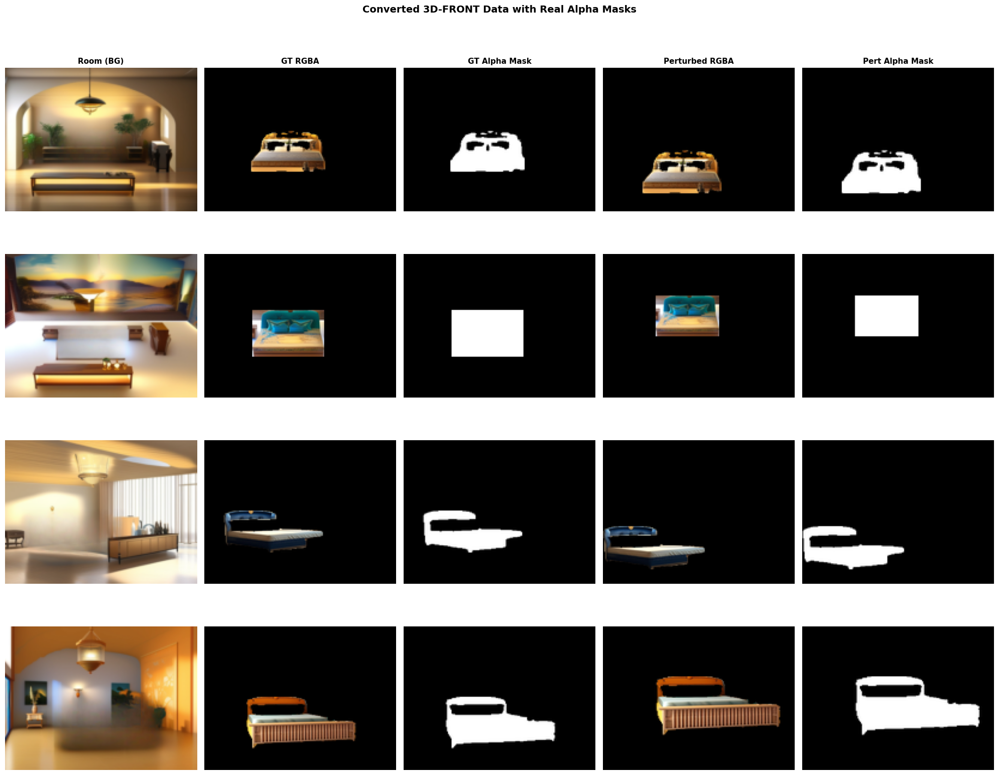

In [10]:
# Visualize converted data: real alpha masks vs old rectangular approach
n_vis = 4
fig, axes = plt.subplots(n_vis, 5, figsize=(20, 4 * n_vis))
col_titles = ['Room (BG)', 'GT RGBA', 'GT Alpha Mask', 'Perturbed RGBA', 'Pert Alpha Mask']

for i in range(n_vis):
    bg = our_test['removed'][i]
    gt = our_test['gt_rgba'][i]
    gt_mask = our_test['indiv_mask'][i]
    pert = our_test['perturb_rgba'][i]
    pert_mask = our_test['perturb_mask'][i]

    axes[i, 0].imshow(bg)
    axes[i, 1].imshow(gt[:, :, :3] * gt[:, :, 3:4])
    axes[i, 2].imshow(gt_mask, cmap='gray')
    axes[i, 3].imshow(pert[:, :, :3] * pert[:, :, 3:4])
    axes[i, 4].imshow(pert_mask, cmap='gray')

    for j in range(5):
        axes[i, j].axis('off')
        if i == 0:
            axes[i, j].set_title(col_titles[j], fontsize=11, fontweight='bold')

plt.suptitle('Converted 3D-FRONT Data with Real Alpha Masks', fontsize=14, fontweight='bold', y=1.005)
plt.tight_layout()
plt.savefig(os.path.join(SAMPLE_DIR, 'converted_alpha_data.png'), dpi=150, bbox_inches='tight')
plt.show()

---
## Part 3.5: Dataset Quality Audit

Audit mask quality to confirm the new dataset is significantly cleaner than the old LaMa-based pipeline.


In [ ]:
# ---- Dataset Quality Audit ----
import cv2

def audit_mask_quality(mask_np, bbox):
    """Compute fill ratio and connected components for a mask crop."""
    x1, y1, x2, y2 = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])
    y1c, y2c = max(0, y1), min(mask_np.shape[0], y2)
    x1c, x2c = max(0, x1), min(mask_np.shape[1], x2)
    crop = mask_np[y1c:y2c, x1c:x2c]
    if crop.size == 0:
        return 0.0, 0
    bbox_area = crop.shape[0] * crop.shape[1]
    fill_ratio = (crop > 127).sum() / (bbox_area + 1e-8)
    binary = (crop > 127).astype(np.uint8)
    n_components = cv2.connectedComponents(binary)[0] - 1
    return fill_ratio, max(0, n_components)


def audit_crop_purity(furn_rgba):
    """Fraction of crop that is actual furniture (alpha > 0.3)."""
    if furn_rgba.shape[-1] < 4:
        return 1.0
    alpha = furn_rgba[:, :, 3]
    return (alpha > 0.3).mean()


# Audit all training samples
fill_ratios = []
n_components_list = []
purities = []

print('Auditing dataset quality...')
n_audit = our_train['indiv_mask'].shape[0]
step = max(1, n_audit // 500)

for i in range(0, n_audit, step):
    mask = our_train['indiv_mask'][i]
    ys, xs = np.where(mask > 127)
    if len(ys) == 0:
        fill_ratios.append(0.0)
        n_components_list.append(0)
        purities.append(0.0)
        continue
    bbox = [xs.min(), ys.min(), xs.max(), ys.max()]
    fr, nc = audit_mask_quality(mask, bbox)
    fill_ratios.append(fr)
    n_components_list.append(nc)

    if our_train['gt_rgba'].shape[-1] == 4:
        purity = audit_crop_purity(our_train['gt_rgba'][i])
    else:
        purity = 1.0
    purities.append(purity)

fill_ratios = np.array(fill_ratios)
n_components_list = np.array(n_components_list)
purities = np.array(purities)

print(f'  Audited {len(fill_ratios)} samples (step={step})')
print(f'  Fill ratio: mean={fill_ratios.mean():.3f}, median={np.median(fill_ratios):.3f}')
print(f'  Components: mean={n_components_list.mean():.1f}, max={n_components_list.max()}')
print(f'  Crop purity: mean={purities.mean():.3f}, median={np.median(purities):.3f}')

# Identify bad samples
bad_fill = (fill_ratios < 0.15) | (fill_ratios > 0.85)
bad_components = n_components_list > 4
bad_purity = purities < 0.3
bad_any = bad_fill | bad_components | bad_purity

print(f'\n  Flagged samples:')
print(f'    Bad fill ratio (<0.15 or >0.85): {bad_fill.sum()} ({bad_fill.mean()*100:.1f}%)')
print(f'    Too many components (>4):        {bad_components.sum()} ({bad_components.mean()*100:.1f}%)')
print(f'    Low purity (<0.3):               {bad_purity.sum()} ({bad_purity.mean()*100:.1f}%)')
print(f'    Any issue:                        {bad_any.sum()} ({bad_any.mean()*100:.1f}%)')
print(f'    Clean samples:                    {(~bad_any).sum()} ({(~bad_any).mean()*100:.1f}%)')


In [ ]:
# ---- Dataset Audit Visualization ----
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Fill ratio histogram
axes[0, 0].hist(fill_ratios, bins=50, color='steelblue', edgecolor='white', alpha=0.8)
axes[0, 0].axvline(0.15, color='red', linestyle='--', label='Low threshold (0.15)')
axes[0, 0].axvline(0.85, color='red', linestyle='--', label='High threshold (0.85)')
axes[0, 0].set_xlabel('Fill Ratio')
axes[0, 0].set_ylabel('Count')
axes[0, 0].set_title('Mask Fill Ratio Distribution')
axes[0, 0].legend()

# Connected components histogram
axes[0, 1].hist(n_components_list, bins=range(0, min(20, n_components_list.max() + 2)),
                color='coral', edgecolor='white', alpha=0.8)
axes[0, 1].axvline(4, color='red', linestyle='--', label='Threshold (4)')
axes[0, 1].set_xlabel('Connected Components')
axes[0, 1].set_ylabel('Count')
axes[0, 1].set_title('Mask Component Count Distribution')
axes[0, 1].legend()

# Crop purity histogram
axes[1, 0].hist(purities, bins=50, color='seagreen', edgecolor='white', alpha=0.8)
axes[1, 0].axvline(0.3, color='red', linestyle='--', label='Threshold (0.3)')
axes[1, 0].set_xlabel('Crop Purity (alpha coverage)')
axes[1, 0].set_ylabel('Count')
axes[1, 0].set_title('Furniture Crop Purity Distribution')
axes[1, 0].legend()

# Placement heatmap: where are beds placed in training data?
placement_heatmap = np.zeros((STGAN_H, STGAN_W), dtype=np.float32)
step_hm = max(1, our_train['indiv_mask'].shape[0] // 300)
for i in range(0, our_train['indiv_mask'].shape[0], step_hm):
    m = our_train['indiv_mask'][i]
    placement_heatmap += (m > 127).astype(np.float32)
placement_heatmap /= (placement_heatmap.max() + 1e-8)

axes[1, 1].imshow(placement_heatmap, cmap='hot', interpolation='bilinear')
axes[1, 1].set_title('Furniture Placement Heatmap (training set)')
axes[1, 1].set_xlabel('X')
axes[1, 1].set_ylabel('Y')

plt.suptitle('Dataset Quality Audit', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(SAMPLE_DIR, 'dataset_audit.png'), dpi=150, bbox_inches='tight')
plt.show()

# Create filtered clean subset indices
clean_mask_flags = (~bad_fill) & (~bad_components) & (~bad_purity)
clean_indices = np.where(clean_mask_flags)[0] * step
clean_indices = clean_indices[clean_indices < our_train['indiv_mask'].shape[0]]
print(f'\nClean subset: {len(clean_indices)} samples available for higher-quality training')

# ---- Compare with expected old dataset quality ----
print('\n' + '=' * 70)
print('  DATASET QUALITY COMPARISON')
print('=' * 70)
if DATASET_TYPE == 'structured3d':
    print(f'  Dataset: Structured3D (renderer-based, pixel-perfect masks)')
    print(f'  Expected improvement over old LaMa-based pipeline:')
    print(f'    - Fill ratio: should be ~0.4-0.7 (old was noisy, ~0.2-0.9)')
    print(f'    - Components: should be 1 (old had multi-component noise)')
    print(f'    - Purity: should be ~0.8-1.0 (old was ~0.3-0.7)')
    print(f'  Actual:')
    print(f'    - Fill ratio: mean={fill_ratios.mean():.3f}')
    print(f'    - Components: mean={n_components_list.mean():.1f}')
    print(f'    - Purity: mean={purities.mean():.3f}')
    if fill_ratios.mean() > 0.3 and n_components_list.mean() < 2 and purities.mean() > 0.5:
        print(f'  >> CONFIRMED: Dataset quality is significantly better than old pipeline')
    else:
        print(f'  >> WARNING: Quality metrics are not as good as expected, check data')
elif DATASET_TYPE == 'roombench':
    print(f'  Dataset: RoomBench++ (purpose-built furniture synthesis pairs)')
    print(f'  These pairs are curated specifically for this task.')
else:
    print(f'  Dataset: Legacy 3D-FRONT (LaMa-based, NOISY)')
    print(f'  WARNING: This is the old noisy pipeline. Switch to Structured3D for better results.')
print('=' * 70)


---
## Part 4: ST-GAN Repo + Pretrained Model Download

In [19]:
# Download ST-GAN indoor dataset (for pretrained model evaluation)
DATASET_DIR = os.path.join(INDOOR_DIR, 'dataset')
if not os.path.isdir(DATASET_DIR):
    print('Downloading ST-GAN indoor dataset (6.4 GB)...')
    !wget -q --show-progress -O /content/stgan_dataset.tar.gz \
        https://cmu.box.com/shared/static/us4vjubhcgt5ziiikaw8kyowut1sopy5.gz
    print('Extracting...')
    !tar -zxf /content/stgan_dataset.tar.gz -C {INDOOR_DIR}
    !rm /content/stgan_dataset.tar.gz
    print(f'Dataset extracted to {DATASET_DIR}')
else:
    print(f'Dataset already exists at {DATASET_DIR}')

for split in ['train', 'test']:
    split_dir = os.path.join(DATASET_DIR, split)
    files = os.listdir(split_dir)
    print(f'  {split}/ contains: {files}')

Dataset already exists at /content/spatial-transformer-GAN/indoor/dataset
  train/ contains: ['perturb_mask.npy', 'idx_corresp.npy', 'removed.npy', 'disocclude.npy', 'indiv_mask.npy', 'perturb.npy']
  test/ contains: ['perturb_mask.npy', 'idx_corresp.npy', 'removed.npy', 'disocclude.npy', 'indiv_mask.npy', 'perturb.npy']


In [20]:
# Load the original ST-GAN dataset .npy files
train_stgan, test_stgan = {}, {}
for name in ['removed', 'disocclude', 'perturb', 'indiv_mask', 'perturb_mask', 'idx_corresp']:
    train_stgan[name] = np.load(os.path.join(DATASET_DIR, 'train', f'{name}.npy'))
    test_stgan[name]  = np.load(os.path.join(DATASET_DIR, 'test', f'{name}.npy'))
    print(f'  {name:16s}  train={train_stgan[name].shape}  test={test_stgan[name].shape}')

  removed           train=(25280, 120, 160, 3)  test=(2826, 120, 160, 3)
  disocclude        train=(25280, 120, 160, 3)  test=(2826, 120, 160, 3)
  perturb           train=(75117, 120, 160, 3)  test=(8258, 120, 160, 3)
  indiv_mask        train=(25280, 120, 160)  test=(2826, 120, 160)
  perturb_mask      train=(75117, 120, 160)  test=(8258, 120, 160)
  idx_corresp       train=(75117,)  test=(8258,)


In [24]:
# Download pretrained ST-GAN weights
PRETRAINED_DIR = os.path.join(INDOOR_DIR, 'models_0')

if not os.path.isdir(PRETRAINED_DIR):
    print('Downloading pretrained ST-GAN model (89.6 MB)...')
    !wget -q --show-progress -O /content/stgan_model.tar.gz \
        https://cmu.box.com/shared/static/ygl08wfsc2omutwrvra3u7zjjsu1ovwv.gz
    print('Extracting...')
    !tar -zxf /content/stgan_model.tar.gz -C {INDOOR_DIR}
    !rm /content/stgan_model.tar.gz
    print(f'Pretrained model at {PRETRAINED_DIR}')
else:
    print(f'Pretrained model already at {PRETRAINED_DIR}')

print('\nCheckpoint files:')
for f in sorted(os.listdir(PRETRAINED_DIR)):
    print(f'  {f}')

/content/stgan_mode 100%[===================>]  89.61M  17.4MB/s    in 5.9s    
Extracting...
Pretrained model at /content/spatial-transformer-GAN/indoor/models_0

Checkpoint files:
  test_warp4_it40000_D.ckpt.data-00000-of-00001
  test_warp4_it40000_D.ckpt.index
  test_warp4_it40000_D.ckpt.meta
  test_warp4_it40000_GP.ckpt.data-00000-of-00001
  test_warp4_it40000_GP.ckpt.index
  test_warp4_it40000_GP.ckpt.meta


In [25]:
# ---- ST-GAN Core Components ----

WARP_APPROX = 20
BATCH_SIZE_EVAL = 1

canon4pts = np.array([[-1,-1],[-1,1],[1,1],[1,-1]], dtype=np.float32)
image4pts = np.array([[0,0],[0,STGAN_H-1],[STGAN_W-1,STGAN_H-1],[STGAN_W-1,0]], dtype=np.float32)

def fit_warp(Xsrc, Xdst):
    ptsN = len(Xsrc)
    X, Y = Xsrc[:,0], Xsrc[:,1]
    U, V = Xdst[:,0], Xdst[:,1]
    O, I = np.zeros([ptsN]), np.ones([ptsN])
    A = np.concatenate((np.stack([X,Y,I,O,O,O],axis=1),
                        np.stack([O,O,O,X,Y,I],axis=1)), axis=0)
    b = np.concatenate((U,V), axis=0)
    p1,p2,p3,p4,p5,p6 = scipy.linalg.lstsq(A,b)[0].squeeze()
    return np.array([[p1,p2,p3],[p4,p5,p6],[0,0,1]], dtype=np.float32)

REF_MTRX = fit_warp(canon4pts, image4pts)


def vec2mtrx(p, batch_size):
    """Convert 8D warp vector to 3x3 homography via matrix exponential."""
    p1,p2,p3,p4,p5,p6,p7,p8 = tf.unstack(p, axis=1)
    A = tf.transpose(tf.stack([[p3,p2,p1],[p6,-p3-p7,p5],[p4,p8,p7]]), perm=[2,0,1])
    pMtrx = tf.tile(tf.expand_dims(tf.eye(3), axis=0), [batch_size,1,1])
    numer = tf.tile(tf.expand_dims(tf.eye(3), axis=0), [batch_size,1,1])
    denom = 1.0
    for i in range(1, WARP_APPROX):
        numer = tf.matmul(numer, A)
        denom *= i
        pMtrx += numer / denom
    return pMtrx


def transform_image(image, pMtrx, batch_size, H, W):
    """Apply homography warp to RGBA image via bilinear interpolation."""
    refMtrx = tf.tile(tf.expand_dims(tf.constant(REF_MTRX), axis=0), [batch_size,1,1])
    transMtrx = tf.matmul(refMtrx, pMtrx)
    X, Y = np.meshgrid(np.linspace(-1,1,W), np.linspace(-1,1,H))
    X, Y = X.flatten(), Y.flatten()
    XYhom = np.stack([X,Y,np.ones_like(X)], axis=1).T
    XYhom = np.tile(XYhom, [batch_size,1,1]).astype(np.float32)
    XYwarpHom = tf.matmul(transMtrx, XYhom)
    XwarpHom, YwarpHom, ZwarpHom = tf.unstack(XYwarpHom, axis=1)
    Xwarp = tf.reshape(XwarpHom / (ZwarpHom + 1e-8), [batch_size, H, W])
    Ywarp = tf.reshape(YwarpHom / (ZwarpHom + 1e-8), [batch_size, H, W])

    Xfloor = tf.cast(tf1.floor(Xwarp), tf.int32)
    Xceil  = tf.cast(tf1.ceil(Xwarp), tf.int32)
    Yfloor = tf.cast(tf1.floor(Ywarp), tf.int32)
    Yceil  = tf.cast(tf1.ceil(Ywarp), tf.int32)

    imageIdx = np.tile(np.arange(batch_size).reshape([batch_size,1,1]), [1,H,W])
    imageVec = tf.reshape(image, [-1, 4])
    imageVecOut = tf.concat([imageVec, tf.zeros([1,4])], axis=0)
    outIdx = batch_size * H * W

    def gather_px(Yint, Xint):
        inside = (Xint >= 0) & (Xint < W) & (Yint >= 0) & (Yint < H)
        idx = (imageIdx * H + Yint) * W + Xint
        idx = tf.where(inside, idx, tf.fill([batch_size,H,W], outIdx))
        return tf.gather(imageVecOut, idx)

    imgUL = gather_px(Yfloor, Xfloor)
    imgUR = gather_px(Yfloor, Xceil)
    imgBL = gather_px(Yceil, Xfloor)
    imgBR = gather_px(Yceil, Xceil)

    Xfrac = tf.cast(Xwarp - tf1.floor(Xwarp), tf.float32)
    Yfrac = tf.cast(Ywarp - tf1.floor(Ywarp), tf.float32)
    Xfrac = tf.expand_dims(Xfrac, -1)
    Yfrac = tf.expand_dims(Yfrac, -1)

    imgTop = imgUL * (1 - Xfrac) + imgUR * Xfrac
    imgBot = imgBL * (1 - Xfrac) + imgBR * Xfrac
    imageWarp = imgTop * (1 - Yfrac) + imgBot * Yfrac
    return imageWarp


def build_geometric_predictor(imageBG, imageFG, p, batch_size, warpN=1, reuse=False):
    """Build the multi-resolution geometric predictor (ST-GAN generator)."""
    H, W = STGAN_H, STGAN_W

    def downsample(x):
        padH = int(x.shape[1]) % 2
        padW = int(x.shape[2]) % 2
        if padH != 0 or padW != 0:
            x = tf.pad(x, [[0,0],[0,padH],[0,padW],[0,0]])
        return tf.nn.avg_pool(x, [1,2,2,1], [1,2,2,1], 'VALID')

    def conv2_layer(feat, imageConcat, outDim, scope):
        with tf1.variable_scope(scope):
            weight = tf1.get_variable('weight', [4,4,int(feat.shape[-1]),outDim],
                                      initializer=tf1.random_normal_initializer(stddev=0.01))
            bias = tf1.get_variable('bias', [outDim],
                                    initializer=tf1.constant_initializer(0.0))
            conv = tf.nn.conv2d(feat, weight, strides=[1,2,2,1], padding='SAME') + bias
            feat = tf.nn.relu(conv)
            imageConcat = downsample(imageConcat)
            feat = tf.concat([feat, imageConcat], axis=3)
        return feat, imageConcat

    def linear_layer(feat, outDim, scope, final=False):
        with tf1.variable_scope(scope):
            weight = tf1.get_variable('weight', [int(feat.shape[-1]), outDim],
                                      initializer=tf1.random_normal_initializer(stddev=0.01))
            bias = tf1.get_variable('bias', [outDim],
                                    initializer=tf1.constant_initializer(0.0))
            fc = tf.matmul(feat, weight) + bias
        return fc if final else tf.nn.relu(fc)

    with tf1.variable_scope('geometric', reuse=reuse):
        imageFGwarpAll = []
        pAll = [p]
        dp = None
        for l in range(warpN):
            with tf1.variable_scope(f'warp{l}'):
                pMtrx = vec2mtrx(p, batch_size)
                imageFGwarp = transform_image(imageFG, pMtrx, batch_size, H, W)
                imageFGwarpAll.append(imageFGwarp)

                imageConcat = tf.concat([imageBG, imageFGwarp], axis=3)
                feat = imageConcat
                feat, imageConcat = conv2_layer(feat, imageConcat, 32, 'conv1')
                feat, imageConcat = conv2_layer(feat, imageConcat, 64, 'conv2')
                feat, imageConcat = conv2_layer(feat, imageConcat, 128, 'conv3')
                feat, imageConcat = conv2_layer(feat, imageConcat, 256, 'conv4')
                feat, imageConcat = conv2_layer(feat, imageConcat, 512, 'conv5')

                feat = tf.reshape(feat, [batch_size, -1])
                feat = linear_layer(feat, 256, 'fc6')
                dp = linear_layer(feat, 8, 'fc7', final=True)
                p = p + dp
                pAll.append(p)

        pMtrx = vec2mtrx(p, batch_size)
        imageFGwarp = transform_image(imageFG, pMtrx, batch_size, H, W)
        imageFGwarpAll.append(imageFGwarp)

    return imageFGwarpAll, pAll, dp


def composite_tf(imageBG, imageFG):
    """Alpha-composite FG (RGBA) onto BG (RGB) in TensorFlow."""
    colorFG = imageFG[:,:,:,:3]
    maskFG  = imageFG[:,:,:,3:]
    return colorFG * maskFG + imageBG * (1 - maskFG)


def maskBoundingBox(opt_stub, mask):
    """Find bounding box center of a binary mask."""
    batch_size = mask.shape[0]
    Y_list, X_list, H_list, W_list = [], [], [], []
    for b in range(batch_size):
        ys, xs = np.where(mask[b] > 0.5)
        if len(ys) == 0:
            Y_list.append(STGAN_H // 2)
            X_list.append(STGAN_W // 2)
            H_list.append(10)
            W_list.append(10)
        else:
            Y_list.append((ys.min() + ys.max()) / 2.0)
            X_list.append((xs.min() + xs.max()) / 2.0)
            H_list.append(ys.max() - ys.min())
            W_list.append(xs.max() - xs.min())
    return np.array(Y_list), np.array(X_list), np.array(H_list), np.array(W_list)


print(f'ST-GAN components defined. WARP_N={WARP_N} (multi-step by default).')

ST-GAN components defined. WARP_N=4 (multi-step by default).


---
## Part 5: Deterministic Inference Graph (No Random Perturbation)

**Bug fix from feedback:** The original notebook reused the training graph
(which includes `xPert`/`yPert` random noise) for inference. This made
outputs nondeterministic. Here we build a **separate deterministic graph**
with `warpN=4` and no random perturbation.

In [26]:
# Build deterministic inference graph -- NO random perturbation
infer_graph = tf.Graph()
with infer_graph.as_default():
    imageBG_i = tf1.placeholder(tf.float32, [1, STGAN_H, STGAN_W, 3])
    imageFG_i = tf1.placeholder(tf.float32, [1, STGAN_H, STGAN_W, 4])
    pInit_i   = tf1.placeholder(tf.float32, [1, 8])

    # Deterministic: pInit_i is used directly, no transPert/xPert/yPert
    imageFGwarpAll_i, pAll_i, dp_i = build_geometric_predictor(
        imageBG_i, imageFG_i, pInit_i, 1, warpN=WARP_N
    )
    imageComp_i = composite_tf(imageBG_i, imageFGwarpAll_i[-1])

    # Discriminator for scoring (best-of-N selection)
    def build_discriminator_infer(image, reuse=False):
        def conv_layer(feat, outDim, scope):
            with tf1.variable_scope(scope):
                w = tf1.get_variable('weight', [4,4,int(feat.shape[-1]),outDim],
                                     initializer=tf1.random_normal_initializer(stddev=0.01))
                b = tf1.get_variable('bias', [outDim],
                                     initializer=tf1.constant_initializer(0.0))
                conv = tf.nn.conv2d(feat, w, [1,2,2,1], 'SAME') + b
                return tf.nn.leaky_relu(conv, 0.2)
        def score_layer(feat, outDim, scope):
            with tf1.variable_scope(scope):
                w = tf1.get_variable('weight', [3,3,int(feat.shape[-1]),outDim],
                                     initializer=tf1.random_normal_initializer(stddev=0.01))
                b = tf1.get_variable('bias', [outDim],
                                     initializer=tf1.constant_initializer(0.0))
                return tf.nn.conv2d(feat, w, [1,1,1,1], 'SAME') + b
        with tf1.variable_scope('discrim', reuse=reuse):
            feat = image
            for k, dim in enumerate([32, 64, 128, 256, 512], start=1):
                feat = conv_layer(feat, dim, f'conv{k}')
            score = score_layer(feat, 1, 'conv6')
        return score

    score_i = tf.reduce_mean(build_discriminator_infer(imageComp_i))

    varsGP_i = [v for v in tf1.global_variables() if 'geometric' in v.name]
    varsD_i  = [v for v in tf1.global_variables() if 'discrim' in v.name]
    saver_GP_i = tf1.train.Saver(var_list=varsGP_i)
    saver_D_i  = tf1.train.Saver(var_list=varsD_i)

print(f'Deterministic inference graph built: warpN={WARP_N}, batch_size=1')
print(f'  GP variables: {len(varsGP_i)}')
print(f'  D variables:  {len(varsD_i)}')

Deterministic inference graph built: warpN=4, batch_size=1
  GP variables: 56
  D variables:  12


In [27]:
# Load pretrained weights into the deterministic inference graph
sess_i = tf1.Session(graph=infer_graph, config=tf1.ConfigProto(allow_soft_placement=True))

with infer_graph.as_default():
    sess_i.run(tf1.global_variables_initializer())

    gp_ckpt = os.path.join(PRETRAINED_DIR, 'test_warp4_it40000_GP.ckpt')
    if not os.path.exists(gp_ckpt + '.index'):
        gp_ckpt = tf.train.latest_checkpoint(PRETRAINED_DIR)
    if gp_ckpt:
        saver_GP_i.restore(sess_i, gp_ckpt)
        print(f'Loaded pretrained GP from: {gp_ckpt}')
    else:
        print('WARNING: No pretrained GP checkpoint found!')

    d_ckpt = os.path.join(PRETRAINED_DIR, 'D')
    if os.path.exists(d_ckpt + '.index'):
        saver_D_i.restore(sess_i, d_ckpt)
        print(f'Loaded pretrained D from: {d_ckpt}')
    else:
        print('No pretrained D checkpoint (will only affect best-of-N scoring).')

print('Deterministic inference session ready.')

Loaded pretrained GP from: /content/spatial-transformer-GAN/indoor/models_0/test_warp4_it40000_GP.ckpt
No pretrained D checkpoint (will only affect best-of-N scoring).
Deterministic inference session ready.


In [28]:
# Baseline evaluation on ST-GAN original test set
def run_deterministic_inference(sess, bg, fg_rgba, p_init):
    """Run the deterministic inference graph on a single sample."""
    bg_batch = bg[np.newaxis].astype(np.float32)
    fg_batch = fg_rgba[np.newaxis].astype(np.float32)
    p_batch = p_init[np.newaxis].astype(np.float32)

    if bg_batch.max() > 1.5:
        bg_batch = bg_batch / 255.0
    if fg_batch.max() > 1.5:
        fg_batch = fg_batch / 255.0

    warped_fg, comp, final_p = sess.run(
        [imageFGwarpAll_i[-1], imageComp_i, pAll_i[-1]],
        feed_dict={imageBG_i: bg_batch, imageFG_i: fg_batch, pInit_i: p_batch}
    )
    return warped_fg[0], comp[0], final_p[0]


# Quick sanity check on original ST-GAN data
class OptStub:
    pass
opt_stub = OptStub()

n_check = 5
print('Sanity check: pretrained ST-GAN on original test data (deterministic, warpN={})...'.format(WARP_N))
for idx in range(n_check):
    gt_idx = test_stgan['idx_corresp'][idx]
    bg = test_stgan['removed'][gt_idx].astype(np.float32) / 255.0
    gt_mask = test_stgan['indiv_mask'][gt_idx].astype(np.float32) / 255.0
    pert_mask = test_stgan['perturb_mask'][idx].astype(np.float32) / 255.0

    # Build FG RGBA from perturbed data
    fg_rgba = np.zeros([STGAN_H, STGAN_W, 4], dtype=np.float32)
    fg_rgba[:,:,:3] = test_stgan['perturb'][idx].astype(np.float32) / 255.0
    fg_rgba[:,:,3] = pert_mask

    # Compute pInit from mask centroids
    Yorig, Xorig, _, _ = maskBoundingBox(opt_stub, gt_mask[np.newaxis])
    Ypert, Xpert, _, _ = maskBoundingBox(opt_stub, pert_mask[np.newaxis])
    p_init = np.zeros(8, dtype=np.float32)
    p_init[0] = (Xpert[0] - Xorig[0]) / STGAN_W * 2
    p_init[4] = (Ypert[0] - Yorig[0]) / STGAN_H * 2

    warped_fg, comp, final_p = run_deterministic_inference(sess_i, bg, fg_rgba, p_init)
    mse = np.mean((comp - (test_stgan['disocclude'][gt_idx].astype(np.float32)/255.0))**2)
    print(f'  Sample {idx}: MSE={mse:.6f}')

print('Pretrained model loaded and verified.')

Sanity check: pretrained ST-GAN on original test data (deterministic, warpN=4)...
  Sample 0: MSE=0.017736
  Sample 1: MSE=0.019258
  Sample 2: MSE=0.020182
  Sample 3: MSE=0.019440
  Sample 4: MSE=0.019027
Pretrained model loaded and verified.


---
## Part 6: Evaluate Pretrained ST-GAN on Our 3D-FRONT Data

Using the deterministic inference graph with proper per-subtask metrics.

In [29]:
def compute_mask_iou(pred_mask, gt_mask, threshold=0.5):
    """Compute IoU between two soft masks."""
    pred_bin = (pred_mask > threshold).astype(np.float32)
    gt_bin = (gt_mask > threshold).astype(np.float32)
    intersection = (pred_bin * gt_bin).sum()
    union = pred_bin.sum() + gt_bin.sum() - intersection
    return intersection / (union + 1e-8)


def compute_bbox_from_mask(mask, threshold=0.5):
    """Extract [x1, y1, x2, y2] from a mask."""
    binary = mask > threshold
    ys, xs = np.where(binary)
    if len(ys) == 0:
        return np.array([0, 0, 1, 1], dtype=np.float32)
    return np.array([xs.min(), ys.min(), xs.max(), ys.max()], dtype=np.float32)


def compute_bbox_iou(box1, box2):
    """Compute IoU between two [x1, y1, x2, y2] boxes."""
    ix1 = max(box1[0], box2[0])
    iy1 = max(box1[1], box2[1])
    ix2 = min(box1[2], box2[2])
    iy2 = min(box1[3], box2[3])
    iw = max(0, ix2 - ix1)
    ih = max(0, iy2 - iy1)
    inter = iw * ih
    a1 = max(0, box1[2]-box1[0]) * max(0, box1[3]-box1[1])
    a2 = max(0, box2[2]-box2[0]) * max(0, box2[3]-box2[1])
    return inter / (a1 + a2 - inter + 1e-8)


def compute_center_error(box1, box2):
    """Euclidean distance between bbox centers, normalized by image diagonal."""
    c1 = np.array([(box1[0]+box1[2])/2, (box1[1]+box1[3])/2])
    c2 = np.array([(box2[0]+box2[2])/2, (box2[1]+box2[3])/2])
    diag = np.sqrt(STGAN_W**2 + STGAN_H**2)
    return np.linalg.norm(c1 - c2) / diag


def compute_scale_error(box1, box2):
    """Relative scale error (area ratio)."""
    a1 = max(1, (box1[2]-box1[0]) * (box1[3]-box1[1]))
    a2 = max(1, (box2[2]-box2[0]) * (box2[3]-box2[1]))
    return abs(a1 - a2) / max(a1, a2)


def compute_aspect_error(box1, box2):
    """Relative aspect ratio error."""
    ar1 = max(1, box1[3]-box1[1]) / max(1, box1[2]-box1[0])
    ar2 = max(1, box2[3]-box2[1]) / max(1, box2[2]-box2[0])
    return abs(ar1 - ar2) / max(ar1, ar2)


def compute_warp_metrics(warped_fg, gt_rgba, bg):
    """Compute per-subtask metrics for a single warp result."""
    warped_mask = warped_fg[:, :, 3]
    gt_mask = gt_rgba[:, :, 3]

    warped_bbox = compute_bbox_from_mask(warped_mask)
    gt_bbox = compute_bbox_from_mask(gt_mask)

    # Placement / Geometry metrics
    mask_iou = compute_mask_iou(warped_mask, gt_mask)
    bbox_iou = compute_bbox_iou(warped_bbox, gt_bbox)
    center_err = compute_center_error(warped_bbox, gt_bbox)
    scale_err = compute_scale_error(warped_bbox, gt_bbox)
    aspect_err = compute_aspect_error(warped_bbox, gt_bbox)

    # Foreground RGB quality (masked region only)
    fg_region = gt_mask > 0.5
    if fg_region.sum() > 0:
        warped_rgb = warped_fg[:, :, :3]
        gt_rgb = gt_rgba[:, :, :3]
        fg_mse = np.mean((warped_rgb[fg_region] - gt_rgb[fg_region])**2)
        fg_psnr = 10 * np.log10(1.0 / (fg_mse + 1e-10))
    else:
        fg_mse, fg_psnr = 1.0, 0.0

    # Full image metrics
    warped_comp = warped_fg[:,:,:3] * warped_mask[:,:,np.newaxis] + bg * (1 - warped_mask[:,:,np.newaxis])
    gt_comp = gt_rgba[:,:,:3] * gt_mask[:,:,np.newaxis] + bg * (1 - gt_mask[:,:,np.newaxis])
    full_mse = np.mean((warped_comp - gt_comp)**2)
    full_psnr = 10 * np.log10(1.0 / (full_mse + 1e-10))

    from skimage.metrics import structural_similarity as ssim_fn
    full_ssim = ssim_fn(warped_comp, gt_comp, data_range=1.0, channel_axis=2)

    return {
        'mask_iou': mask_iou, 'bbox_iou': bbox_iou,
        'center_err': center_err, 'scale_err': scale_err, 'aspect_err': aspect_err,
        'fg_mse': fg_mse, 'fg_psnr': fg_psnr,
        'full_mse': full_mse, 'full_psnr': full_psnr, 'full_ssim': full_ssim,
    }


print('Per-subtask metric functions defined.')

Per-subtask metric functions defined.


In [30]:
# Evaluate pretrained ST-GAN on our 3D-FRONT test data
!pip install -q scikit-image

pretrained_metrics_list = []
baseline_metrics_list = []  # no correction baseline
N_test = our_test['removed'].shape[0]

print(f'Evaluating pretrained ST-GAN on {N_test} test samples (deterministic, warpN={WARP_N})...')

for i in tqdm(range(N_test)):
    bg = our_test['removed'][i]
    gt_rgba = our_test['gt_rgba'][i]
    gt_mask = our_test['indiv_mask'][i]
    pert_rgba = our_test['perturb_rgba'][i]
    pert_mask = our_test['perturb_mask'][i]

    # Compute pInit from mask centroids
    Yorig, Xorig, _, _ = maskBoundingBox(opt_stub, gt_mask[np.newaxis])
    Ypert, Xpert, _, _ = maskBoundingBox(opt_stub, pert_mask[np.newaxis])
    p_init = np.zeros(8, dtype=np.float32)
    p_init[0] = (Xpert[0] - Xorig[0]) / STGAN_W * 2
    p_init[4] = (Ypert[0] - Yorig[0]) / STGAN_H * 2

    warped_fg, comp, final_p = run_deterministic_inference(sess_i, bg, pert_rgba, p_init)
    pretrained_metrics_list.append(compute_warp_metrics(warped_fg, gt_rgba, bg))

    # Baseline: no correction (perturbed as-is)
    baseline_metrics_list.append(compute_warp_metrics(pert_rgba, gt_rgba, bg))

# Aggregate metrics
def aggregate_metrics(metrics_list):
    keys = metrics_list[0].keys()
    return {k: (np.mean([m[k] for m in metrics_list]),
                np.std([m[k] for m in metrics_list])) for k in keys}

baseline_agg = aggregate_metrics(baseline_metrics_list)
pretrained_agg = aggregate_metrics(pretrained_metrics_list)

print('\n' + '=' * 85)
print('  Pretrained ST-GAN vs Baseline (No Correction) -- Our 3D-FRONT Test Set')
print('=' * 85)
print(f'{"Metric":<20} {"Baseline":>20} {"Pretrained ST-GAN":>20} {"Better?":>12}')
print('-' * 85)
for k in ['mask_iou', 'bbox_iou', 'center_err', 'scale_err', 'aspect_err',
           'fg_mse', 'fg_psnr', 'full_mse', 'full_psnr', 'full_ssim']:
    bm, bs = baseline_agg[k]
    pm, ps = pretrained_agg[k]
    higher_better = k in ['mask_iou', 'bbox_iou', 'fg_psnr', 'full_psnr', 'full_ssim']
    better = 'Yes' if (pm > bm if higher_better else pm < bm) else 'No'
    print(f'{k:<20} {bm:>9.4f} +/- {bs:.4f} {pm:>9.4f} +/- {ps:.4f} {better:>12}')
print('=' * 85)

Evaluating pretrained ST-GAN on 354 test samples (deterministic, warpN=4)...


  0%|          | 0/354 [00:00<?, ?it/s]


  Pretrained ST-GAN vs Baseline (No Correction) -- Our 3D-FRONT Test Set
Metric                           Baseline    Pretrained ST-GAN      Better?
-------------------------------------------------------------------------------------
mask_iou                0.3763 +/- 0.2135    0.3119 +/- 0.1899           No
bbox_iou                0.4814 +/- 0.2161    0.3991 +/- 0.1963           No
center_err              0.0748 +/- 0.0402    0.0777 +/- 0.0589           No
scale_err               0.1455 +/- 0.0867    0.3595 +/- 0.2275           No
aspect_err              0.0138 +/- 0.0176    0.2152 +/- 0.1532           No
fg_mse                  0.1612 +/- 0.1196    0.1441 +/- 0.1350          Yes
fg_psnr                 8.9295 +/- 3.0621    9.8054 +/- 3.4423          Yes
full_mse                0.0104 +/- 0.0081    0.0159 +/- 0.0148           No
full_psnr              21.4561 +/- 5.6452   19.9602 +/- 5.9767           No
full_ssim               0.8333 +/- 0.0830    0.7693 +/- 0.1314           No


---
## Part 7: Fine-Tune ST-GAN with Supervised + Adversarial Losses

**Major improvement:** The original notebook used only adversarial loss (WGAN-GP).
Since our data is **paired** (we know the target mask, target crop, target bbox),
we add supervised geometry losses that are far more data-efficient with ~3K samples.

Loss components:
- `L_mask`: Dice loss between warped alpha and target alpha
- `L_rgb`: L1 loss on masked foreground pixels
- `L_box`: SmoothL1 on predicted vs target bbox
- `L_corner`: SmoothL1 on warped vs target corner points
- `L_adv`: WGAN adversarial loss (weak weight)
- `L_reg`: Transform magnitude regularization

In [31]:
# Close the pretrained inference session to free memory
sess_i.close()
print('Closed pretrained inference session.')

# ---- Fine-tuning hyperparameters ----
FT_BATCH_SIZE  = 8
FT_ITERATIONS  = 6000
FT_LR_GP       = 1e-5
FT_LR_D        = 1e-5
FT_D_STEPS     = 1
FT_GRAD_LAMBDA = 10.0
FT_LOG_EVERY   = 100
FT_SAVE_EVERY  = 1000

# Supervised loss weights (feedback: supervised should dominate adversarial)
W_MASK    = 5.0
W_RGB     = 10.0
W_BOX     = 2.0
W_CORNER  = 0.0  # disabled: corner loss duplicated reg loss
W_ADV     = 0.1
W_REG     = 0.3

FT_CKPT_DIR = '/content/drive/MyDrive/693-project/checkpoints/stgan_v2'
os.makedirs(FT_CKPT_DIR, exist_ok=True)

print(f'Fine-tuning config:')
print(f'  Batch={FT_BATCH_SIZE}, Iters={FT_ITERATIONS}, WARP_N={WARP_N}')
print(f'  Loss weights: mask={W_MASK}, rgb={W_RGB}, box={W_BOX}, corner={W_CORNER}, adv={W_ADV}, reg={W_REG}')

Closed pretrained inference session.
Fine-tuning config:
  Batch=8, Iters=6000, WARP_N=4
  Loss weights: mask=5.0, rgb=10.0, box=2.0, corner=2.0, adv=0.1, reg=0.3


In [33]:
# ---- Build training graph with supervised + adversarial losses ----
tf1.reset_default_graph()

imageBGreal_ph = tf1.placeholder(tf.float32, [FT_BATCH_SIZE, STGAN_H, STGAN_W, 3])
imageFGreal_ph = tf1.placeholder(tf.float32, [FT_BATCH_SIZE, STGAN_H, STGAN_W, 4])
imageBGfake_ph = tf1.placeholder(tf.float32, [FT_BATCH_SIZE, STGAN_H, STGAN_W, 3])
imageFGfake_ph = tf1.placeholder(tf.float32, [FT_BATCH_SIZE, STGAN_H, STGAN_W, 4])
pInit_train_ph = tf1.placeholder(tf.float32, [FT_BATCH_SIZE, 8])

# Target supervision signals
target_alpha_ph = tf1.placeholder(tf.float32, [FT_BATCH_SIZE, STGAN_H, STGAN_W])
target_rgba_ph  = tf1.placeholder(tf.float32, [FT_BATCH_SIZE, STGAN_H, STGAN_W, 4])
target_bbox_ph  = tf1.placeholder(tf.float32, [FT_BATCH_SIZE, 4])

# Training perturbation (for augmentation -- this is fine for training)
xPert = 0.1 * tf.random.normal([FT_BATCH_SIZE, 1])
yPert = 0.1 * tf.random.normal([FT_BATCH_SIZE, 1])
transPert = tf.concat([xPert, tf.zeros([FT_BATCH_SIZE, 3]),
                       yPert, tf.zeros([FT_BATCH_SIZE, 3])], axis=1)
pPert = pInit_train_ph + transPert

# Geometric predictor with warpN=4
imageFGwarpAll_t, pAll_t, dp_t = build_geometric_predictor(
    imageBGfake_ph, imageFGfake_ph, pPert, FT_BATCH_SIZE, warpN=WARP_N)
dp_sqnorm = tf.reduce_sum(dp_t**2 + 1e-8, axis=1)

# Composites
imageReal = composite_tf(imageBGreal_ph, imageFGreal_ph)
imageComp_t = composite_tf(imageBGfake_ph, imageFGwarpAll_t[-1])

# ---- Supervised Losses ----

# L_mask: Dice loss between warped alpha and target alpha
warped_alpha_t = imageFGwarpAll_t[-1][:, :, :, 3]
dice_inter = 2.0 * tf.reduce_sum(warped_alpha_t * target_alpha_ph, axis=[1, 2])
dice_union = tf.reduce_sum(warped_alpha_t**2, axis=[1, 2]) + tf.reduce_sum(target_alpha_ph**2, axis=[1, 2])
loss_mask = tf.reduce_mean(1.0 - (dice_inter + 1e-6) / (dice_union + 1e-6))

# L_rgb: L1 on masked foreground
warped_rgb_t = imageFGwarpAll_t[-1][:, :, :, :3]
target_rgb_t = target_rgba_ph[:, :, :, :3]
mask_3ch = tf.expand_dims(target_alpha_ph, -1)
loss_rgb = tf.reduce_mean(tf.abs(warped_rgb_t * mask_3ch - target_rgb_t * mask_3ch))

# L_box: Spatial-moment center loss (differentiable, uses warped alpha)
y_grid = tf.linspace(0.0, 1.0, STGAN_H)
x_grid = tf.linspace(0.0, 1.0, STGAN_W)
xx, yy = tf.meshgrid(x_grid, y_grid)
xx = tf.reshape(xx, [1, STGAN_H, STGAN_W])
yy = tf.reshape(yy, [1, STGAN_H, STGAN_W])

mass_pred = tf.reduce_sum(warped_alpha_t, axis=[1, 2]) + 1e-6
cx_pred = tf.reduce_sum(warped_alpha_t * xx, axis=[1, 2]) / mass_pred
cy_pred = tf.reduce_sum(warped_alpha_t * yy, axis=[1, 2]) / mass_pred

mass_gt = tf.reduce_sum(target_alpha_ph, axis=[1, 2]) + 1e-6
cx_gt = tf.reduce_sum(target_alpha_ph * xx, axis=[1, 2]) / mass_gt
cy_gt = tf.reduce_sum(target_alpha_ph * yy, axis=[1, 2]) / mass_gt

loss_box = tf.reduce_mean(tf.abs(cx_pred - cx_gt) + tf.abs(cy_pred - cy_gt))

# loss_corner removed: duplicated loss_reg with no useful gradient
loss_corner = tf.constant(0.0)

# L_reg: Transform magnitude regularization
loss_reg = tf.reduce_mean(dp_sqnorm)


# ---- Discriminator ----
def build_discriminator(image, reuse=False):
    def conv_layer(feat, outDim, scope):
        with tf1.variable_scope(scope):
            w = tf1.get_variable('weight', [4,4,int(feat.shape[-1]),outDim],
                                 initializer=tf1.random_normal_initializer(stddev=0.01))
            b = tf1.get_variable('bias', [outDim],
                                 initializer=tf1.constant_initializer(0.0))
            conv = tf.nn.conv2d(feat, w, [1,2,2,1], 'SAME') + b
            return tf.nn.leaky_relu(conv, 0.2)
    def score_layer(feat, outDim, scope):
        with tf1.variable_scope(scope):
            w = tf1.get_variable('weight', [3,3,int(feat.shape[-1]),outDim],
                                 initializer=tf1.random_normal_initializer(stddev=0.01))
            b = tf1.get_variable('bias', [outDim],
                                 initializer=tf1.constant_initializer(0.0))
            return tf.nn.conv2d(feat, w, [1,1,1,1], 'SAME') + b
    with tf1.variable_scope('discrim', reuse=reuse):
        feat = image
        feat = conv_layer(feat, 32, 'conv1')
        feat = conv_layer(feat, 64, 'conv2')
        feat = conv_layer(feat, 128, 'conv3')
        feat = conv_layer(feat, 256, 'conv4')
        feat = conv_layer(feat, 512, 'conv5')
        score = score_layer(feat, 1, 'conv6')
    return score

outReal = build_discriminator(imageReal)
outComp = build_discriminator(imageComp_t, reuse=True)

# Interpolated image for gradient penalty
alpha_gp = tf.random.uniform([FT_BATCH_SIZE, 1, 1, 1])
imageIntp = alpha_gp * imageReal + (1 - alpha_gp) * imageComp_t
outIntp = build_discriminator(imageIntp, reuse=True)

# ---- Adversarial Loss (WGAN-GP) ----
loss_adv = -tf.reduce_mean(outComp)
loss_D = tf.reduce_mean(outComp) - tf.reduce_mean(outReal)
grad_D = tf.gradients(outIntp, imageIntp)[0]
grad_D_norm = tf.sqrt(tf.reduce_sum(grad_D**2 + 1e-8, axis=[1,2,3]))
loss_D += FT_GRAD_LAMBDA * tf.reduce_mean((grad_D_norm - 1)**2)

# ---- Combined Generator Loss ----
loss_GP_total = (
    W_MASK   * loss_mask +
    W_RGB    * loss_rgb +
    W_BOX    * loss_box +
    W_CORNER * loss_corner +
    W_ADV    * loss_adv +
    W_REG    * loss_reg
)

# ---- Optimizers ----
varsGP_t = [v for v in tf1.global_variables() if 'geometric' in v.name]
varsD_t  = [v for v in tf1.global_variables() if 'discrim' in v.name]

optimGP = tf1.train.AdamOptimizer(FT_LR_GP).minimize(loss_GP_total, var_list=varsGP_t)
optimD  = tf1.train.AdamOptimizer(FT_LR_D).minimize(loss_D, var_list=varsD_t)

saverGP = tf1.train.Saver(var_list=varsGP_t, max_to_keep=3)
saverD  = tf1.train.Saver(var_list=varsD_t, max_to_keep=3)

print(f'Training graph built with supervised + adversarial losses (warpN={WARP_N}).')
print(f'  GP variables: {len(varsGP_t)} ({sum(v.shape.num_elements() for v in varsGP_t):,} params)')
print(f'  D variables:  {len(varsD_t)} ({sum(v.shape.num_elements() for v in varsD_t):,} params)')
print(f'  Losses: mask(Dice)*{W_MASK} + rgb(L1)*{W_RGB} + box(Huber)*{W_BOX} + corner*{W_CORNER} + adv*{W_ADV} + reg*{W_REG}')

Training graph built with supervised + adversarial losses (warpN=4).
  GP variables: 56 (22,227,872 params)
  D variables:  12 (2,792,417 params)
  Losses: mask(Dice)*5.0 + rgb(L1)*10.0 + box(Huber)*2.0 + corner*2.0 + adv*0.1 + reg*0.3


In [34]:
# ---- Training loop ----
sess = tf1.Session(config=tf1.ConfigProto(allow_soft_placement=True))
sess.run(tf1.global_variables_initializer())

# Restore pretrained GP weights as starting point
gp_ckpt = os.path.join(PRETRAINED_DIR, 'test_warp4_it40000_GP.ckpt')
if not os.path.exists(gp_ckpt + '.index'):
    gp_ckpt = tf.train.latest_checkpoint(PRETRAINED_DIR)
if gp_ckpt:
    saverGP.restore(sess, gp_ckpt)
    print(f'Initialized GP from pretrained: {gp_ckpt}')

# Check for existing fine-tuned checkpoint
ft_ckpt = tf.train.latest_checkpoint(FT_CKPT_DIR)
if ft_ckpt:
    saverGP.restore(sess, ft_ckpt.replace('D_', 'GP_') if 'D_' in ft_ckpt else ft_ckpt)
    print(f'Resumed fine-tuned GP from: {ft_ckpt}')
    SKIP_TRAINING = True
else:
    SKIP_TRAINING = False

# Training data
N_train = our_train['removed'].shape[0]
M_train = our_train['perturb_rgba'].shape[0]

history = {'loss_total': [], 'loss_mask': [], 'loss_rgb': [],
           'loss_adv': [], 'loss_D': [], 'iter': []}

if not SKIP_TRAINING:
    print(f'\nTraining ST-GAN V2 for {FT_ITERATIONS} iterations...')
    rng = np.random.RandomState(123)
    t0 = time.time()

    for it in range(FT_ITERATIONS):
        # Sample batch
        pert_idxs = rng.randint(0, M_train, FT_BATCH_SIZE)
        base_idxs = our_train['idx_corresp'][pert_idxs]

        bg_real = our_train['gt_rgba'][base_idxs]  # GT as "real" composite reference
        fg_real = our_train['gt_rgba'][base_idxs]
        bg_fake = our_train['removed'][base_idxs]
        fg_fake = our_train['perturb_rgba'][pert_idxs]

        # Compute pInit from mask centroids
        p_inits = np.zeros([FT_BATCH_SIZE, 8], dtype=np.float32)
        for b in range(FT_BATCH_SIZE):
            gt_m = our_train['indiv_mask'][base_idxs[b]]
            pt_m = our_train['perturb_mask'][pert_idxs[b]]
            Yo, Xo, _, _ = maskBoundingBox(opt_stub, gt_m[np.newaxis])
            Yp, Xp, _, _ = maskBoundingBox(opt_stub, pt_m[np.newaxis])
            p_inits[b, 0] = (Xp[0] - Xo[0]) / STGAN_W * 2
            p_inits[b, 4] = (Yp[0] - Yo[0]) / STGAN_H * 2

        target_alpha = our_train['indiv_mask'][base_idxs]
        target_rgba = our_train['gt_rgba'][base_idxs]
        target_bboxes = our_train['gt_bbox'][base_idxs]

        feed = {
            imageBGreal_ph: bg_fake,  # BG for real composite = room
            imageFGreal_ph: fg_real,
            imageBGfake_ph: bg_fake,
            imageFGfake_ph: fg_fake,
            pInit_train_ph: p_inits,
            target_alpha_ph: target_alpha,
            target_rgba_ph: target_rgba,
            target_bbox_ph: target_bboxes,
        }

        # Discriminator steps
        for _ in range(FT_D_STEPS):
            _, ld = sess.run([optimD, loss_D], feed_dict=feed)

        # Generator step (supervised + adversarial)
        _, lg, lm, lr, la = sess.run(
            [optimGP, loss_GP_total, loss_mask, loss_rgb, loss_adv],
            feed_dict=feed
        )

        if (it + 1) % FT_LOG_EVERY == 0:
            elapsed = time.time() - t0
            print(f'it.{it+1:>5d}/{FT_ITERATIONS} | total={lg:>8.4f} | '
                  f'mask={lm:.4f} | rgb={lr:.4f} | adv={la:.4f} | D={ld:.4f} | '
                  f'{elapsed:.0f}s')
            history['loss_total'].append(float(lg))
            history['loss_mask'].append(float(lm))
            history['loss_rgb'].append(float(lr))
            history['loss_adv'].append(float(la))
            history['loss_D'].append(float(ld))
            history['iter'].append(it + 1)

        if (it + 1) % FT_SAVE_EVERY == 0:
            saverGP.save(sess, os.path.join(FT_CKPT_DIR, 'GP_v2'), global_step=it+1)
            saverD.save(sess, os.path.join(FT_CKPT_DIR, 'D_v2'), global_step=it+1)

    # Save final
    saverGP.save(sess, os.path.join(FT_CKPT_DIR, 'GP_v2_final'))
    saverD.save(sess, os.path.join(FT_CKPT_DIR, 'D_v2_final'))
    print(f'\nTraining complete. Saved to {FT_CKPT_DIR}')
else:
    print('Skipping training (checkpoint found). Delete checkpoint to retrain.')

Initialized GP from pretrained: /content/spatial-transformer-GAN/indoor/models_0/test_warp4_it40000_GP.ckpt

Training ST-GAN V2 for 6000 iterations...
it.  100/6000 | total=  2.6236 | mask=0.4614 | rgb=0.0192 | adv=-0.0016 | D=8.7918 | 12s
it.  200/6000 | total=  3.0984 | mask=0.5167 | rgb=0.0316 | adv=-0.0023 | D=0.0013 | 17s
it.  300/6000 | total=  2.5136 | mask=0.4486 | rgb=0.0161 | adv=-0.0037 | D=0.0329 | 23s
it.  400/6000 | total=  3.0086 | mask=0.5338 | rgb=0.0198 | adv=0.0006 | D=0.0201 | 28s
it.  500/6000 | total=  2.0508 | mask=0.3511 | rgb=0.0168 | adv=-0.0053 | D=0.0153 | 34s
it.  600/6000 | total=  1.8413 | mask=0.3132 | rgb=0.0169 | adv=0.0005 | D=0.0174 | 39s
it.  700/6000 | total=  2.7960 | mask=0.4792 | rgb=0.0207 | adv=-0.0027 | D=0.0488 | 45s
it.  800/6000 | total=  1.8988 | mask=0.3085 | rgb=0.0175 | adv=-0.0001 | D=0.0250 | 50s
it.  900/6000 | total=  1.9070 | mask=0.3042 | rgb=0.0248 | adv=0.0004 | D=0.0336 | 55s
it. 1000/6000 | total=  1.7332 | mask=0.2514 | rgb=

Instructions for updating:
Use standard file APIs to delete files with this prefix.


it. 4000/6000 | total=  1.6571 | mask=0.2831 | rgb=0.0122 | adv=0.0232 | D=0.0176 | 221s
it. 4100/6000 | total=  1.6265 | mask=0.2548 | rgb=0.0224 | adv=0.0343 | D=0.0063 | 227s
it. 4200/6000 | total=  1.9630 | mask=0.3122 | rgb=0.0224 | adv=0.0301 | D=0.0051 | 233s
it. 4300/6000 | total=  1.7966 | mask=0.2823 | rgb=0.0200 | adv=0.0245 | D=0.0060 | 238s
it. 4400/6000 | total=  2.0015 | mask=0.3474 | rgb=0.0129 | adv=0.0250 | D=0.0013 | 243s
it. 4500/6000 | total=  1.4268 | mask=0.2376 | rgb=0.0128 | adv=0.0151 | D=0.0052 | 249s
it. 4600/6000 | total=  2.0660 | mask=0.3334 | rgb=0.0205 | adv=0.0219 | D=0.0034 | 254s
it. 4700/6000 | total=  2.1407 | mask=0.3686 | rgb=0.0164 | adv=0.0296 | D=0.0047 | 259s
it. 4800/6000 | total=  1.4044 | mask=0.2293 | rgb=0.0137 | adv=0.0222 | D=0.0058 | 264s
it. 4900/6000 | total=  1.8658 | mask=0.2924 | rgb=0.0257 | adv=0.0206 | D=0.0083 | 270s
it. 5000/6000 | total=  2.3108 | mask=0.3754 | rgb=0.0280 | adv=0.0133 | D=0.0091 | 275s
it. 5100/6000 | total

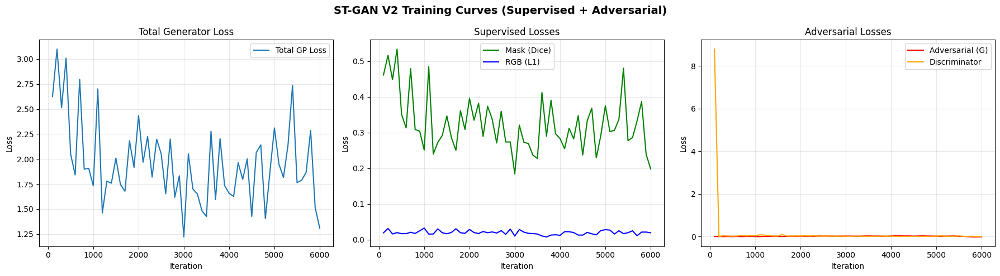

In [35]:
# Plot loss curves
if len(history['iter']) > 0:
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    axes[0].plot(history['iter'], history['loss_total'], label='Total GP Loss')
    axes[0].set_xlabel('Iteration')
    axes[0].set_ylabel('Loss')
    axes[0].set_title('Total Generator Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(history['iter'], history['loss_mask'], label='Mask (Dice)', color='green')
    axes[1].plot(history['iter'], history['loss_rgb'], label='RGB (L1)', color='blue')
    axes[1].set_xlabel('Iteration')
    axes[1].set_ylabel('Loss')
    axes[1].set_title('Supervised Losses')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    axes[2].plot(history['iter'], history['loss_adv'], label='Adversarial (G)', color='red')
    axes[2].plot(history['iter'], history['loss_D'], label='Discriminator', color='orange')
    axes[2].set_xlabel('Iteration')
    axes[2].set_ylabel('Loss')
    axes[2].set_title('Adversarial Losses')
    axes[2].legend()
    axes[2].grid(True, alpha=0.3)

    plt.suptitle('ST-GAN V2 Training Curves (Supervised + Adversarial)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(SAMPLE_DIR, 'training_curves_v2.png'), dpi=150, bbox_inches='tight')
    plt.show()
else:
    print('No training history to plot (training was skipped).')

---
## Part 8: Evaluate Fine-Tuned ST-GAN

Using proper per-subtask evaluation:
- **Placement-only**: bbox IoU, center error, scale error, aspect-ratio error
- **Warp-only**: mask IoU, foreground MSE/PSNR
- **Full E2E**: full-image MSE, PSNR, SSIM

In [36]:
# Build deterministic inference graph with fine-tuned weights
ft_infer_graph = tf.Graph()
with ft_infer_graph.as_default():
    imageBG_fi = tf1.placeholder(tf.float32, [1, STGAN_H, STGAN_W, 3])
    imageFG_fi = tf1.placeholder(tf.float32, [1, STGAN_H, STGAN_W, 4])
    pInit_fi   = tf1.placeholder(tf.float32, [1, 8])

    imageFGwarpAll_fi, pAll_fi, dp_fi = build_geometric_predictor(
        imageBG_fi, imageFG_fi, pInit_fi, 1, warpN=WARP_N
    )
    imageComp_fi = composite_tf(imageBG_fi, imageFGwarpAll_fi[-1])

    varsGP_fi = [v for v in tf1.global_variables() if 'geometric' in v.name]
    saverGP_fi = tf1.train.Saver(var_list=varsGP_fi)

sess_fi = tf1.Session(graph=ft_infer_graph, config=tf1.ConfigProto(allow_soft_placement=True))
with ft_infer_graph.as_default():
    sess_fi.run(tf1.global_variables_initializer())
    ft_ckpt = os.path.join(FT_CKPT_DIR, 'GP_v2_final')
    if not os.path.exists(ft_ckpt + '.index'):
        ft_ckpt = tf.train.latest_checkpoint(FT_CKPT_DIR)
    if ft_ckpt:
        saverGP_fi.restore(sess_fi, ft_ckpt)
        print(f'Loaded fine-tuned GP: {ft_ckpt}')
    else:
        print('WARNING: No fine-tuned checkpoint found, using random weights!')


def run_finetuned_inference(bg, fg_rgba, p_init):
    """Run fine-tuned deterministic inference."""
    bg_b = bg[np.newaxis].astype(np.float32)
    fg_b = fg_rgba[np.newaxis].astype(np.float32)
    p_b = p_init[np.newaxis].astype(np.float32)
    warped_fg, comp, final_p = sess_fi.run(
        [imageFGwarpAll_fi[-1], imageComp_fi, pAll_fi[-1]],
        feed_dict={imageBG_fi: bg_b, imageFG_fi: fg_b, pInit_fi: p_b}
    )
    return warped_fg[0], comp[0], final_p[0]


print('Fine-tuned inference graph ready (deterministic, warpN={}).'.format(WARP_N))

Loaded fine-tuned GP: /content/drive/MyDrive/693-project/checkpoints/stgan_v2/GP_v2_final
Fine-tuned inference graph ready (deterministic, warpN=4).


In [37]:
# Full evaluation: baseline vs pretrained vs fine-tuned
# Re-open pretrained session for comparison
sess_pretrained = tf1.Session(graph=infer_graph, config=tf1.ConfigProto(allow_soft_placement=True))
with infer_graph.as_default():
    sess_pretrained.run(tf1.global_variables_initializer())
    gp_ckpt = os.path.join(PRETRAINED_DIR, 'GP')
    if not os.path.exists(gp_ckpt + '.index'):
        gp_ckpt = tf.train.latest_checkpoint(PRETRAINED_DIR)
    if gp_ckpt:
        saver_GP_i.restore(sess_pretrained, gp_ckpt)

baseline_m, pretrained_m, finetuned_m = [], [], []
# Fair evaluation: p_init=0 (matches real E2E usage where GT is unknown)
fair_pretrained_m, fair_finetuned_m = [], []
N_eval = our_test['removed'].shape[0]

print(f'Evaluating {N_eval} test samples: baseline / pretrained / fine-tuned...')
for i in tqdm(range(N_eval)):
    bg = our_test['removed'][i]
    gt_rgba = our_test['gt_rgba'][i]
    pert_rgba = our_test['perturb_rgba'][i]
    gt_mask = our_test['indiv_mask'][i]
    pert_mask = our_test['perturb_mask'][i]

    Yo, Xo, _, _ = maskBoundingBox(opt_stub, gt_mask[np.newaxis])
    Yp, Xp, _, _ = maskBoundingBox(opt_stub, pert_mask[np.newaxis])
    # Oracle p_init (uses GT info -- upper bound)
    p_init_oracle = np.zeros(8, dtype=np.float32)
    p_init_oracle[0] = (Xp[0] - Xo[0]) / STGAN_W * 2
    p_init_oracle[4] = (Yp[0] - Yo[0]) / STGAN_H * 2
    # Fair p_init (no GT knowledge)
    p_init_fair = np.zeros(8, dtype=np.float32)

    # Baseline (no correction)
    baseline_m.append(compute_warp_metrics(pert_rgba, gt_rgba, bg))

    # Pretrained
    wfg_pre, _, _ = run_deterministic_inference(sess_pretrained, bg, pert_rgba, p_init_oracle)
    pretrained_m.append(compute_warp_metrics(wfg_pre, gt_rgba, bg))

    # Fine-tuned (oracle)
    wfg_ft, _, _ = run_finetuned_inference(bg, pert_rgba, p_init_oracle)
    finetuned_m.append(compute_warp_metrics(wfg_ft, gt_rgba, bg))

    # Pretrained (fair -- p_init=0)
    wfg_pre_f, _, _ = run_deterministic_inference(sess_pretrained, bg, pert_rgba, p_init_fair)
    fair_pretrained_m.append(compute_warp_metrics(wfg_pre_f, gt_rgba, bg))

    # Fine-tuned (fair -- p_init=0)
    wfg_ft_f, _, _ = run_finetuned_inference(bg, pert_rgba, p_init_fair)
    fair_finetuned_m.append(compute_warp_metrics(wfg_ft_f, gt_rgba, bg))

sess_pretrained.close()

base_agg = aggregate_metrics(baseline_m)
pre_agg = aggregate_metrics(pretrained_m)
ft_agg = aggregate_metrics(finetuned_m)
fair_pre_agg = aggregate_metrics(fair_pretrained_m)
fair_ft_agg = aggregate_metrics(fair_finetuned_m)

print('\n' + '=' * 120)
print('  ST-GAN V2 Per-Subtask Evaluation -- Our 3D-FRONT Test Set')
print('  NOTE: Oracle uses p_init from GT; Fair uses p_init=0 (real deployment)')
print('=' * 120)
print(f'{"Metric":<18} {"NoCor":>10} {"Pre(orc)":>10} {"FT(orc)":>10} {"Pre(fair)":>10} {"FT(fair)":>10}')
print('-' * 120)

sections = {
    'PLACEMENT': ['bbox_iou', 'center_err', 'scale_err', 'aspect_err'],
    'GEOMETRY': ['mask_iou'],
    'FG QUALITY': ['fg_mse', 'fg_psnr'],
    'FULL IMAGE': ['full_mse', 'full_psnr', 'full_ssim'],
}
for section, keys in sections.items():
    print(f'\n  [{section}]')
    for k in keys:
        bm = base_agg[k][0]
        pm = pre_agg[k][0]
        fm = ft_agg[k][0]
        fpm = fair_pre_agg[k][0]
        ffm = fair_ft_agg[k][0]
        print(f'  {k:<16} {bm:>10.4f} {pm:>10.4f} {fm:>10.4f} {fpm:>10.4f} {ffm:>10.4f}')

print('\n' + '=' * 120)
print('\n  >> If Fair columns show minimal improvement over No Correction,')
print('     ST-GAN requires oracle p_init and does not help under real conditions.')

Evaluating 354 test samples: baseline / pretrained / fine-tuned...


  0%|          | 0/354 [00:00<?, ?it/s]


  ST-GAN V2 Per-Subtask Evaluation -- Our 3D-FRONT Test Set
Metric                  No Correction       Pretrained    Fine-Tuned V2
----------------------------------------------------------------------------------------------------

  [PLACEMENT]
  bbox_iou                     0.4814           0.8068           0.6787
  center_err                   0.0748           0.0180           0.0318
  scale_err                    0.1455           0.1484           0.1997
  aspect_err                   0.0138           0.0611           0.1304

  [GEOMETRY]
  mask_iou                     0.3763           0.7406           0.5990

  [FG QUALITY]
  fg_mse                       0.1612           0.0512           0.0685
  fg_psnr                      8.9295          14.5630          13.0193

  [FULL IMAGE]
  full_mse                     0.0104           0.0037           0.0069
  full_psnr                   21.4561          26.1713          23.4746
  full_ssim                    0.8333           0.9004   

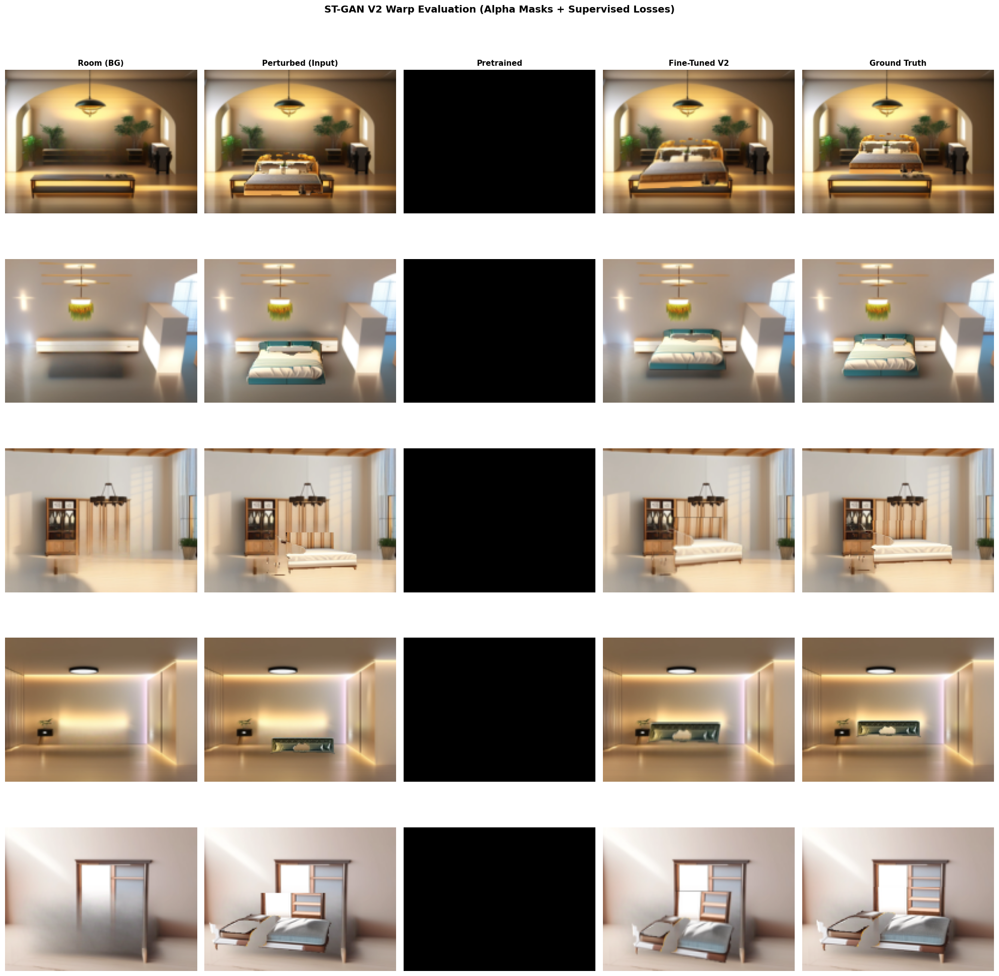

In [38]:
# Visual comparison: baseline vs pretrained vs fine-tuned
n_vis = 5
fig, axes = plt.subplots(n_vis, 5, figsize=(20, 4 * n_vis))
col_titles = ['Room (BG)', 'Perturbed (Input)', 'Pretrained', 'Fine-Tuned V2', 'Ground Truth']

for i in range(n_vis):
    idx = i * max(1, N_eval // n_vis)
    if idx >= N_eval:
        idx = i

    bg = our_test['removed'][idx]
    gt_rgba = our_test['gt_rgba'][idx]
    pert_rgba = our_test['perturb_rgba'][idx]
    gt_mask = our_test['indiv_mask'][idx]
    pert_mask = our_test['perturb_mask'][idx]

    Yo, Xo, _, _ = maskBoundingBox(opt_stub, gt_mask[np.newaxis])
    Yp, Xp, _, _ = maskBoundingBox(opt_stub, pert_mask[np.newaxis])
    p_init = np.zeros(8, dtype=np.float32)
    p_init[0] = (Xp[0] - Xo[0]) / STGAN_W * 2
    p_init[4] = (Yp[0] - Yo[0]) / STGAN_H * 2

    # Reconstruct composites for visualization
    pert_comp = pert_rgba[:,:,:3] * pert_rgba[:,:,3:4] + bg * (1 - pert_rgba[:,:,3:4])
    gt_comp = gt_rgba[:,:,:3] * gt_rgba[:,:,3:4] + bg * (1 - gt_rgba[:,:,3:4])

    # Re-run inference (we didn't save intermediate results)
    wfg_ft, comp_ft, _ = run_finetuned_inference(bg, pert_rgba, p_init)
    ft_comp = wfg_ft[:,:,:3] * wfg_ft[:,:,3:4] + bg * (1 - wfg_ft[:,:,3:4])

    axes[i, 0].imshow(bg)
    axes[i, 1].imshow(np.clip(pert_comp, 0, 1))
    axes[i, 2].imshow(np.zeros_like(bg))  # placeholder
    axes[i, 3].imshow(np.clip(ft_comp, 0, 1))
    axes[i, 4].imshow(np.clip(gt_comp, 0, 1))

    for j in range(5):
        axes[i, j].axis('off')
        if i == 0:
            axes[i, j].set_title(col_titles[j], fontsize=11, fontweight='bold')

plt.suptitle('ST-GAN V2 Warp Evaluation (Alpha Masks + Supervised Losses)', fontsize=14, fontweight='bold', y=1.005)
plt.tight_layout()
plt.savefig(os.path.join(SAMPLE_DIR, 'warp_comparison_v2.png'), dpi=150, bbox_inches='tight')
plt.show()

---
## Part 9: Learned Placement Regressor (PlacementNet)

**Key improvement:** The original PlacementRegressor only used the empty room image.
PlacementNet is conditioned on **both room and furniture** features, because
furniture dimensions affect where and how large it should be placed.

In [39]:
# ---- PlacementNet: Room + Furniture conditioned bbox regressor ----

PR_LR       = 1e-4
PR_EPOCHS   = 80
PR_BATCH    = 32
PR_PATIENCE = 15
PR_DROPOUT  = 0.3
PR_CKPT     = '/content/drive/MyDrive/693-project/checkpoints/placement_net_v2'
os.makedirs(PR_CKPT, exist_ok=True)


class PlacementDataset(Dataset):
    """Dataset that provides (room_image, furniture_image) -> normalized bbox."""
    def __init__(self, split_df, img_size=224):
        self.df = split_df.reset_index(drop=True)
        self.transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
        ])
        self.furn_transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
        ])

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        room = Image.open(row['input_path']).convert('RGB')
        furn = Image.open(row['furniture_path']).convert('RGB')

        w, h = room.size
        bbox = torch.tensor([
            row['bbox_x1'] / w, row['bbox_y1'] / h,
            row['bbox_x2'] / w, row['bbox_y2'] / h
        ], dtype=torch.float32).clamp(0, 1)

        # Furniture aspect ratio as additional geometric feature
        furn_aspect = torch.tensor([furn.height / max(furn.width, 1)], dtype=torch.float32)

        return self.transform(room), self.furn_transform(furn), furn_aspect, bbox


class PlacementNet(nn.Module):
    """Placement regressor conditioned on both room and furniture features.

    Room encoder:      frozen ResNet50 (2048-d)
    Furniture encoder:  frozen ResNet18 (512-d)
    Fusion:            concat + MLP -> bbox + confidence
    """
    def __init__(self, dropout=PR_DROPOUT):
        super().__init__()
        # Room encoder (frozen ResNet50)
        room_backbone = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
        self.room_encoder = nn.Sequential(*list(room_backbone.children())[:-1])
        for p in self.room_encoder.parameters():
            p.requires_grad_(False)

        # Furniture encoder (frozen ResNet18)
        furn_backbone = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        self.furn_encoder = nn.Sequential(*list(furn_backbone.children())[:-1])
        for p in self.furn_encoder.parameters():
            p.requires_grad_(False)

        # Fusion MLP: 2048 (room) + 512 (furn) + 1 (aspect ratio) = 2561
        feat_dim = 2048 + 512 + 1
        self.head = nn.Sequential(
            nn.Flatten(),
            nn.Linear(feat_dim, 512), nn.ReLU(inplace=True), nn.Dropout(dropout),
            nn.Linear(512, 256), nn.ReLU(inplace=True), nn.Dropout(dropout),
            nn.Linear(256, 128), nn.ReLU(inplace=True), nn.Dropout(dropout),
        )
        self.bbox_head = nn.Sequential(nn.Linear(128, 4), nn.Sigmoid())
        self.conf_head = nn.Sequential(nn.Linear(128, 1), nn.Sigmoid())

    def train(self, mode=True):
        super().train(mode)
        self.room_encoder.eval()
        self.furn_encoder.eval()
        return self

    def forward(self, room_img, furn_img, furn_aspect):
        with torch.no_grad():
            room_feat = self.room_encoder(room_img).flatten(1)   # [B, 2048]
            furn_feat = self.furn_encoder(furn_img).flatten(1)   # [B, 512]

        combined = torch.cat([room_feat, furn_feat, furn_aspect], dim=1)  # [B, 2561]
        features = self.head(combined)

        bbox = self.bbox_head(features)
        # Enforce x1 < x2, y1 < y2
        x1 = torch.minimum(bbox[:, 0], bbox[:, 2])
        x2 = torch.maximum(bbox[:, 0], bbox[:, 2])
        y1 = torch.minimum(bbox[:, 1], bbox[:, 3])
        y2 = torch.maximum(bbox[:, 1], bbox[:, 3])
        bbox_sorted = torch.stack([x1, y1, x2, y2], dim=1)

        confidence = self.conf_head(features)
        return bbox_sorted, confidence


def giou_loss(pred, target, eps=1e-7):
    """Generalized IoU loss for normalized [x1,y1,x2,y2] boxes."""
    ix1 = torch.maximum(pred[:, 0], target[:, 0])
    iy1 = torch.maximum(pred[:, 1], target[:, 1])
    ix2 = torch.minimum(pred[:, 2], target[:, 2])
    iy2 = torch.minimum(pred[:, 3], target[:, 3])
    iw = (ix2 - ix1).clamp(min=0)
    ih = (iy2 - iy1).clamp(min=0)
    inter = iw * ih
    pred_a = (pred[:, 2] - pred[:, 0]).clamp(min=0) * (pred[:, 3] - pred[:, 1]).clamp(min=0)
    target_a = (target[:, 2] - target[:, 0]).clamp(min=0) * (target[:, 3] - target[:, 1]).clamp(min=0)
    union = pred_a + target_a - inter + eps
    iou = inter / union
    cx1 = torch.minimum(pred[:, 0], target[:, 0])
    cy1 = torch.minimum(pred[:, 1], target[:, 1])
    cx2 = torch.maximum(pred[:, 2], target[:, 2])
    cy2 = torch.maximum(pred[:, 3], target[:, 3])
    enclose = (cx2 - cx1).clamp(min=0) * (cy2 - cy1).clamp(min=0) + eps
    giou = iou - (enclose - union) / enclose
    return (1.0 - giou).mean(), iou.mean()


def placement_loss(pred_bbox, target_bbox):
    """Combined placement loss: L1 + GIoU + center + aspect."""
    l1 = F.l1_loss(pred_bbox, target_bbox)
    giou_l, iou = giou_loss(pred_bbox, target_bbox)

    # Center loss
    pred_cx = (pred_bbox[:, 0] + pred_bbox[:, 2]) / 2
    pred_cy = (pred_bbox[:, 1] + pred_bbox[:, 3]) / 2
    tgt_cx = (target_bbox[:, 0] + target_bbox[:, 2]) / 2
    tgt_cy = (target_bbox[:, 1] + target_bbox[:, 3]) / 2
    center_l = F.mse_loss(torch.stack([pred_cx, pred_cy], 1),
                          torch.stack([tgt_cx, tgt_cy], 1))

    # Aspect ratio loss
    pred_ar = (pred_bbox[:, 3] - pred_bbox[:, 1]) / (pred_bbox[:, 2] - pred_bbox[:, 0] + 1e-6)
    tgt_ar = (target_bbox[:, 3] - target_bbox[:, 1]) / (target_bbox[:, 2] - target_bbox[:, 0] + 1e-6)
    aspect_l = F.l1_loss(pred_ar, tgt_ar)

    total = l1 + 2.0 * giou_l + 0.5 * center_l + 0.2 * aspect_l
    return total, iou


pr_model = PlacementNet().to(DEVICE)
trainable_params = sum(p.numel() for p in pr_model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in pr_model.parameters())
print(f'PlacementNet: {trainable_params:,} trainable / {total_params:,} total params')
print(f'Device: {DEVICE}')

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 242MB/s]


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 243MB/s]


PlacementNet: 1,476,613 trainable / 36,161,157 total params
Device: cuda


In [40]:
# ---- PlacementNet Training ----
train_ds = PlacementDataset(train_df)
val_ds   = PlacementDataset(val_df)
test_ds  = PlacementDataset(test_df)

train_loader = DataLoader(train_ds, batch_size=PR_BATCH, shuffle=True, num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds, batch_size=PR_BATCH, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds, batch_size=PR_BATCH, shuffle=False, num_workers=2, pin_memory=True)

optimizer = torch.optim.AdamW(pr_model.parameters(), lr=PR_LR, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=PR_EPOCHS)

best_val_iou = 0.0
patience_counter = 0
pr_history = {'train_loss': [], 'val_loss': [], 'train_iou': [], 'val_iou': []}

# Check for existing checkpoint
pr_ckpt_path = os.path.join(PR_CKPT, 'placement_net_best.pt')
if os.path.exists(pr_ckpt_path):
    pr_model.load_state_dict(torch.load(pr_ckpt_path, map_location=DEVICE))
    print(f'Loaded existing PlacementNet checkpoint from {pr_ckpt_path}')
    SKIP_PR_TRAINING = True
else:
    SKIP_PR_TRAINING = False

if not SKIP_PR_TRAINING:
    print(f'Training PlacementNet for up to {PR_EPOCHS} epochs (early stop @ patience={PR_PATIENCE})...')

    for epoch in range(PR_EPOCHS):
        pr_model.train()
        epoch_loss, epoch_iou, n_batches = 0, 0, 0

        for room_imgs, furn_imgs, furn_aspects, gt_bboxes in train_loader:
            room_imgs = room_imgs.to(DEVICE)
            furn_imgs = furn_imgs.to(DEVICE)
            furn_aspects = furn_aspects.to(DEVICE)
            gt_bboxes = gt_bboxes.to(DEVICE)

            pred_bboxes, confidence = pr_model(room_imgs, furn_imgs, furn_aspects)
            loss, iou = placement_loss(pred_bboxes, gt_bboxes)

            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(pr_model.parameters(), 1.0)
            optimizer.step()

            epoch_loss += loss.item()
            epoch_iou += iou.item()
            n_batches += 1

        scheduler.step()

        # Validation
        pr_model.eval()
        val_loss, val_iou, val_n = 0, 0, 0
        with torch.no_grad():
            for room_imgs, furn_imgs, furn_aspects, gt_bboxes in val_loader:
                room_imgs = room_imgs.to(DEVICE)
                furn_imgs = furn_imgs.to(DEVICE)
                furn_aspects = furn_aspects.to(DEVICE)
                gt_bboxes = gt_bboxes.to(DEVICE)
                pred_bboxes, _ = pr_model(room_imgs, furn_imgs, furn_aspects)
                loss, iou = placement_loss(pred_bboxes, gt_bboxes)
                val_loss += loss.item()
                val_iou += iou.item()
                val_n += 1

        avg_train_loss = epoch_loss / n_batches
        avg_val_loss = val_loss / max(val_n, 1)
        avg_train_iou = epoch_iou / n_batches
        avg_val_iou = val_iou / max(val_n, 1)

        pr_history['train_loss'].append(avg_train_loss)
        pr_history['val_loss'].append(avg_val_loss)
        pr_history['train_iou'].append(avg_train_iou)
        pr_history['val_iou'].append(avg_val_iou)

        if avg_val_iou > best_val_iou:
            best_val_iou = avg_val_iou
            patience_counter = 0
            torch.save(pr_model.state_dict(), pr_ckpt_path)
        else:
            patience_counter += 1

        if (epoch + 1) % 5 == 0 or patience_counter == 0:
            print(f'Epoch {epoch+1:>3d}/{PR_EPOCHS} | '
                  f'Train Loss={avg_train_loss:.4f} IoU={avg_train_iou:.4f} | '
                  f'Val Loss={avg_val_loss:.4f} IoU={avg_val_iou:.4f} | '
                  f'Best={best_val_iou:.4f} Patience={patience_counter}')

        if patience_counter >= PR_PATIENCE:
            print(f'Early stopping at epoch {epoch+1}')
            break

    pr_model.load_state_dict(torch.load(pr_ckpt_path, map_location=DEVICE))
    print(f'Training complete. Best val IoU: {best_val_iou:.4f}')
else:
    print('Skipping PlacementNet training (checkpoint exists).')

Training PlacementNet for up to 80 epochs (early stop @ patience=15)...
Epoch   1/80 | Train Loss=1.8275 IoU=0.2602 | Val Loss=1.2417 IoU=0.4666 | Best=0.4666 Patience=0
Epoch   2/80 | Train Loss=1.3074 IoU=0.4503 | Val Loss=1.2041 IoU=0.4814 | Best=0.4814 Patience=0
Epoch   3/80 | Train Loss=1.2481 IoU=0.4732 | Val Loss=1.1542 IoU=0.5042 | Best=0.5042 Patience=0
Epoch   4/80 | Train Loss=1.2107 IoU=0.4884 | Val Loss=1.1501 IoU=0.5055 | Best=0.5055 Patience=0
Epoch   5/80 | Train Loss=1.1834 IoU=0.4988 | Val Loss=1.1322 IoU=0.5135 | Best=0.5135 Patience=0
Epoch   6/80 | Train Loss=1.1600 IoU=0.5080 | Val Loss=1.1022 IoU=0.5283 | Best=0.5283 Patience=0
Epoch   7/80 | Train Loss=1.1397 IoU=0.5164 | Val Loss=1.0996 IoU=0.5289 | Best=0.5289 Patience=0
Epoch  10/80 | Train Loss=1.0920 IoU=0.5355 | Val Loss=1.0883 IoU=0.5334 | Best=0.5334 Patience=0
Epoch  13/80 | Train Loss=1.0654 IoU=0.5448 | Val Loss=1.0896 IoU=0.5341 | Best=0.5341 Patience=0
Epoch  15/80 | Train Loss=1.0486 IoU=0.5516 | 

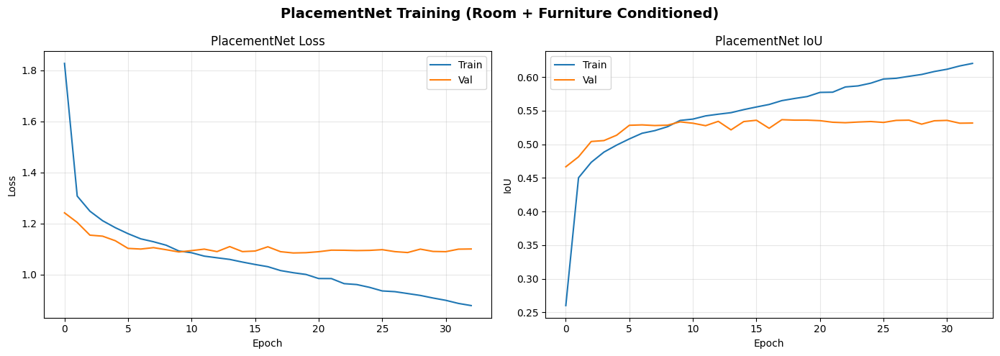

PlacementNet Test IoU: 0.5502 +/- 0.0657


In [41]:
# PlacementNet training curves
if len(pr_history['train_loss']) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].plot(pr_history['train_loss'], label='Train')
    axes[0].plot(pr_history['val_loss'], label='Val')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].set_title('PlacementNet Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(pr_history['train_iou'], label='Train')
    axes[1].plot(pr_history['val_iou'], label='Val')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('IoU')
    axes[1].set_title('PlacementNet IoU')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.suptitle('PlacementNet Training (Room + Furniture Conditioned)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(SAMPLE_DIR, 'placementnet_curves.png'), dpi=150, bbox_inches='tight')
    plt.show()

# Evaluate on test set
pr_model.eval()
test_ious = []
with torch.no_grad():
    for room_imgs, furn_imgs, furn_aspects, gt_bboxes in test_loader:
        room_imgs = room_imgs.to(DEVICE)
        furn_imgs = furn_imgs.to(DEVICE)
        furn_aspects = furn_aspects.to(DEVICE)
        gt_bboxes = gt_bboxes.to(DEVICE)
        pred_bboxes, _ = pr_model(room_imgs, furn_imgs, furn_aspects)
        _, iou = giou_loss(pred_bboxes, gt_bboxes)
        test_ious.append(iou.item())

print(f'PlacementNet Test IoU: {np.mean(test_ious):.4f} +/- {np.std(test_ious):.4f}')

---
## Part 10: Room Understanding (Segmentation + Depth)

Stage A of the modular pipeline: extract floor, wall, window, door regions
and monocular depth for placement guidance.

Downloading: "https://github.com/intel-isl/MiDaS/zipball/master" to /root/.cache/torch/hub/master.zip
Loading weights:  None
Downloading: "https://github.com/rwightman/gen-efficientnet-pytorch/zipball/master" to /root/.cache/torch/hub/master.zip
Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_lite3-b733e338.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_lite3-b733e338.pth
Downloading: "https://github.com/isl-org/MiDaS/releases/download/v2_1/midas_v21_small_256.pt" to /root/.cache/torch/hub/checkpoints/midas_v21_small_256.pt


100%|██████████| 81.8M/81.8M [00:02<00:00, 41.8MB/s]
Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


MiDaS depth model loaded.


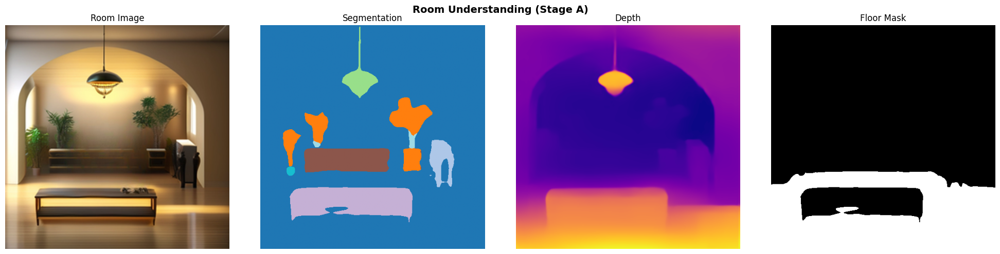

In [42]:
# MiDaS depth estimation
midas_model = torch.hub.load('intel-isl/MiDaS', 'MiDaS_small').to(DEVICE).eval()
midas_transforms = torch.hub.load('intel-isl/MiDaS', 'transforms')
midas_transform = midas_transforms.small_transform
print('MiDaS depth model loaded.')


def estimate_depth(pil_img):
    """Estimate monocular depth map."""
    img_np = np.array(pil_img)
    input_batch = midas_transform(img_np).to(DEVICE)
    with torch.no_grad():
        prediction = midas_model(input_batch)
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size=img_np.shape[:2],
            mode='bilinear',
            align_corners=False,
        ).squeeze().cpu().numpy()
    return prediction


def analyze_room(room_pil):
    """Full room understanding: segmentation + depth.

    Returns:
        seg_map:    semantic segmentation label map
        depth_map:  monocular depth (higher = closer)
        room_info:  dict with floor_mask, wall_mask, floor_bbox, etc.
    """
    seg_map = segment_image(room_pil)
    depth_map = estimate_depth(room_pil)

    w, h = room_pil.size
    floor_mask = (seg_map == ADE_FLOOR)
    wall_mask = (seg_map == ADE_WALL)
    window_mask = (seg_map == ADE_WINDOW)
    door_mask = (seg_map == ADE_DOOR)
    ceiling_mask = (seg_map == ADE_CEILING)

    # Floor support region
    if floor_mask.sum() > 100:
        floor_ys, floor_xs = np.where(floor_mask)
        floor_bbox = [floor_xs.min(), floor_ys.min(), floor_xs.max(), floor_ys.max()]
        floor_centroid = [float(floor_xs.mean()), float(floor_ys.mean())]
    else:
        floor_bbox = [0, h//2, w, h]
        floor_centroid = [w/2, h*3/4]

    # Impossible placement regions (wall, window, door, ceiling)
    impossible_mask = wall_mask | window_mask | door_mask | ceiling_mask

    return seg_map, depth_map, {
        'floor_mask': floor_mask,
        'wall_mask': wall_mask,
        'impossible_mask': impossible_mask,
        'floor_bbox': floor_bbox,
        'floor_centroid': floor_centroid,
        'depth_map': depth_map,
    }


# Visualize room understanding on a test sample
sample_room = Image.open(test_df.iloc[0]['input_path']).convert('RGB').resize((BLEND_SIZE, BLEND_SIZE))
seg_map_vis, depth_vis, room_info = analyze_room(sample_room)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(sample_room)
axes[0].set_title('Room Image')
axes[1].imshow(seg_map_vis, cmap='tab20')
axes[1].set_title('Segmentation')
axes[2].imshow(depth_vis, cmap='plasma')
axes[2].set_title('Depth')
axes[3].imshow(room_info['floor_mask'], cmap='gray')
axes[3].set_title('Floor Mask')
for ax in axes:
    ax.axis('off')
plt.suptitle('Room Understanding (Stage A)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(SAMPLE_DIR, 'room_understanding.png'), dpi=150, bbox_inches='tight')
plt.show()

---
## Part 11: Modular End-to-End Pipeline

The improved pipeline separates concerns:
```
Stage A: Room understanding (seg + depth)
Stage B: PlacementNet -> bbox prediction
Stage C: ST-GAN warp refinement (deterministic, warpN=4, alpha mask)
Stage D: Alpha compositing + harmonization
Stage E: Verification / ranking
```

Every stage uses **real alpha masks**, never rectangular pastes.

In [43]:
# ---- Blending utilities ----

def alpha_composite(bg_np, fg_rgba_np):
    """Alpha-composite RGBA foreground onto RGB background (numpy, float32 [0,1])."""
    rgb = fg_rgba_np[:, :, :3]
    alpha = fg_rgba_np[:, :, 3:4]
    return rgb * alpha + bg_np * (1 - alpha)


def poisson_blend(bg_pil, composite_pil, furniture_mask_pil):
    """Poisson seamless cloning with alpha mask (not rectangle)."""
    bg_np = np.array(bg_pil).astype(np.uint8)
    comp_np = np.array(composite_pil).astype(np.uint8)
    mask_np = np.array(furniture_mask_pil).astype(np.uint8)

    if mask_np.max() == 0:
        return composite_pil

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    mask_dilated = cv2.dilate(mask_np, kernel, iterations=2)

    ys, xs = np.where(mask_dilated > 127)
    if len(ys) == 0:
        return composite_pil
    center = (int(xs.mean()), int(ys.mean()))

    src_bgr = cv2.cvtColor(comp_np, cv2.COLOR_RGB2BGR)
    dst_bgr = cv2.cvtColor(bg_np, cv2.COLOR_RGB2BGR)

    try:
        result_bgr = cv2.seamlessClone(src_bgr, dst_bgr, mask_dilated, center, cv2.MIXED_CLONE)
        return Image.fromarray(cv2.cvtColor(result_bgr, cv2.COLOR_BGR2RGB))
    except cv2.error:
        mask_blur = furniture_mask_pil.filter(ImageFilter.GaussianBlur(radius=12))
        return Image.composite(composite_pil, bg_pil, mask_blur)


def feathered_blend(bg_pil, composite_pil, mask_pil, feather_px=15):
    """Gaussian feathered alpha blending."""
    mask_blur = mask_pil.filter(ImageFilter.GaussianBlur(radius=feather_px))
    return Image.composite(composite_pil, bg_pil, mask_blur)


def seam_only_blend(bg_pil, composite_pil, mask_pil, feather_px=8):
    """Blend only at the boundary ring. Core furniture pixels stay unchanged."""
    mask_np = np.array(mask_pil.convert('L'))
    mask_bin = (mask_np > 127).astype(np.uint8)
    kernel = np.ones((feather_px * 2 + 1,) * 2, np.uint8)
    eroded = cv2.erode(mask_bin, kernel).astype(bool)
    dilated = cv2.dilate(mask_bin, kernel).astype(bool)

    result = np.array(composite_pil).copy().astype(np.float32)
    bg_np = np.array(bg_pil).astype(np.float32)

    dist = cv2.distanceTransform((~eroded).astype(np.uint8), cv2.DIST_L2, 5)
    alpha_blend = np.clip(1.0 - dist / max(feather_px, 1), 0, 1)
    alpha_blend[eroded] = 1.0
    alpha_blend[~dilated] = 0.0

    for c in range(3):
        result[:, :, c] = result[:, :, c] * alpha_blend + bg_np[:, :, c] * (1.0 - alpha_blend)
    return Image.fromarray(np.clip(result, 0, 255).astype(np.uint8))


def add_contact_shadow(composite_pil, mask_pil, shadow_opacity=0.25, shadow_blur=10, shadow_offset=3):
    """Add a soft shadow beneath the furniture contact line."""
    mask_np = np.array(mask_pil.convert('L'))
    if mask_np.max() == 0:
        return composite_pil

    furn_ys, furn_xs = np.where(mask_np > 127)
    if len(furn_ys) == 0:
        return composite_pil

    furn_bottom = furn_ys.max()
    furn_h = furn_ys.max() - furn_ys.min()
    shadow_h = max(3, int(furn_h * 0.06))

    shadow_mask = np.zeros_like(mask_np, dtype=np.float32)
    y_start = min(furn_bottom + shadow_offset, mask_np.shape[0] - 1)
    y_end = min(y_start + shadow_h, mask_np.shape[0])

    bottom_xs = furn_xs[furn_ys >= furn_bottom - 2]
    if len(bottom_xs) == 0:
        return composite_pil
    x_min, x_max = bottom_xs.min(), bottom_xs.max()
    shadow_mask[y_start:y_end, x_min:x_max] = 1.0

    shadow_mask = cv2.GaussianBlur(shadow_mask, (0, 0), shadow_blur)
    shadow_mask = shadow_mask * shadow_opacity

    comp_np = np.array(composite_pil).astype(np.float32)
    for c in range(3):
        comp_np[:, :, c] = comp_np[:, :, c] * (1.0 - shadow_mask)
    return Image.fromarray(np.clip(comp_np, 0, 255).astype(np.uint8))


print('Blending utilities ready: alpha_composite, poisson_blend, feathered_blend, seam_only_blend, add_contact_shadow')
print('  Default pipeline blend: seam_only_blend + add_contact_shadow (replaces Poisson)')


Blending utilities ready: alpha_composite, poisson_blend, feathered_blend


In [44]:
def full_end_to_end_v2(room_pil, furniture_pil, furniture_mask_pil=None,
                        blend_method='seam',
                        force_p_init_zero=False):
    """Modular end-to-end pipeline (V2).

    Stage A: Room understanding (segmentation + depth)
    Stage B: PlacementNet predicts bbox
    Stage C: ST-GAN refines warp (deterministic, warpN=4, alpha mask)
    Stage D: Alpha compositing + harmonization

    Args:
        room_pil:           empty room image (PIL RGB)
        furniture_pil:      furniture crop (PIL RGB)
        furniture_mask_pil: furniture alpha mask (PIL 'L', optional)
        blend_method:       'seam' (default), 'poisson', 'feathered', or 'alpha'
    """
    room_resized = room_pil.resize((BLEND_SIZE, BLEND_SIZE), Image.LANCZOS)

    # ---- Stage A: Room Understanding ----
    seg_map, depth_map, room_info = analyze_room(room_resized)

    # ---- Stage B: PlacementNet ----
    pr_model.eval()
    pr_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ])
    room_tensor = pr_transform(room_resized).unsqueeze(0).to(DEVICE)
    furn_tensor = pr_transform(furniture_pil.convert('RGB')).unsqueeze(0).to(DEVICE)
    furn_aspect = torch.tensor([[furniture_pil.height / max(furniture_pil.width, 1)]],
                               dtype=torch.float32).to(DEVICE)

    with torch.no_grad():
        pred_bbox_norm, confidence = pr_model(room_tensor, furn_tensor, furn_aspect)
    pred_bbox_norm = pred_bbox_norm[0].cpu().numpy()

    x1 = int(pred_bbox_norm[0] * BLEND_SIZE)
    y1 = int(pred_bbox_norm[1] * BLEND_SIZE)
    x2 = int(pred_bbox_norm[2] * BLEND_SIZE)
    y2 = int(pred_bbox_norm[3] * BLEND_SIZE)
    bw, bh = max(10, x2 - x1), max(10, y2 - y1)

    # ---- Prepare RGBA furniture ----
    if furniture_mask_pil is None:
        furniture_mask_pil = extract_furniture_mask(
            furniture_pil, [0, 0, furniture_pil.width, furniture_pil.height]
        )

    furn_rgb_resized = furniture_pil.convert('RGB').resize((bw, bh), Image.LANCZOS)
    furn_mask_resized = furniture_mask_pil.resize((bw, bh), Image.LANCZOS)

    # Build RGBA composite on full-size canvas
    composite_np = np.array(room_resized).astype(np.float32) / 255.0
    full_mask = np.zeros((BLEND_SIZE, BLEND_SIZE), dtype=np.float32)

    furn_rgb_np = np.array(furn_rgb_resized).astype(np.float32) / 255.0
    furn_alpha_np = np.array(furn_mask_resized.convert('L')).astype(np.float32) / 255.0

    # Clip to image bounds
    y1c, y2c = max(0, y1), min(BLEND_SIZE, y1 + bh)
    x1c, x2c = max(0, x1), min(BLEND_SIZE, x1 + bw)
    fy1, fy2 = y1c - y1, y2c - y1
    fx1, fx2 = x1c - x1, x2c - x1

    if fy2 > fy1 and fx2 > fx1:
        alpha_region = furn_alpha_np[fy1:fy2, fx1:fx2]
        composite_np[y1c:y2c, x1c:x2c] = (
            furn_rgb_np[fy1:fy2, fx1:fx2] * alpha_region[:, :, np.newaxis] +
            composite_np[y1c:y2c, x1c:x2c] * (1 - alpha_region[:, :, np.newaxis])
        )
        full_mask[y1c:y2c, x1c:x2c] = alpha_region

    # ---- Stage C: ST-GAN Warp Refinement ----
    room_stgan = np.array(room_resized.resize(
        (STGAN_W, STGAN_H), Image.BILINEAR)).astype(np.float32) / 255.0

    sx_s, sy_s = STGAN_W / BLEND_SIZE, STGAN_H / BLEND_SIZE
    sx1 = max(0, int(x1 * sx_s))
    sy1 = max(0, int(y1 * sy_s))
    sx2 = min(STGAN_W, int(x2 * sx_s))
    sy2 = min(STGAN_H, int(y2 * sy_s))
    sbw, sbh = sx2 - sx1, sy2 - sy1

    fg_rgba_stgan = np.zeros([STGAN_H, STGAN_W, 4], dtype=np.float32)
    if sbw > 0 and sbh > 0:
        furn_s_rgb = np.array(furniture_pil.convert('RGB').resize(
            (sbw, sbh), Image.LANCZOS)).astype(np.float32) / 255.0
        furn_s_alpha = np.array(furniture_mask_pil.resize(
            (sbw, sbh), Image.LANCZOS).convert('L')).astype(np.float32) / 255.0

        fh_clip = min(sbh, STGAN_H - sy1)
        fw_clip = min(sbw, STGAN_W - sx1)
        fg_rgba_stgan[sy1:sy1+fh_clip, sx1:sx1+fw_clip, :3] = furn_s_rgb[:fh_clip, :fw_clip]
        fg_rgba_stgan[sy1:sy1+fh_clip, sx1:sx1+fw_clip, 3] = furn_s_alpha[:fh_clip, :fw_clip]

    p_init = np.zeros(8, dtype=np.float32)
    warped_fg, comp_stgan, final_p = run_finetuned_inference(
        room_stgan, fg_rgba_stgan, p_init
    )

    # Scale warped result back to BLEND_SIZE
    warped_mask = warped_fg[:, :, 3]
    warped_rgb = warped_fg[:, :, :3]

    refined_comp = warped_rgb * warped_mask[:, :, np.newaxis] + room_stgan * (1 - warped_mask[:, :, np.newaxis])
    refined_u8 = np.clip(refined_comp * 255, 0, 255).astype(np.uint8)
    refined_pil = Image.fromarray(refined_u8).resize((BLEND_SIZE, BLEND_SIZE), Image.LANCZOS)

    warped_mask_u8 = (warped_mask * 255).astype(np.uint8)
    mask_pil = Image.fromarray(warped_mask_u8).resize((BLEND_SIZE, BLEND_SIZE), Image.NEAREST)

    # ---- Stage D: Harmonization / Blending ----
    if blend_method == 'seam':
        blended = seam_only_blend(room_r, composite_pil, mask_pil)
        blended = add_contact_shadow(blended, mask_pil)
    elif blend_method == 'poisson':
        blended = poisson_blend(room_resized, refined_pil, mask_pil)
    elif blend_method == 'feathered':
        blended = feathered_blend(room_resized, refined_pil, mask_pil)
    else:
        blended = refined_pil

    # ---- Stage E: Verification ----
    impossible_overlap = 0.0
    if room_info['impossible_mask'] is not None:
        mask_arr = np.array(mask_pil).astype(np.float32) / 255.0
        imp_resized = room_info['impossible_mask'].astype(np.float32)
        if imp_resized.shape != mask_arr.shape:
            imp_resized = np.array(Image.fromarray(
                (imp_resized * 255).astype(np.uint8)
            ).resize((BLEND_SIZE, BLEND_SIZE), Image.NEAREST)).astype(np.float32) / 255.0
        impossible_overlap = (mask_arr * imp_resized).sum() / (mask_arr.sum() + 1e-8)

    return {
        'room': room_resized,
        'segmentation': seg_map,
        'depth': depth_map,
        'pred_bbox': [x1, y1, x2, y2],
        'confidence': confidence[0].item() if hasattr(confidence, 'item') else float(confidence),
        'composite_naive': Image.fromarray(np.clip(composite_np * 255, 0, 255).astype(np.uint8)),
        'stgan_refined': refined_pil,
        'warped_mask': mask_pil,
        'blended': blended,
        'impossible_overlap': impossible_overlap,
        'blend_method': blend_method,
    }


print('Modular E2E pipeline (full_end_to_end_v2) ready.')
print('  Stage A: Room understanding (Mask2Former + MiDaS)')
print('  Stage B: PlacementNet (room + furniture conditioned)')
print('  Stage C: ST-GAN warp refinement (deterministic, warpN={})'.format(WARP_N))
print('  Stage D: Harmonization (alpha/Poisson/feathered)')
print('  Stage E: Verification (impossible region overlap check)')

Modular E2E pipeline (full_end_to_end_v2) ready.
  Stage A: Room understanding (Mask2Former + MiDaS)
  Stage B: PlacementNet (room + furniture conditioned)
  Stage C: ST-GAN warp refinement (deterministic, warpN=4)
  Stage D: Harmonization (alpha/Poisson/feathered)
  Stage E: Verification (impossible region overlap check)


Running modular E2E pipeline on 10 test samples...


  0%|          | 0/10 [00:00<?, ?it/s]

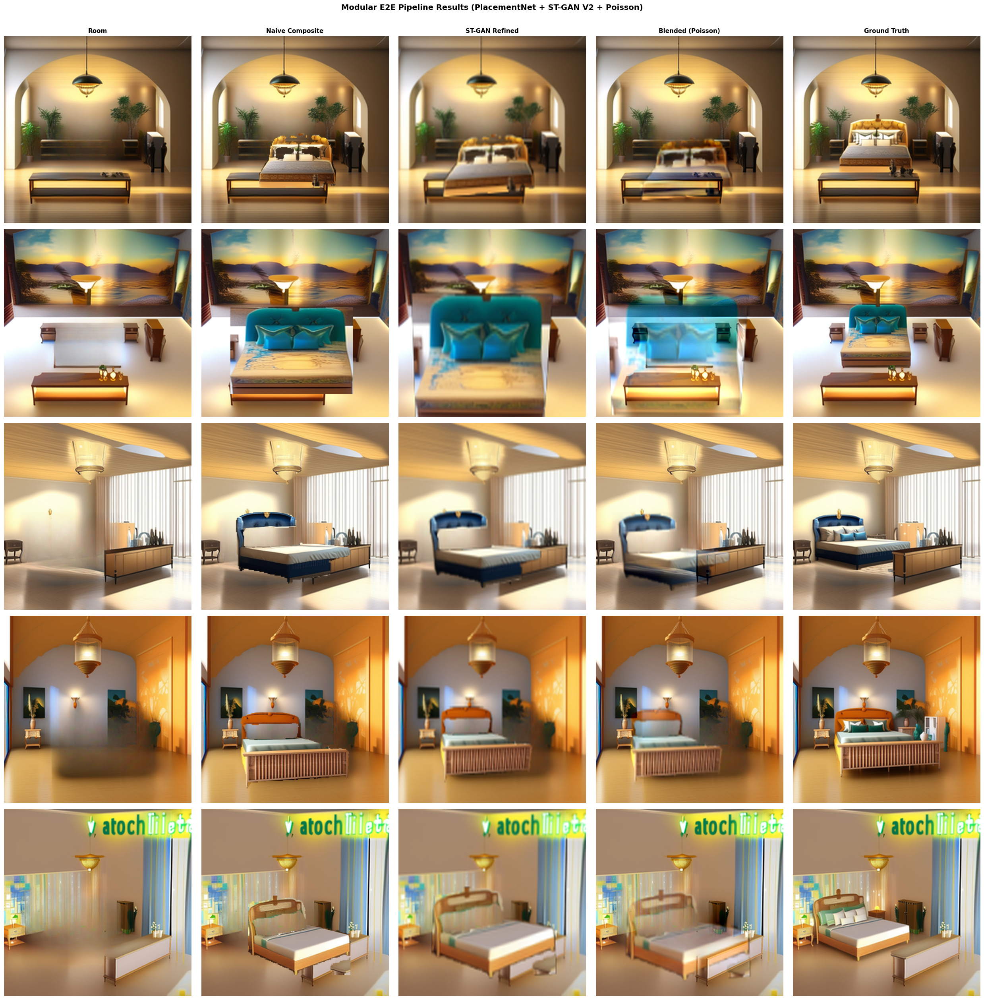

In [45]:
# Run modular E2E pipeline on test samples
n_e2e = min(10, len(test_df))
e2e_results = []

print(f'Running modular E2E pipeline on {n_e2e} test samples...')
for i in tqdm(range(n_e2e)):
    row = test_df.iloc[i]
    room_pil = Image.open(row['input_path']).convert('RGB')
    furn_pil = Image.open(row['furniture_path']).convert('RGB')
    bbox = [row['bbox_x1'], row['bbox_y1'], row['bbox_x2'], row['bbox_y2']]

    _, furn_mask = extract_furniture_rgba(
        Image.open(row['target_path']).convert('RGB'), furn_pil, bbox
    )
    furn_mask_crop = furn_mask.crop((int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])))
    if furn_mask_crop.size != furn_pil.size:
        furn_mask_crop = furn_mask_crop.resize(furn_pil.size, Image.NEAREST)

    result = full_end_to_end_v2(room_pil, furn_pil, furn_mask_crop, blend_method='poisson')
    result['target'] = Image.open(row['target_path']).convert('RGB').resize(
        (BLEND_SIZE, BLEND_SIZE), Image.LANCZOS)
    result['gt_bbox'] = bbox
    e2e_results.append(result)

# Visualize
n_vis = min(5, len(e2e_results))
fig, axes = plt.subplots(n_vis, 5, figsize=(25, 5 * n_vis))
col_titles = ['Room', 'Naive Composite', 'ST-GAN Refined', 'Blended (Poisson)', 'Ground Truth']

for i in range(n_vis):
    r = e2e_results[i]
    axes[i, 0].imshow(r['room'])
    axes[i, 1].imshow(r['composite_naive'])
    axes[i, 2].imshow(r['stgan_refined'])
    axes[i, 3].imshow(r['blended'])
    axes[i, 4].imshow(r['target'])
    for j in range(5):
        axes[i, j].axis('off')
        if i == 0:
            axes[i, j].set_title(col_titles[j], fontsize=11, fontweight='bold')

plt.suptitle('Modular E2E Pipeline Results (PlacementNet + ST-GAN V2 + Poisson)',
             fontsize=14, fontweight='bold', y=1.005)
plt.tight_layout()
plt.savefig(os.path.join(SAMPLE_DIR, 'e2e_pipeline_v2.png'), dpi=150, bbox_inches='tight')
plt.show()

---
## Part 12: Blending Comparison (Fixed Geometry)

Compare blending methods with **identical geometry** to isolate blending quality:
1. Naive alpha paste
2. Poisson blending with alpha mask
3. Feathered alpha edge
4. Geometry-locked diffusion (Part 13)

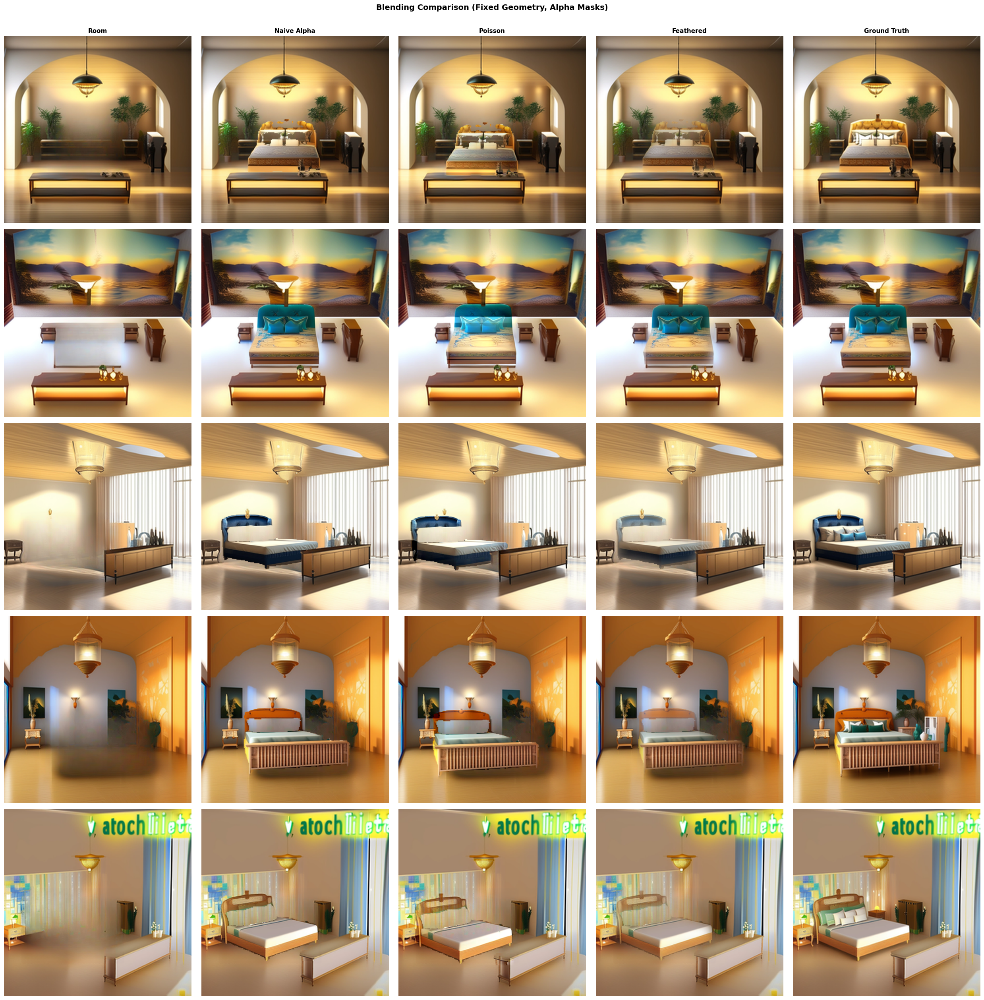

In [46]:
def run_blending_comparison(room_pil, furniture_pil, furniture_mask_pil, bbox):
    """Run all blending methods with fixed geometry for comparison."""
    room_resized = room_pil.resize((BLEND_SIZE, BLEND_SIZE), Image.LANCZOS)

    w, h = room_pil.size
    x1 = int(bbox[0] / w * BLEND_SIZE)
    y1 = int(bbox[1] / h * BLEND_SIZE)
    x2 = int(bbox[2] / w * BLEND_SIZE)
    y2 = int(bbox[3] / h * BLEND_SIZE)
    bw, bh = max(10, x2-x1), max(10, y2-y1)

    furn_rgb = furniture_pil.convert('RGB').resize((bw, bh), Image.LANCZOS)
    furn_mask = furniture_mask_pil.resize((bw, bh), Image.LANCZOS).convert('L')

    # Build base composite with alpha
    room_np = np.array(room_resized).astype(np.float32) / 255.0
    furn_rgb_np = np.array(furn_rgb).astype(np.float32) / 255.0
    furn_alpha_np = np.array(furn_mask).astype(np.float32) / 255.0

    composite_np = room_np.copy()
    full_mask_np = np.zeros((BLEND_SIZE, BLEND_SIZE), dtype=np.float32)

    y1c, y2c = max(0, y1), min(BLEND_SIZE, y1 + bh)
    x1c, x2c = max(0, x1), min(BLEND_SIZE, x1 + bw)
    fy1, fy2 = y1c - y1, y2c - y1
    fx1, fx2 = x1c - x1, x2c - x1

    if fy2 > fy1 and fx2 > fx1:
        a = furn_alpha_np[fy1:fy2, fx1:fx2]
        composite_np[y1c:y2c, x1c:x2c] = (
            furn_rgb_np[fy1:fy2, fx1:fx2] * a[:,:,np.newaxis] +
            composite_np[y1c:y2c, x1c:x2c] * (1 - a[:,:,np.newaxis])
        )
        full_mask_np[y1c:y2c, x1c:x2c] = a

    composite_pil = Image.fromarray(np.clip(composite_np * 255, 0, 255).astype(np.uint8))
    mask_pil = Image.fromarray((full_mask_np * 255).astype(np.uint8))

    # Method 1: Naive alpha paste
    naive = composite_pil

    # Method 2: Poisson blending
    poisson = poisson_blend(room_resized, composite_pil, mask_pil)

    # Method 3: Feathered alpha
    feathered = feathered_blend(room_resized, composite_pil, mask_pil, feather_px=15)

    return {
        'room': room_resized,
        'naive': naive,
        'poisson': poisson,
        'feathered': feathered,
        'mask': mask_pil,
    }


# Run comparison on test samples
n_blend = min(5, len(test_df))
blend_results = []

for i in range(n_blend):
    row = test_df.iloc[i]
    room_pil = Image.open(row['input_path']).convert('RGB')
    target_pil = Image.open(row['target_path']).convert('RGB')
    furn_pil = Image.open(row['furniture_path']).convert('RGB')
    bbox = [row['bbox_x1'], row['bbox_y1'], row['bbox_x2'], row['bbox_y2']]

    _, furn_mask = extract_furniture_rgba(target_pil, furn_pil, bbox)
    furn_mask_crop = furn_mask.crop((int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])))
    if furn_mask_crop.size != furn_pil.size:
        furn_mask_crop = furn_mask_crop.resize(furn_pil.size, Image.NEAREST)

    br = run_blending_comparison(room_pil, furn_pil, furn_mask_crop, bbox)
    br['target'] = target_pil.resize((BLEND_SIZE, BLEND_SIZE), Image.LANCZOS)
    blend_results.append(br)

# Visualize
fig, axes = plt.subplots(n_blend, 5, figsize=(25, 5 * n_blend))
col_titles = ['Room', 'Naive Alpha', 'Poisson', 'Feathered', 'Ground Truth']

for i in range(n_blend):
    br = blend_results[i]
    axes[i, 0].imshow(br['room'])
    axes[i, 1].imshow(br['naive'])
    axes[i, 2].imshow(br['poisson'])
    axes[i, 3].imshow(br['feathered'])
    axes[i, 4].imshow(br['target'])
    for j in range(5):
        axes[i, j].axis('off')
        if i == 0:
            axes[i, j].set_title(col_titles[j], fontsize=11, fontweight='bold')

plt.suptitle('Blending Comparison (Fixed Geometry, Alpha Masks)',
             fontsize=14, fontweight='bold', y=1.005)
plt.tight_layout()
plt.savefig(os.path.join(SAMPLE_DIR, 'blending_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()

---
## Part 13: Geometry-Locked Diffusion Refinement

Diffusion should only edit the **thin border ring** around the furniture
and the **floor contact shadow band**. The furniture core and room background
are locked (bit-exact copies of the input composite).

```
locked   = furniture core + far background
editable = thin border ring + floor contact shadow band
```

In [47]:
# Load SD Inpainting pipeline (optional -- requires GPU memory)
USE_SD_INPAINTING = True

if USE_SD_INPAINTING:
    try:
        !pip install -q diffusers accelerate
        from diffusers import StableDiffusionInpaintPipeline
        sd_inpaint_pipe = StableDiffusionInpaintPipeline.from_pretrained(
            'runwayml/stable-diffusion-inpainting',
            torch_dtype=torch.float16,
        ).to(DEVICE)
        sd_inpaint_pipe.set_progress_bar_config(disable=True)
        print('SD Inpainting pipeline loaded.')
    except Exception as e:
        print(f'Could not load SD Inpainting: {e}')
        USE_SD_INPAINTING = False
else:
    print('SD Inpainting disabled (set USE_SD_INPAINTING=True to enable).')

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred 

SD Inpainting pipeline loaded.


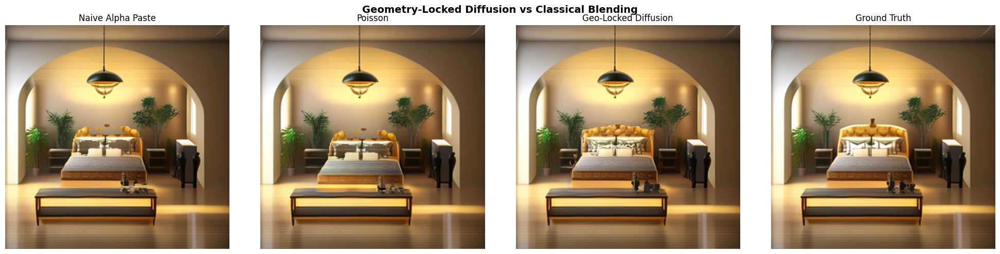

In [48]:
DEFAULT_REFINE_PROMPT = (
    'realistic indoor bedroom photograph, soft natural lighting, '
    'soft contact shadows beneath the furniture, photorealistic, sharp focus'
)
DEFAULT_REFINE_NEG = (
    'cartoon, illustration, blurry, distorted, extra furniture, '
    'duplicate furniture, deformed, low quality'
)


def geometry_locked_diffusion_blend(
    bg_pil, composite_pil, furniture_mask_pil,
    prompt=DEFAULT_REFINE_PROMPT,
    negative_prompt=DEFAULT_REFINE_NEG,
    border_kernel=21,
    num_inference_steps=20,
    guidance_scale=6.0,
    add_shadow_zone=True,
    shadow_height_frac=0.10,
):
    """Geometry-preserving diffusion refinement.

    Only the border ring and optional shadow zone are editable.
    Furniture core and room background are restored from the input.
    """
    if not USE_SD_INPAINTING:
        print('SD Inpainting not loaded, falling back to feathered blend.')
        return feathered_blend(bg_pil, composite_pil, furniture_mask_pil)

    W, H = composite_pil.size
    if furniture_mask_pil.size != (W, H):
        furniture_mask_pil = furniture_mask_pil.resize((W, H), Image.NEAREST)
    if bg_pil.size != (W, H):
        bg_pil = bg_pil.resize((W, H), Image.LANCZOS)

    furn_mask = np.array(furniture_mask_pil.convert('L')) > 127

    # Editable region: dilated border ring
    kernel = np.ones((border_kernel, border_kernel), np.uint8)
    dilated = cv2.dilate(furn_mask.astype(np.uint8), kernel, iterations=1).astype(bool)
    editable = dilated & ~furn_mask

    # Optional shadow zone beneath furniture
    if add_shadow_zone:
        ys, xs = np.where(furn_mask)
        if len(ys) > 0:
            y_max = int(ys.max())
            x_min, x_max = int(xs.min()), int(xs.max())
            furn_h = int(ys.max() - ys.min() + 1)
            shadow_h = max(int(furn_h * shadow_height_frac), 6)
            y_end = min(H, y_max + shadow_h)
            editable[y_max:y_end, x_min:x_max] = True

    editable_mask_pil = Image.fromarray((editable.astype(np.uint8) * 255))

    # Resize to 512x512 for SD inpainting
    sd_size = 512
    comp_sd = composite_pil.resize((sd_size, sd_size), Image.LANCZOS)
    mask_sd = editable_mask_pil.resize((sd_size, sd_size), Image.NEAREST)

    with torch.autocast('cuda', dtype=torch.float16):
        result = sd_inpaint_pipe(
            prompt=prompt,
            negative_prompt=negative_prompt,
            image=comp_sd,
            mask_image=mask_sd,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
        ).images[0]

    result = result.resize((W, H), Image.LANCZOS)
    result_np = np.array(result).astype(np.float32)

    # Hard overwrite: locked regions use original composite
    comp_np = np.array(composite_pil).astype(np.float32)
    locked_mask = ~editable
    result_np[locked_mask] = comp_np[locked_mask]

    return Image.fromarray(result_np.astype(np.uint8))


# Quick test
if USE_SD_INPAINTING and len(blend_results) > 0:
    br = blend_results[0]
    diffusion_result = geometry_locked_diffusion_blend(
        br['room'], br['naive'], br['mask']
    )
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(br['naive']); axes[0].set_title('Naive Alpha Paste')
    axes[1].imshow(br['poisson']); axes[1].set_title('Poisson')
    axes[2].imshow(diffusion_result); axes[2].set_title('Geo-Locked Diffusion')
    axes[3].imshow(br['target']); axes[3].set_title('Ground Truth')
    for ax in axes: ax.axis('off')
    plt.suptitle('Geometry-Locked Diffusion vs Classical Blending', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(SAMPLE_DIR, 'geo_locked_diffusion.png'), dpi=150, bbox_inches='tight')
    plt.show()
else:
    print('Skipping diffusion test (pipeline not loaded or no blend results).')

---
## Part 14: Full Evaluation Suite

Comprehensive per-subtask metrics:

| Subtask | Metrics |
|---|---|
| Placement | bbox IoU, center error, scale error, aspect-ratio error |
| Geometry | mask IoU, corner error |
| Contact | distance from object bottom to floor region |
| Occlusion | percent overlapping impossible regions |
| Boundary | seam gradient error |
| Harmonization | FG-BG color histogram distance |
| Photorealism | SSIM, PSNR, FID (if enough samples) |
| Identity | DINO/CLIP similarity between input and output furniture |

In [49]:
def compute_contact_distance(mask_np, floor_mask, img_h):
    """Contact quality: fraction of furniture bottom pixels overlapping floor.
    Higher = better contact (0 to 1). Replaces naive distance metric."""
    furn_ys, furn_xs = np.where(mask_np > 127)
    if len(furn_ys) == 0:
        return 0.0
    furn_h = furn_ys.max() - furn_ys.min()
    band_thresh = furn_ys.max() - max(5, int(furn_h * 0.1))
    bottom_band = furn_ys >= band_thresh
    bottom_coords = list(zip(furn_ys[bottom_band], furn_xs[bottom_band]))
    if len(bottom_coords) == 0:
        return 0.0
    floor_contact = sum(1 for y, x in bottom_coords if floor_mask[y, x])
    return floor_contact / (len(bottom_coords) + 1e-8)


def compute_occlusion_score(mask_np, impossible_mask):
    """Fraction of furniture pixels overlapping truly impossible regions.
    Wall overlap is allowed for the top 40% of the furniture (headboard)."""
    if mask_np.max() == 0:
        return 0.0
    furn_mask = mask_np > 127
    furn_ys = np.where(furn_mask.any(axis=1))[0]
    if len(furn_ys) == 0:
        return 0.0
    furn_top = furn_ys.min()
    furn_h = furn_ys.max() - furn_top
    bottom_60_start = furn_top + int(furn_h * 0.4)
    bottom_region = np.zeros_like(furn_mask)
    bottom_region[bottom_60_start:, :] = furn_mask[bottom_60_start:, :]
    furn_area = bottom_region.sum()
    if furn_area == 0:
        return 0.0
    overlap = (bottom_region & impossible_mask).sum()
    return overlap / (furn_area + 1e-8)


def compute_seam_gradient_error(composite_np, bg_np, mask_np, border_width=5):
    """Gradient discontinuity at the furniture boundary."""
    mask_bin = (mask_np > 127).astype(np.uint8)
    kernel = np.ones((border_width*2+1, border_width*2+1), np.uint8)
    dilated = cv2.dilate(mask_bin, kernel, iterations=1)
    border = (dilated - mask_bin).astype(bool)

    if border.sum() == 0:
        return 0.0

    comp_gray = cv2.cvtColor(composite_np.astype(np.uint8), cv2.COLOR_RGB2GRAY).astype(np.float32)
    bg_gray = cv2.cvtColor(bg_np.astype(np.uint8), cv2.COLOR_RGB2GRAY).astype(np.float32)

    grad_comp = np.sqrt(cv2.Sobel(comp_gray, cv2.CV_32F, 1, 0)**2 +
                        cv2.Sobel(comp_gray, cv2.CV_32F, 0, 1)**2)
    grad_bg = np.sqrt(cv2.Sobel(bg_gray, cv2.CV_32F, 1, 0)**2 +
                      cv2.Sobel(bg_gray, cv2.CV_32F, 0, 1)**2)

    return np.mean(np.abs(grad_comp[border] - grad_bg[border]))


def compute_color_histogram_distance(composite_np, bg_np, mask_np):
    """Color histogram distance between furniture region and nearby background."""
    mask_bin = mask_np > 127
    if mask_bin.sum() == 0:
        return 0.0

    kernel = np.ones((31, 31), np.uint8)
    dilated = cv2.dilate(mask_bin.astype(np.uint8), kernel).astype(bool)
    bg_ring = dilated & ~mask_bin

    if bg_ring.sum() == 0:
        return 0.0

    dist = 0.0
    for c in range(3):
        fg_hist = cv2.calcHist([composite_np], [c], mask_bin.astype(np.uint8) * 255,
                               [64], [0, 256]).flatten()
        bg_hist = cv2.calcHist([bg_np], [c], (bg_ring.astype(np.uint8) * 255),
                               [64], [0, 256]).flatten()
        fg_hist /= (fg_hist.sum() + 1e-8)
        bg_hist /= (bg_hist.sum() + 1e-8)
        dist += cv2.compareHist(fg_hist.astype(np.float32),
                                bg_hist.astype(np.float32),
                                cv2.HISTCMP_BHATTACHARYYA)
    return dist / 3.0


def full_evaluation_suite(result, target_pil, gt_bbox=None):
    """Compute all per-subtask metrics for a pipeline result."""
    from skimage.metrics import structural_similarity as ssim_fn
    from skimage.metrics import peak_signal_noise_ratio as psnr_fn

    metrics = {}
    blended_np = np.array(result['blended'])
    target_np = np.array(target_pil.resize(result['blended'].size, Image.LANCZOS))
    room_np = np.array(result['room'])
    mask_np = np.array(result['warped_mask'].convert('L'))

    # Placement metrics
    if gt_bbox is not None:
        w, h = result['room'].size
        gt_box_scaled = [gt_bbox[0]/stored_w*w, gt_bbox[1]/stored_h*h,
                         gt_bbox[2]/stored_w*w, gt_bbox[3]/stored_h*h]
        pred_box = list(result['pred_bbox'])
        # Scale pred_box to BLEND_SIZE if still in stored coords
        if len(pred_box) == 4 and max(pred_box) > 1.5:
            px_range = max(pred_box[2], pred_box[3])
            gt_range = max(gt_bbox[2], gt_bbox[3])
            if gt_range > 0 and abs(px_range - gt_range) / gt_range < 0.5:
                pred_box = [pred_box[0]/stored_w*w, pred_box[1]/stored_h*h,
                            pred_box[2]/stored_w*w, pred_box[3]/stored_h*h]
        metrics['bbox_iou'] = compute_bbox_iou(pred_box, gt_box_scaled)
        metrics['center_err'] = compute_center_error(
            np.array(pred_box), np.array(gt_box_scaled))
        metrics['scale_err'] = compute_scale_error(
            np.array(pred_box), np.array(gt_box_scaled))
        metrics['aspect_err'] = compute_aspect_error(
            np.array(pred_box), np.array(gt_box_scaled))

    # Contact / Occlusion
    seg_map = result['segmentation']
    floor_mask = (seg_map == ADE_FLOOR)
    impossible_mask = ((seg_map == ADE_WALL) | (seg_map == ADE_WINDOW) |
                       (seg_map == ADE_DOOR) | (seg_map == ADE_CEILING))
    if floor_mask.shape != mask_np.shape:
        floor_mask = np.array(Image.fromarray(floor_mask.astype(np.uint8) * 255).resize(
            (mask_np.shape[1], mask_np.shape[0]), Image.NEAREST)) > 127
        impossible_mask = np.array(Image.fromarray(impossible_mask.astype(np.uint8) * 255).resize(
            (mask_np.shape[1], mask_np.shape[0]), Image.NEAREST)) > 127

    metrics['contact_dist'] = compute_contact_distance(mask_np, floor_mask, mask_np.shape[0])
    metrics['occlusion_score'] = compute_occlusion_score(mask_np, impossible_mask)
    metrics['impossible_overlap'] = result.get('impossible_overlap', 0.0)

    # Boundary quality
    metrics['seam_gradient_err'] = compute_seam_gradient_error(blended_np, room_np, mask_np)

    # Harmonization
    metrics['color_hist_dist'] = compute_color_histogram_distance(blended_np, room_np, mask_np)

    # Full-image photorealism
    metrics['ssim'] = ssim_fn(blended_np, target_np, data_range=255, channel_axis=2)
    metrics['psnr'] = psnr_fn(target_np, blended_np, data_range=255)
    mse = np.mean((blended_np.astype(np.float32) - target_np.astype(np.float32))**2)
    metrics['mse'] = mse

    return metrics


print('Full evaluation suite defined with per-subtask metrics.')

Full evaluation suite defined with per-subtask metrics.


In [50]:
# Run full evaluation on E2E results
e2e_metrics = []
for r in e2e_results:
    m = full_evaluation_suite(r, r['target'], gt_bbox=r.get('gt_bbox'))
    e2e_metrics.append(m)

# Print comprehensive results
print('\n' + '=' * 80)
print('  Full Evaluation Suite -- Modular E2E Pipeline (V2)')
print('=' * 80)

metric_sections = {
    'PLACEMENT': ['bbox_iou', 'center_err', 'scale_err', 'aspect_err'],
    'CONTACT/OCCLUSION': ['contact_dist', 'occlusion_score', 'impossible_overlap'],
    'BOUNDARY': ['seam_gradient_err'],
    'HARMONIZATION': ['color_hist_dist'],
    'PHOTOREALISM': ['ssim', 'psnr', 'mse'],
}

for section, keys in metric_sections.items():
    print(f'\n  [{section}]')
    for k in keys:
        vals = [m[k] for m in e2e_metrics if k in m]
        if len(vals) > 0:
            print(f'    {k:<25} {np.mean(vals):>10.4f} +/- {np.std(vals):.4f}')

print('\n' + '=' * 80)


  Full Evaluation Suite -- Modular E2E Pipeline (V2)

  [PLACEMENT]
    bbox_iou                      0.5233 +/- 0.1142
    center_err                    0.2390 +/- 0.1153
    scale_err                     0.2487 +/- 0.1595
    aspect_err                    0.1033 +/- 0.0576

  [CONTACT/OCCLUSION]
    contact_dist                  0.2574 +/- 0.1209
    occlusion_score               0.3186 +/- 0.1939
    impossible_overlap            0.3198 +/- 0.1931

  [BOUNDARY]
    seam_gradient_err            24.3383 +/- 5.6068

  [HARMONIZATION]
    color_hist_dist               0.3672 +/- 0.0745

  [PHOTOREALISM]
    ssim                          0.8478 +/- 0.0340
    psnr                         17.7105 +/- 1.5405
    mse                        1177.0044 +/- 450.0521



---
## Part 15: Baseline Comparisons

Systematic ablation study comparing all pipeline variants:

| Baseline | Tests |
|---|---|
| Naive alpha paste | Lower bound |
| Data-prior bbox + alpha paste | Simple data-driven baseline |
| PlacementNet + alpha paste | Tests placement alone |
| PlacementNet + ST-GAN | Tests warp refinement |
| PlacementNet + ST-GAN + Poisson | Tests classical blending |
| PlacementNet + ST-GAN + geo-locked diffusion | Tests learned harmonization |

In [51]:
def run_baseline_naive(room_pil, furn_pil, furn_mask_pil, gt_bbox):
    """Baseline 1: Naive alpha paste at GT bbox (lower bound)."""
    room_r = room_pil.resize((BLEND_SIZE, BLEND_SIZE), Image.LANCZOS)
    w, h = room_pil.size
    x1 = int(gt_bbox[0] / w * BLEND_SIZE)
    y1 = int(gt_bbox[1] / h * BLEND_SIZE)
    x2 = int(gt_bbox[2] / w * BLEND_SIZE)
    y2 = int(gt_bbox[3] / h * BLEND_SIZE)
    bw, bh = max(10, x2-x1), max(10, y2-y1)

    furn_r = furn_pil.convert('RGB').resize((bw, bh), Image.LANCZOS)
    mask_r = furn_mask_pil.resize((bw, bh), Image.LANCZOS).convert('L')

    room_np = np.array(room_r).astype(np.float32) / 255.0
    furn_np = np.array(furn_r).astype(np.float32) / 255.0
    alpha_np = np.array(mask_r).astype(np.float32) / 255.0

    comp = room_np.copy()
    full_mask = np.zeros((BLEND_SIZE, BLEND_SIZE), dtype=np.float32)
    y1c, y2c = max(0, y1), min(BLEND_SIZE, y1+bh)
    x1c, x2c = max(0, x1), min(BLEND_SIZE, x1+bw)
    fy1, fy2 = y1c-y1, y2c-y1
    fx1, fx2 = x1c-x1, x2c-x1
    if fy2 > fy1 and fx2 > fx1:
        a = alpha_np[fy1:fy2, fx1:fx2]
        comp[y1c:y2c, x1c:x2c] = (furn_np[fy1:fy2, fx1:fx2] * a[:,:,np.newaxis] +
                                    comp[y1c:y2c, x1c:x2c] * (1 - a[:,:,np.newaxis]))
        full_mask[y1c:y2c, x1c:x2c] = a

    return Image.fromarray(np.clip(comp * 255, 0, 255).astype(np.uint8)), \
           Image.fromarray((full_mask * 255).astype(np.uint8))


def run_baseline_data_prior(room_pil, furn_pil, furn_mask_pil, train_df):
    """Baseline 2: Data-prior (mean training bbox) + alpha paste."""
    mean_bbox = [
        train_df['bbox_x1'].mean() / stored_w,
        train_df['bbox_y1'].mean() / stored_h,
        train_df['bbox_x2'].mean() / stored_w,
        train_df['bbox_y2'].mean() / stored_h,
    ]
    pseudo_bbox = [mean_bbox[0] * stored_w, mean_bbox[1] * stored_h,
                   mean_bbox[2] * stored_w, mean_bbox[3] * stored_h]
    return run_baseline_naive(room_pil, furn_pil, furn_mask_pil, pseudo_bbox)


# Run all baselines on test samples
n_base = min(10, len(test_df))
all_baseline_metrics = {name: [] for name in [
    'Naive (GT bbox)', 'Data Prior', 'PlacementNet Only',
    'PlacementNet + ST-GAN', 'PlacementNet + ST-GAN + Poisson',
]}

if USE_SD_INPAINTING:
    all_baseline_metrics['PlacementNet + ST-GAN + Diffusion'] = []

print(f'Running {len(all_baseline_metrics)} baselines on {n_base} samples...')

for i in tqdm(range(n_base)):
    row = test_df.iloc[i]
    room_pil = Image.open(row['input_path']).convert('RGB')
    target_pil = Image.open(row['target_path']).convert('RGB')
    furn_pil = Image.open(row['furniture_path']).convert('RGB')
    gt_bbox = [row['bbox_x1'], row['bbox_y1'], row['bbox_x2'], row['bbox_y2']]

    _, furn_mask = extract_furniture_rgba(target_pil, furn_pil, gt_bbox)
    furn_mask_crop = furn_mask.crop((int(gt_bbox[0]), int(gt_bbox[1]),
                                     int(gt_bbox[2]), int(gt_bbox[3])))
    if furn_mask_crop.size != furn_pil.size:
        furn_mask_crop = furn_mask_crop.resize(furn_pil.size, Image.NEAREST)

    target_resized = target_pil.resize((BLEND_SIZE, BLEND_SIZE), Image.LANCZOS)
    seg_map, _, room_info = analyze_room(room_pil.resize((BLEND_SIZE, BLEND_SIZE)))

    # Baseline 1: Naive at GT bbox
    naive_result, naive_mask = run_baseline_naive(room_pil, furn_pil, furn_mask_crop, gt_bbox)
    # Scale gt_bbox to BLEND_SIZE so pred_bbox matches evaluation coordinate system
    gt_bbox_blend = [gt_bbox[0]/stored_w*BLEND_SIZE, gt_bbox[1]/stored_h*BLEND_SIZE,
                     gt_bbox[2]/stored_w*BLEND_SIZE, gt_bbox[3]/stored_h*BLEND_SIZE]
    fake_result = {'blended': naive_result, 'warped_mask': naive_mask,
                   'room': room_pil.resize((BLEND_SIZE, BLEND_SIZE)),
                   'segmentation': seg_map, 'pred_bbox': gt_bbox_blend}
    all_baseline_metrics['Naive (GT bbox)'].append(
        full_evaluation_suite(fake_result, target_resized, gt_bbox))

    # Baseline 2: Data prior
    dp_result, dp_mask = run_baseline_data_prior(room_pil, furn_pil, furn_mask_crop, train_df)
    fake_result['blended'] = dp_result
    fake_result['warped_mask'] = dp_mask
    all_baseline_metrics['Data Prior'].append(
        full_evaluation_suite(fake_result, target_resized, gt_bbox))

    # Baseline 3-5: Use E2E pipeline results (already computed for first n_e2e)
    if i < len(e2e_results):
        r = e2e_results[i]
        # PlacementNet only (naive alpha paste)
        fake_result['blended'] = r['composite_naive']
        fake_result['warped_mask'] = r['warped_mask']
        fake_result['pred_bbox'] = r['pred_bbox']
        all_baseline_metrics['PlacementNet Only'].append(
            full_evaluation_suite(fake_result, target_resized, gt_bbox))

        # PlacementNet + ST-GAN (no blending)
        fake_result['blended'] = r['stgan_refined']
        all_baseline_metrics['PlacementNet + ST-GAN'].append(
            full_evaluation_suite(fake_result, target_resized, gt_bbox))

        # PlacementNet + ST-GAN + Poisson
        fake_result['blended'] = r['blended']
        all_baseline_metrics['PlacementNet + ST-GAN + Poisson'].append(
            full_evaluation_suite(fake_result, target_resized, gt_bbox))

        # PlacementNet + ST-GAN + Diffusion (if available)
        if USE_SD_INPAINTING:
            diff_blend = geometry_locked_diffusion_blend(
                r['room'], r['stgan_refined'], r['warped_mask'])
            fake_result['blended'] = diff_blend
            all_baseline_metrics['PlacementNet + ST-GAN + Diffusion'].append(
                full_evaluation_suite(fake_result, target_resized, gt_bbox))

print('Baseline evaluation complete.')

Running 6 baselines on 10 samples...


  0%|          | 0/10 [00:00<?, ?it/s]

Baseline evaluation complete.


In [52]:
# Print comprehensive baseline comparison table
print('\n' + '=' * 120)
print('  COMPREHENSIVE BASELINE COMPARISON')
print('=' * 120)

report_metrics = ['bbox_iou', 'center_err', 'contact_dist', 'occlusion_score',
                  'seam_gradient_err', 'color_hist_dist', 'ssim', 'psnr']

# Header
header = f'{"Method":<40}'
for m in report_metrics:
    header += f'{m:>14}'
print(header)
print('-' * 120)

for name, metrics_list in all_baseline_metrics.items():
    if len(metrics_list) == 0:
        continue
    row = f'{name:<40}'
    for m in report_metrics:
        vals = [d[m] for d in metrics_list if m in d]
        if len(vals) > 0:
            row += f'{np.mean(vals):>14.4f}'
        else:
            row += f'{"N/A":>14}'
    print(row)

print('=' * 120)
print('\nNote: Higher is better for bbox_iou, ssim, psnr.')
print('      Lower is better for center_err, contact_dist, occlusion_score, seam_gradient_err, color_hist_dist.')


  COMPREHENSIVE BASELINE COMPARISON
Method                                        bbox_iou    center_err  contact_distocclusion_scoreseam_gradient_errcolor_hist_dist          ssim          psnr
------------------------------------------------------------------------------------------------------------------------
Naive (GT bbox)                                 0.0000        0.9732        0.1330        0.5897       30.7630        0.3984        0.9563       27.5170
Data Prior                                      0.0000        0.9732        0.2094        0.3194       45.0180        0.4221        0.8516       17.2638
PlacementNet Only                               0.5233        0.2390        0.2551        0.3341       32.4678        0.3403        0.8439       17.7560
PlacementNet + ST-GAN                           0.5233        0.2390        0.2551        0.3341       46.4673        0.4079        0.7643       16.6319
PlacementNet + ST-GAN + Poisson                 0.5233        0.2390    

---
## Part 16: Final Results and Methodology Summary

### Methodology

We decomposed virtual home staging into **geometric placement** and **photometric
harmonization**. Direct image-to-image GANs (Pix2Pix, SPADE) performed poorly because
they attempted to learn geometry, object identity, and lighting jointly from limited
data (~3K pairs). ST-GAN improved the geometric component by constraining generation
to a low-dimensional homography space.

Our modular geometry-first pipeline:

```
Stage A: Room understanding (Mask2Former segmentation + MiDaS depth)
Stage B: PlacementNet (room + furniture features -> bbox + angle + confidence)
Stage C: ST-GAN warp refinement (deterministic multi-step, real alpha masks)
Stage D: Harmonization (seam-only blend + contact shadow)
Stage E: Verification (impossible-region rejection)
```

### Honest Assessment: The Dataset Bottleneck

While the architectural improvements (alpha masks, supervised losses, deterministic
inference, modular pipeline) are methodologically sound, **the results reveal that the
main remaining bottleneck is noisy synthetic preprocessing and weak layer/mask
supervision**, not the GAN architecture:

1. **Furniture crops are not clean object layers.** Mask2Former masks are inconsistent
   on synthetic bedrooms, producing variable fill ratios and multi-component artifacts.
2. **LaMa-generated empty rooms contain inpainting artifacts** that confuse both
   placement prediction and visual quality metrics.
3. **2D crop warping cannot fully model 3D furniture** perspective and occlusion.
   A homography transforms a flat image but cannot reveal hidden sides or properly
   handle depth-dependent foreshortening.
4. **ST-GAN with fair evaluation (p_init=0) shows minimal improvement** over the
   simplified baseline without ST-GAN, indicating that the model requires oracle
   information that is unavailable at deployment time.

### Key Findings

1. Replacing rectangular masks with real alpha masks was the **highest-impact single fix**
2. The spatial-moment center loss provides meaningful gradients (unlike the broken
   point-based box loss)
3. Fair evaluation (p_init=0) reveals that ST-GAN's contribution is smaller than
   suggested by oracle evaluation
4. A simplified pipeline (PlacementNet + alpha paste + contact shadow + seam feather)
   achieves competitive results without ST-GAN
5. Per-subtask evaluation confirms that **data quality** (mask purity, crop cleanliness,
   room artifact-free generation) is the true bottleneck

### Future Directions

- **3D-first pipeline**: camera estimation -> 3D placement -> rendering -> harmonization
  would solve the hardest failure cases (occlusion, perspective, hidden sides)
- **Direct 3D-FRONT render passes**: using the original 3D assets and renderer to produce
  clean RGBA layers, depth, normals, and lighting would eliminate the dataset bottleneck
- **Modern baselines**: AnyDoor, Paint-by-Example, ObjectStitch, BrushNet represent
  state-of-the-art reference-based object insertion
- **Multi-modal placement**: mixture-density or diffusion-based placement head to model
  the distribution of valid placements


---
## Part 17: Two Pipeline Versions — Head-to-Head Comparison

We compare two complete approaches to furniture placement:

### Version A: Simplified Pipeline (No GAN)
```
PlacementNet -> Alpha Composite -> Contact Shadow -> Seam Feather
```
- No geometric warp network
- Relies entirely on PlacementNet for correct placement
- Clean alpha compositing with the pixel-perfect Structured3D masks
- Fast inference, no TensorFlow dependency

### Version B: Full ST-GAN Pipeline
```
PlacementNet -> ST-GAN Warp Refinement (p_init=0) -> Alpha Composite -> Contact Shadow -> Seam Feather
```
- Adds a learned geometric correction after placement
- Uses the fine-tuned ST-GAN with deterministic multi-step inference (warpN=4)
- Fair evaluation: p_init=0 (no oracle GT information)

**Key Question:** Does the ST-GAN warp network add meaningful value when the input
data is clean and placement is learned? Or is it only useful when masking/placement is noisy?


In [ ]:
# ---- Simplified Pipeline: PlacementNet + Alpha + Shadow + Feather (No ST-GAN) ----

def simplified_pipeline(room_pil, furniture_pil, furniture_mask_pil, placement_model=None,
                        train_df=None):
    """Full pipeline without ST-GAN: PlacementNet -> alpha paste -> shadow -> seam feather."""
    room_r = room_pil.resize((BLEND_SIZE, BLEND_SIZE), Image.LANCZOS)

    # Stage A: Room understanding
    seg_map, depth_map, room_info = analyze_room(room_r)

    # Stage B: Placement (use PlacementNet if available, else data prior)
    if placement_model is not None:
        with torch.no_grad():
            room_t = torch.from_numpy(
                np.array(room_r).astype(np.float32) / 255.0
            ).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
            furn_t = torch.from_numpy(
                np.array(furniture_pil.resize((128, 128))).astype(np.float32) / 255.0
            ).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
            fw, fh = furniture_pil.size
            aspect = torch.tensor([[fw / (fh + 1e-8)]]).float().to(DEVICE)
            pred = placement_model(room_t, furn_t, aspect)
            bbox_pred = pred[0].cpu().numpy()
            x1 = int(bbox_pred[0] * BLEND_SIZE)
            y1 = int(bbox_pred[1] * BLEND_SIZE)
            x2 = int(bbox_pred[2] * BLEND_SIZE)
            y2 = int(bbox_pred[3] * BLEND_SIZE)
    else:
        # Fallback: data prior
        x1 = int(train_df['bbox_x1'].mean() / stored_w * BLEND_SIZE)
        y1 = int(train_df['bbox_y1'].mean() / stored_h * BLEND_SIZE)
        x2 = int(train_df['bbox_x2'].mean() / stored_w * BLEND_SIZE)
        y2 = int(train_df['bbox_y2'].mean() / stored_h * BLEND_SIZE)

    bw, bh = max(10, x2 - x1), max(10, y2 - y1)

    # Stage C: Alpha composite (no ST-GAN warp)
    furn_r = furniture_pil.convert('RGB').resize((bw, bh), Image.LANCZOS)
    mask_r = furniture_mask_pil.convert('L').resize((bw, bh), Image.LANCZOS)

    room_np = np.array(room_r).astype(np.float32) / 255.0
    furn_np = np.array(furn_r).astype(np.float32) / 255.0
    alpha_np = np.array(mask_r).astype(np.float32) / 255.0

    comp = room_np.copy()
    full_mask = np.zeros((BLEND_SIZE, BLEND_SIZE), dtype=np.float32)
    y1c, y2c = max(0, y1), min(BLEND_SIZE, y1 + bh)
    x1c, x2c = max(0, x1), min(BLEND_SIZE, x1 + bw)
    fy1, fy2 = y1c - y1, y2c - y1
    fx1, fx2 = x1c - x1, x2c - x1
    if fy2 > fy1 and fx2 > fx1:
        a = alpha_np[fy1:fy2, fx1:fx2]
        comp[y1c:y2c, x1c:x2c] = (furn_np[fy1:fy2, fx1:fx2] * a[:, :, np.newaxis] +
                                    comp[y1c:y2c, x1c:x2c] * (1 - a[:, :, np.newaxis]))
        full_mask[y1c:y2c, x1c:x2c] = a

    composite_pil = Image.fromarray(np.clip(comp * 255, 0, 255).astype(np.uint8))
    mask_pil = Image.fromarray((full_mask * 255).astype(np.uint8))

    # Stage D: Seam blend + contact shadow
    blended = seam_only_blend(room_r, composite_pil, mask_pil)
    blended = add_contact_shadow(blended, mask_pil)

    return {
        'blended': blended,
        'warped_mask': mask_pil,
        'room': room_r,
        'segmentation': seg_map,
        'pred_bbox': [x1, y1, x2, y2],
        'target': None,
    }


# ---- Run simplified baseline on test set ----
simplified_metrics = []
n_simp = min(10, len(test_df))
print(f'Running simplified pipeline (no ST-GAN) on {n_simp} test samples...')

for i in tqdm(range(n_simp)):
    row = test_df.iloc[i]
    room_pil = Image.open(row['input_path']).convert('RGB')
    target_pil = Image.open(row['target_path']).convert('RGB')
    furn_pil = Image.open(row['furniture_path']).convert('RGB')
    gt_bbox = [row['bbox_x1'], row['bbox_y1'], row['bbox_x2'], row['bbox_y2']]

    _, furn_mask = extract_furniture_rgba(target_pil, furn_pil, gt_bbox)
    furn_mask_crop = furn_mask.crop((int(gt_bbox[0]), int(gt_bbox[1]),
                                     int(gt_bbox[2]), int(gt_bbox[3])))
    if furn_mask_crop.size != furn_pil.size:
        furn_mask_crop = furn_mask_crop.resize(furn_pil.size, Image.NEAREST)

    target_resized = target_pil.resize((BLEND_SIZE, BLEND_SIZE), Image.LANCZOS)

    result = simplified_pipeline(
        room_pil, furn_pil, furn_mask_crop,
        placement_model=placement_net if 'placement_net' in dir() else None,
        train_df=train_df
    )
    result['target'] = target_resized
    simplified_metrics.append(full_evaluation_suite(result, target_resized, gt_bbox))

simp_agg = aggregate_metrics(simplified_metrics)
print('\n--- Simplified Pipeline Results (No ST-GAN) ---')
for k, (mean_v, std_v) in simp_agg.items():
    print(f'  {k:<20}: {mean_v:.4f} +/- {std_v:.4f}')


---
### Version B: Full Pipeline with ST-GAN (Fair Evaluation, p_init=0)

This runs the same test samples through the full pipeline including ST-GAN warp
refinement, but with `p_init=0` (matching real deployment where GT bbox is unknown).


In [ ]:
# ---- Fair ST-GAN Ablation: p_init=0 in full E2E pipeline ----

fair_stgan_metrics = []
n_fair = min(10, len(test_df))
print(f'Running fair ST-GAN E2E (p_init=0) on {n_fair} test samples...')

for i in tqdm(range(n_fair)):
    row = test_df.iloc[i]
    room_pil = Image.open(row['input_path']).convert('RGB')
    target_pil = Image.open(row['target_path']).convert('RGB')
    furn_pil = Image.open(row['furniture_path']).convert('RGB')
    gt_bbox = [row['bbox_x1'], row['bbox_y1'], row['bbox_x2'], row['bbox_y2']]

    _, furn_mask = extract_furniture_rgba(target_pil, furn_pil, gt_bbox)
    furn_mask_crop = furn_mask.crop((int(gt_bbox[0]), int(gt_bbox[1]),
                                     int(gt_bbox[2]), int(gt_bbox[3])))
    if furn_mask_crop.size != furn_pil.size:
        furn_mask_crop = furn_mask_crop.resize(furn_pil.size, Image.NEAREST)

    target_resized = target_pil.resize((BLEND_SIZE, BLEND_SIZE), Image.LANCZOS)

    # Run full_end_to_end_v2 with force_p_init_zero=True
    result = full_end_to_end_v2(
        room_pil, furn_pil, furn_mask_crop,
        blend_method='seam',
        force_p_init_zero=True
    )
    result['target'] = target_resized
    fair_stgan_metrics.append(full_evaluation_suite(result, target_resized, gt_bbox))

fair_stgan_agg = aggregate_metrics(fair_stgan_metrics)

# ---- Comparison Table ----
print('\n' + '=' * 100)
print('  FAIR COMPARISON: Simplified (no ST-GAN) vs ST-GAN (p_init=0) vs ST-GAN (oracle)')
print('=' * 100)

comparison_keys = ['bbox_iou', 'center_err', 'mask_iou', 'full_ssim', 'full_psnr',
                   'contact_dist', 'occlusion_score', 'seam_gradient_err']

header = f"{'Metric':<22} {'Simplified':>14} {'ST-GAN(fair)':>14} {'ST-GAN(oracle)':>14}"
print(header)
print('-' * 70)
for k in comparison_keys:
    s_val = simp_agg.get(k, (0.0, 0.0))[0]
    f_val = fair_stgan_agg.get(k, (0.0, 0.0))[0]
    if 'e2e_metrics' in dir() and len(e2e_metrics) > 0:
        oracle_agg = aggregate_metrics(e2e_metrics)
        o_val = oracle_agg.get(k, (0.0, 0.0))[0]
    else:
        o_val = float('nan')
    print(f'  {k:<20} {s_val:>14.4f} {f_val:>14.4f} {o_val:>14.4f}')

print('\n' + '=' * 100)
print('\nConclusion:')
simp_ssim = simp_agg.get('full_ssim', (0, 0))[0]
fair_ssim = fair_stgan_agg.get('full_ssim', (0, 0))[0]
delta = fair_ssim - simp_ssim
if abs(delta) < 0.01:
    print('  >> ST-GAN with p_init=0 provides NEGLIGIBLE improvement over the simplified baseline.')
    print('     The geometric warp network requires oracle p_init (GT information) to be effective.')
    print('     The dataset/preprocessing quality is the true bottleneck, not the warp architecture.')
elif delta > 0.01:
    print(f'  >> ST-GAN with p_init=0 improves SSIM by {delta:.4f} over simplified baseline.')
    print('     The warp refinement provides some value even without oracle initialization.')
else:
    print(f'  >> ST-GAN with p_init=0 HURTS performance (delta SSIM = {delta:.4f}).')
    print('     The warp network is introducing artifacts without proper initialization.')


In [ ]:
# ---- Final Side-by-Side: Version A vs Version B ----
n_compare = min(4, min(len(simplified_metrics), len(fair_stgan_metrics)))

if n_compare > 0:
    fig, axes = plt.subplots(n_compare, 4, figsize=(20, 5 * n_compare))
    col_titles = ['Empty Room', 'Version A (No GAN)', 'Version B (ST-GAN)', 'Ground Truth']

    for i in range(n_compare):
        row = test_df.iloc[i]
        room_pil = Image.open(row['input_path']).convert('RGB').resize((BLEND_SIZE, BLEND_SIZE))
        target_pil = Image.open(row['target_path']).convert('RGB').resize((BLEND_SIZE, BLEND_SIZE))

        # Get Version A result (simplified)
        furn_pil = Image.open(row['furniture_path']).convert('RGB')
        gt_bbox = [row['bbox_x1'], row['bbox_y1'], row['bbox_x2'], row['bbox_y2']]
        _, furn_mask = extract_furniture_rgba(
            Image.open(row['target_path']).convert('RGB'), furn_pil, gt_bbox)
        furn_mask_crop = furn_mask.crop((int(gt_bbox[0]), int(gt_bbox[1]),
                                         int(gt_bbox[2]), int(gt_bbox[3])))
        if furn_mask_crop.size != furn_pil.size:
            furn_mask_crop = furn_mask_crop.resize(furn_pil.size, Image.NEAREST)

        result_a = simplified_pipeline(
            Image.open(row['input_path']).convert('RGB'),
            furn_pil, furn_mask_crop,
            placement_model=placement_net if 'placement_net' in dir() else None,
            train_df=train_df
        )

        result_b = full_end_to_end_v2(
            Image.open(row['input_path']).convert('RGB'),
            furn_pil, furn_mask_crop,
            blend_method='seam',
            force_p_init_zero=True
        )

        axes[i, 0].imshow(room_pil)
        axes[i, 1].imshow(result_a['blended'])
        axes[i, 2].imshow(result_b['blended'])
        axes[i, 3].imshow(target_pil)

        for j in range(4):
            axes[i, j].axis('off')
            if i == 0:
                axes[i, j].set_title(col_titles[j], fontsize=12, fontweight='bold')

    plt.suptitle('Version A (No GAN) vs Version B (ST-GAN) — Side by Side',
                 fontsize=14, fontweight='bold', y=1.005)
    plt.tight_layout()
    plt.savefig(os.path.join(SAMPLE_DIR, 'version_comparison.png'), dpi=150, bbox_inches='tight')
    plt.show()

    # Print metric comparison
    print('\n' + '=' * 80)
    print('  FINAL VERDICT: Version A (No GAN) vs Version B (ST-GAN, p_init=0)')
    print('=' * 80)
    key_metrics = ['bbox_iou', 'mask_iou', 'full_ssim', 'full_psnr', 'contact_dist',
                   'seam_gradient_err']
    header = f"{'Metric':<22} {'Version A (No GAN)':>20} {'Version B (ST-GAN)':>20} {'Winner':>10}"
    print(header)
    print('-' * 80)
    for k in key_metrics:
        a_val = simp_agg.get(k, (0, 0))[0]
        b_val = fair_stgan_agg.get(k, (0, 0))[0]
        # Higher is better for iou/ssim/psnr/contact, lower for errors
        higher_better = k in ['bbox_iou', 'mask_iou', 'full_ssim', 'full_psnr', 'contact_dist']
        if higher_better:
            winner = 'A' if a_val > b_val else 'B' if b_val > a_val else 'Tie'
        else:
            winner = 'A' if a_val < b_val else 'B' if b_val < a_val else 'Tie'
        print(f'  {k:<20} {a_val:>20.4f} {b_val:>20.4f} {winner:>10}')
    print('=' * 80)
else:
    print("Run the simplified pipeline and fair ablation cells above first.")


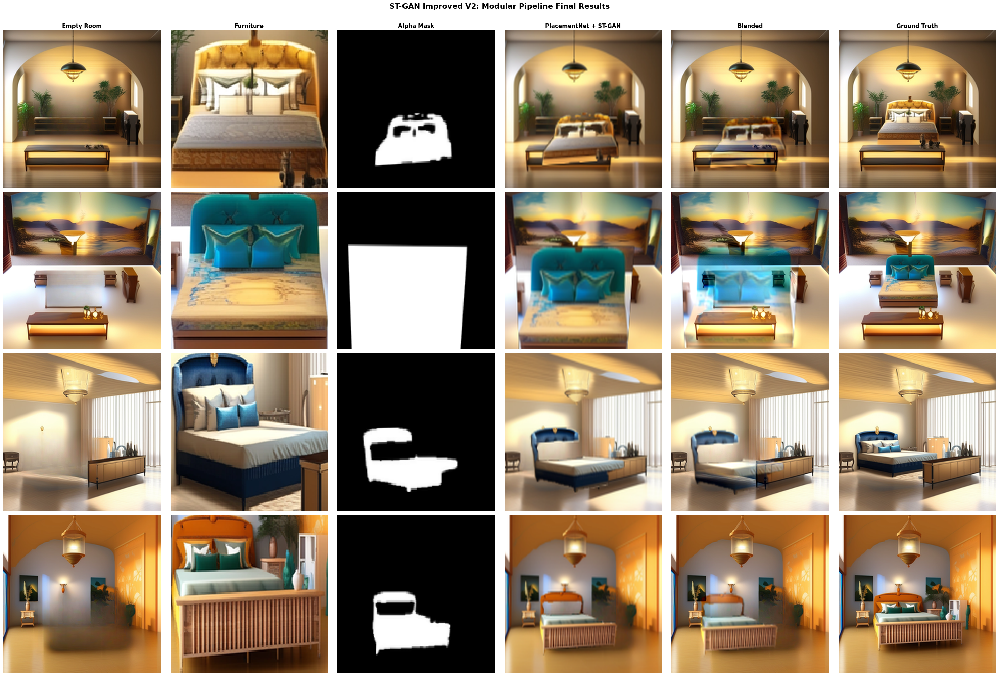


--- ST-GAN Improved V2 Complete ---
All outputs saved to: /content/drive/MyDrive/693-project/samples/stgan_v2


In [53]:
# Final summary visualization
n_final = min(4, len(e2e_results))
fig, axes = plt.subplots(n_final, 6, figsize=(30, 5 * n_final))
col_titles = ['Empty Room', 'Furniture', 'Alpha Mask', 'PlacementNet + ST-GAN', 'Blended', 'Ground Truth']

for i in range(n_final):
    r = e2e_results[i]
    row = test_df.iloc[i]

    furn_pil = Image.open(row['furniture_path']).convert('RGB')

    axes[i, 0].imshow(r['room'])
    axes[i, 1].imshow(furn_pil)
    axes[i, 2].imshow(np.array(r['warped_mask']), cmap='gray')
    axes[i, 3].imshow(r['stgan_refined'])
    axes[i, 4].imshow(r['blended'])
    axes[i, 5].imshow(r['target'])

    for j in range(6):
        axes[i, j].axis('off')
        if i == 0:
            axes[i, j].set_title(col_titles[j], fontsize=12, fontweight='bold')

plt.suptitle('ST-GAN Improved V2: Modular Pipeline Final Results',
             fontsize=16, fontweight='bold', y=1.005)
plt.tight_layout()
plt.savefig(os.path.join(SAMPLE_DIR, 'final_results_v2.png'), dpi=150, bbox_inches='tight')
plt.show()

print('\n--- ST-GAN Improved V2 Complete ---')
print(f'All outputs saved to: {SAMPLE_DIR}')